In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

In [2]:
# Imports
import sys
import numpy as np
from matplotlib import animation
from IPython.display import HTML
from matplotlib import pyplot as plt
plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg'
import mpl_toolkits.mplot3d.axes3d as p3

In [3]:
np.random.seed(20)
np.set_printoptions(threshold=sys.maxsize)

In [4]:
%matplotlib inline

# Data

In [5]:
# Read data
motion_05 = np.genfromtxt('../dataset2/motion_05.csv', delimiter=',')
print("Motion 0.5 data has a length of ", len(motion_05))

Motion 0.5 data has a length of  125545


## Visualizations

In [6]:
"""
    Plot a 4x2 grid of comparing data.
"""
def plot_non_overlapping_data(dataset, data:list, idxs: list):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4,2, figsize=(20,15))
    fig.suptitle('Heigh-Force (Idle)')

    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Height (FR)')

    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Force (FR)')

    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Height (FL)')

    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Force (FL)')

    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Height (RR)')

    ax6.plot(dataset[data[2], 0], datasetD[data[2], idxs[5]], 'g-')
    ax6.set_xlabel('Time')
    ax6.set_ylabel('Force (RR)')

    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_xlabel('Time')
    ax7.set_ylabel('Height (RL)')

    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_xlabel('Time')
    ax8.set_ylabel('Force (RL)')

    fig.tight_layout()

    plt.show()
 
"""
    Plot data on overlapping graph. 
"""
def plot_overlapping_data(title: str, dataset, data: list, idxs: list, draw_footsteps=None, footsteps_timestamp=None):
    fig, (ax1, ax3, ax5, ax7) = plt.subplots(4,1, figsize=(20,15))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(dataset[data[0], 0], dataset[data[0], idxs[0]], 'b-')
    ax1.set_ylabel('Height (FR)')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(dataset[data[0], 0], dataset[data[0], idxs[1]], 'g-')
    ax2.set_ylabel('Force (FR)', color='g')
          
    # FL plot (height)
    ax3.plot(dataset[data[1], 0], dataset[data[1], idxs[2]], 'b-')
    ax3.set_ylabel('Height (FL)')
    ax3.set_xlabel('Time')
         
    # FL plot (force)
    ax4 = ax3.twinx()
    ax4.plot(dataset[data[1], 0], dataset[data[1], idxs[3]], 'g-')
    ax4.set_ylabel('Force(FL)', color='g')      
          
    # RR plot (height)
    ax5.plot(dataset[data[2], 0], dataset[data[2], idxs[4]], 'b-')
    ax5.set_ylabel('Height (RR)')
    ax5.set_xlabel('Time')
         
    # RR plot (force)
    ax6 = ax5.twinx()
    ax6.plot(dataset[data[2], 0], dataset[data[2], idxs[5]], 'g-')
    ax6.set_ylabel('Force (RR)', color='g')   
          
    # RL plot (height)
    ax7.plot(dataset[data[3], 0], dataset[data[3], idxs[6]], 'b-')
    ax7.set_ylabel('Height (RL)')
    ax7.set_xlabel('Time')
         
    # RL plot (force)
    ax8 = ax7.twinx()
    ax8.plot(dataset[data[3], 0], dataset[data[3], idxs[7]], 'g-')
    ax8.set_ylabel('Force (RL)', color='g')

    for ax in [ax2, ax4, ax6, ax8]:
        for tl in ax.get_yticklabels():
            tl.set_color('g')
    
    # Draw footsteps
    if draw_footsteps:
        for ax in [ax1, ax3, ax5, ax7]:
            for footstep_timestamp in footsteps_timestamp:
                if footstep_timestamp <= max(dataset[data[0], 0]) and footstep_timestamp >= min(dataset[data[0], 0]):
                    #print("Timestamp: ", footstep_timestamp)
                    ax.axvline(x=footstep_timestamp, color='r', linestyle='-')
    
    fig.tight_layout()
    plt.show()

## Height-Force plots

In [7]:
"""
def get_specific_cmd(dataset, fwd, side, rot):
    return np.where(np.logical_and(dataset[:, 2] == fwd, 
                                   dataset[:, 3] == side, 
                                   dataset[:, 4] == rot))[0]
"""

def get_specific_cmd(dataset, fwd, side, rot):
    idxs = []
    for row_id, item in enumerate(dataset):
        if np.isclose(item[2], fwd, 0.01) and np.isclose(item[3], side, 0.01) and np.isclose(item[4], rot, 0.01):
            idxs.append(row_id)
    
    return idxs

In [8]:
def get_swinging_motions(dataset, height=-0.3):
    # FR min height (i.e swining motion)
    fr_min_height = np.where(dataset[:, 34] < height)[0]
    fl_min_height = np.where(dataset[:, 37] < height)[0]
    rr_min_height = np.where(dataset[:, 40] < height)[0]
    rl_min_height = np.where(dataset[:, 43] < height)[0]
            
    return fr_min_height,fl_min_height,rr_min_height,rl_min_height

## Motion_05

In [9]:
velocity = 0.518221

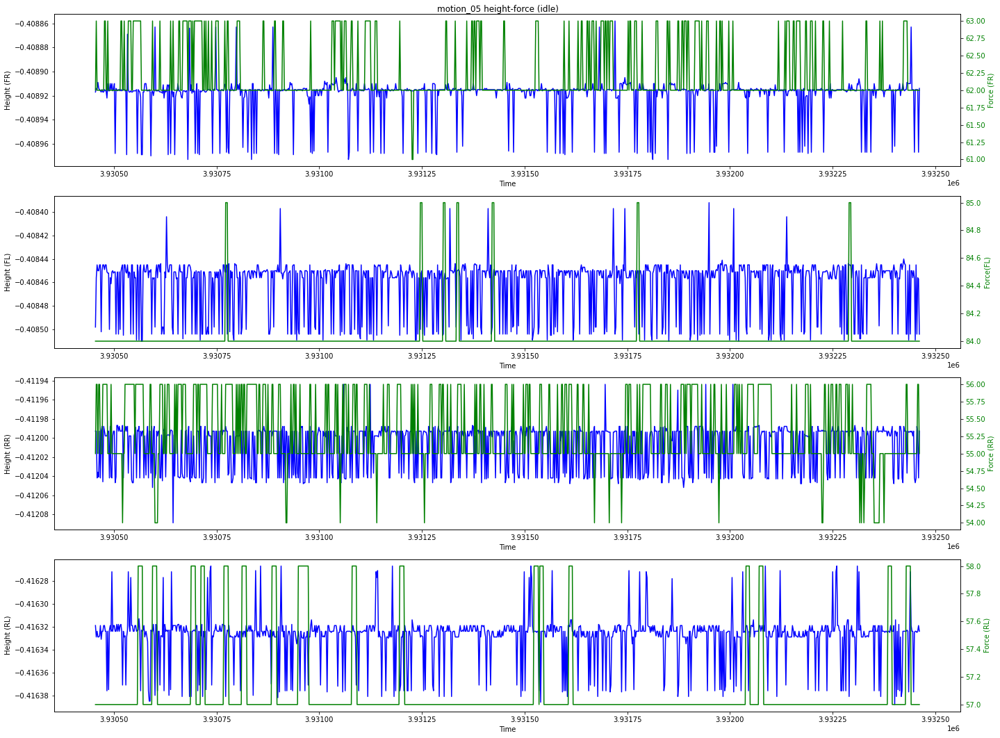

In [10]:
# Idle
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05)

sample_walking_fr_height = fr_min_height[:1000]
sample_walking_fl_height = fl_min_height[:1000]
sample_walking_rr_height = rr_min_height[:1000]
sample_walking_rl_height = rl_min_height[:1000]

plot_overlapping_data("motion_05 height-force (idle)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

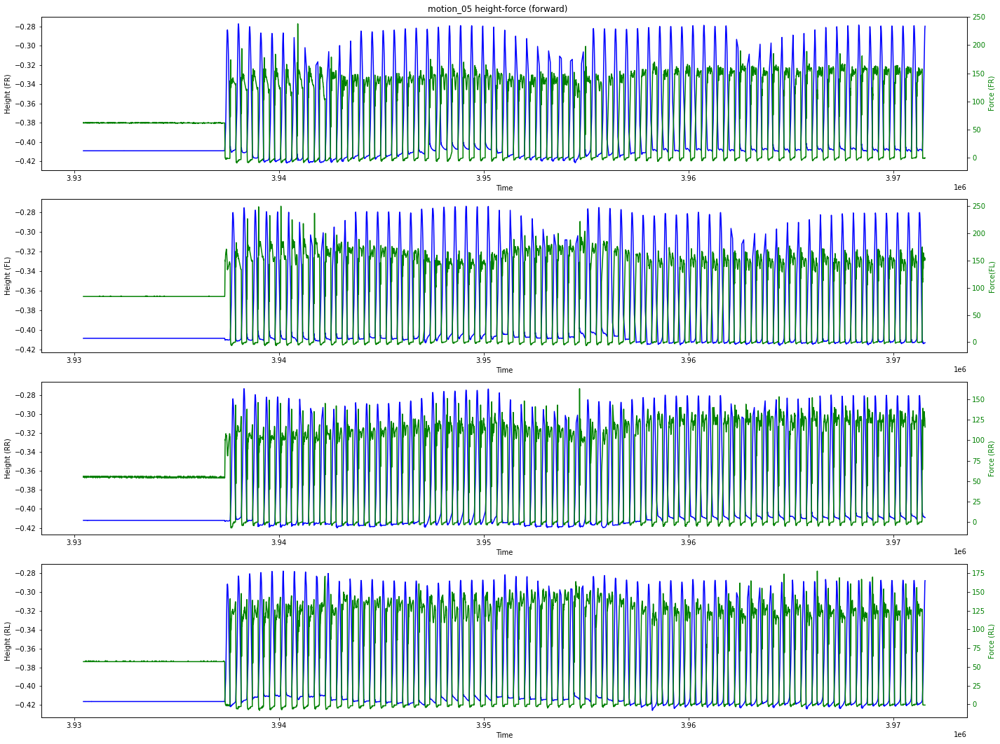

In [11]:
# Forward
fwd_cmds = get_specific_cmd(motion_05, velocity, 0, 0)
motion_05_fwd = motion_05[fwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_fwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (forward)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

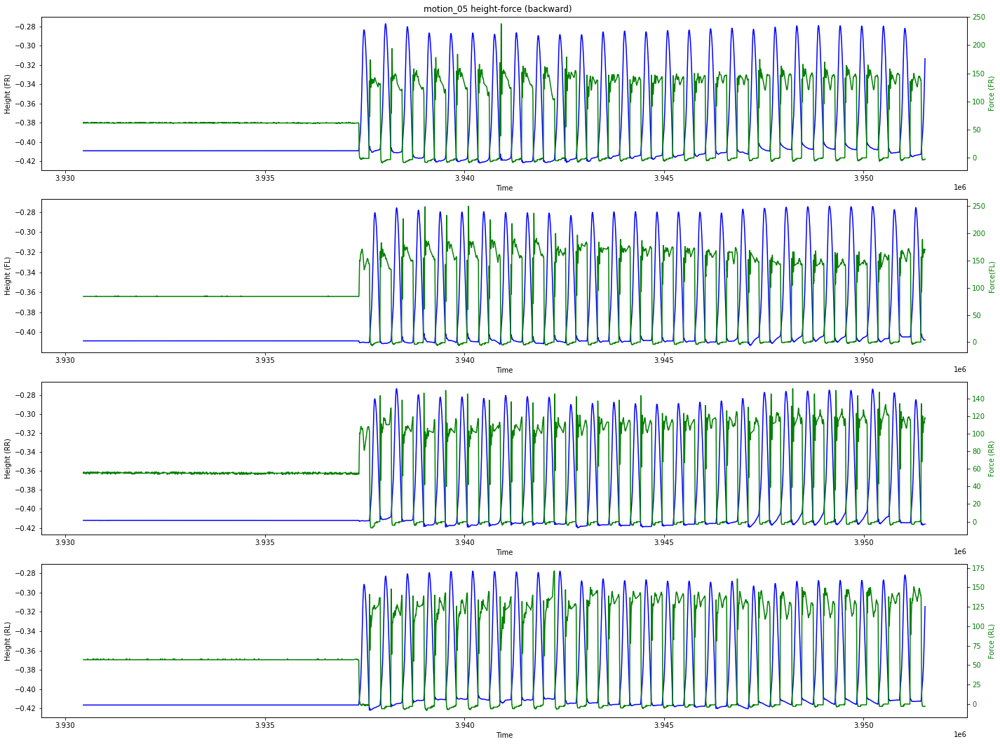

In [12]:
# Backwards
bwd_cmds = get_specific_cmd(motion_05, -velocity, 0, 0)
motion_05_bwd = motion_05[bwd_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_bwd)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (backward)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

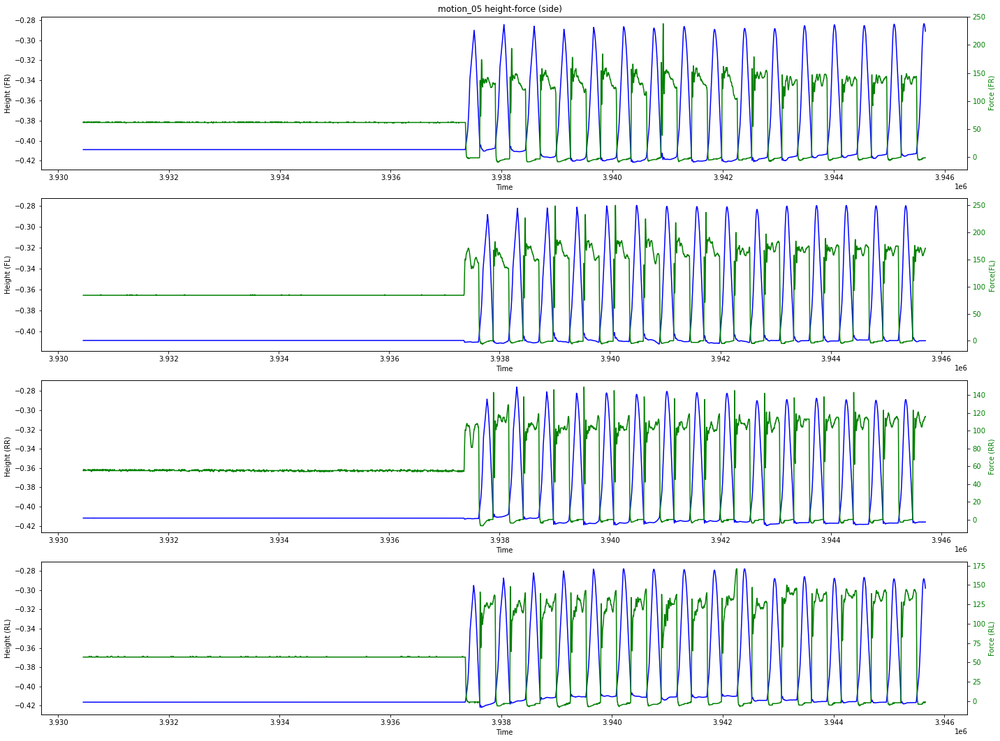

In [13]:
# Side (right)
side_cmds = get_specific_cmd(motion_05, 0, velocity, 0)
motion_05_side = motion_05[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (side)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

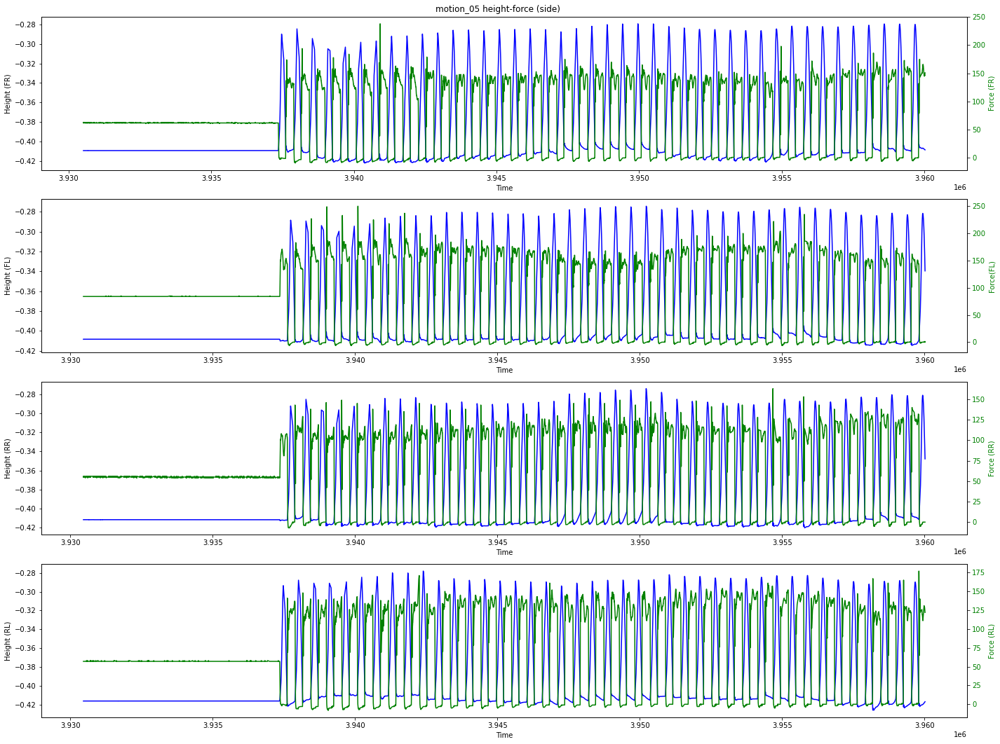

In [14]:
# Side (left)
side_cmds = get_specific_cmd(motion_05, 0, -velocity, 0)
motion_05_side = motion_05[side_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_side)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (side)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

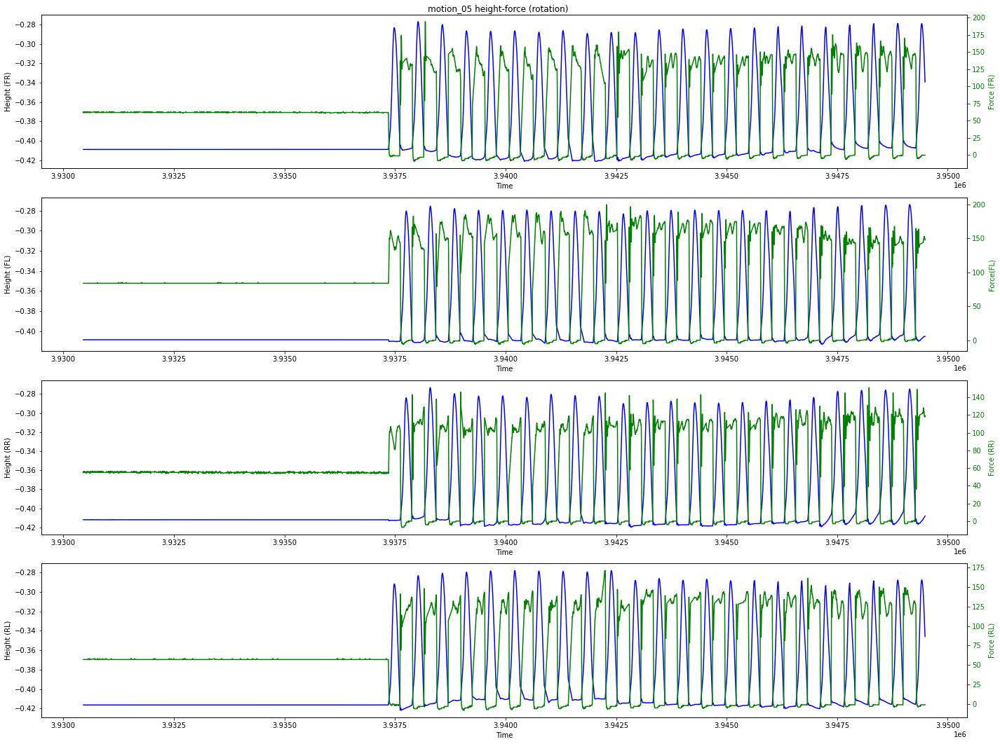

In [15]:
# Rotation (clockwise)
rot_cmds = get_specific_cmd(motion_05, 0, 0, velocity)
motion_05_rot = motion_05[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (rotation)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

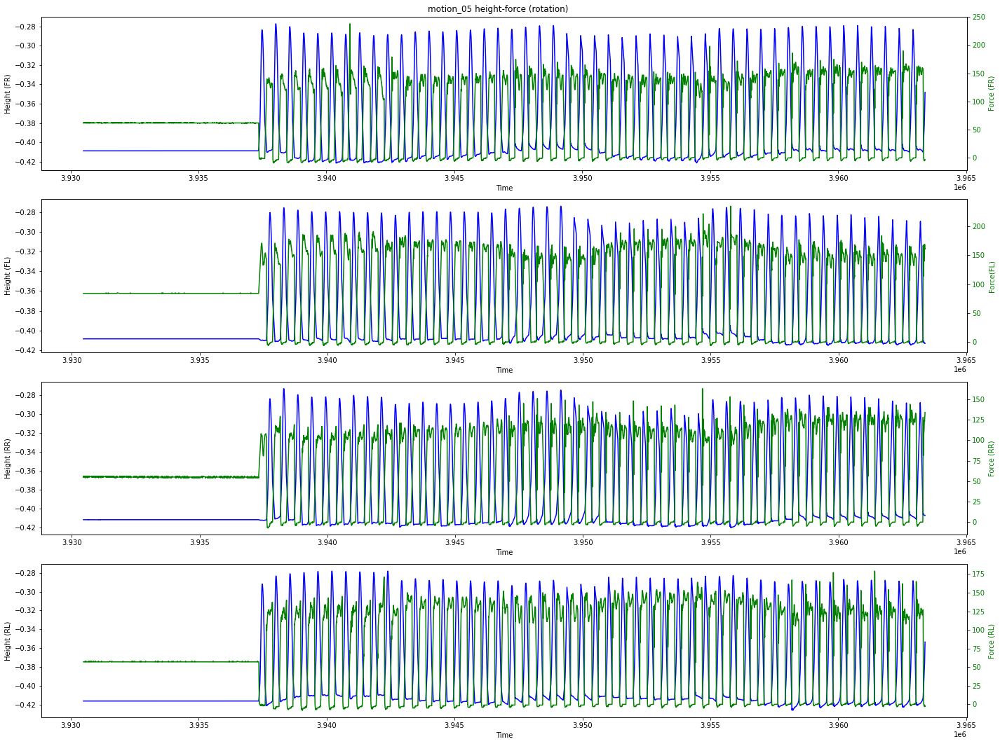

In [16]:
# Rotation (counter clockwise)
rot_cmds = get_specific_cmd(motion_05, 0, 0, -velocity)
motion_05_rot = motion_05[rot_cmds]
fr_min_height,fl_min_height,rr_min_height,rl_min_height = get_swinging_motions(motion_05_rot)

sample_walking_fr_height = fr_min_height
sample_walking_fl_height = fl_min_height
sample_walking_rr_height = rr_min_height
sample_walking_rl_height = rl_min_height

plot_overlapping_data("motion_05 height-force (rotation)",
                      motion_05,
                      [sample_walking_fr_height, 
                       sample_walking_fl_height, 
                       sample_walking_rr_height,
                       sample_walking_rl_height],
                       [34, 56, 37, 57, 40, 58, 43, 59])

## Footsteps Extraction (Height + Force)

In [17]:
def extract_footsteps(dataset, height_threshold=0.1, force_thresholds=[100,100,100,100]):
    # Compute height difference for FR and FL
    fr_fl_diff = np.round(abs(dataset[:, 34] - dataset[:, 37]), 9)

    # Compute height difference for RR and RL
    rr_rl_diff = np.round(abs(dataset[:, 40] - dataset[:, 43]), 9)

    # Compute compound difference for all foots
    height_diff = np.round(fr_fl_diff + rr_rl_diff, 9)
    print("Min and max diff between front and rear feet", min(height_diff), max(height_diff), "\n")
    
    # Find footsteps (based on height difference)
    footsteps_height = np.where(height_diff < height_threshold)[0]
    print("Amount of footsteps found with height criteria: ", len(footsteps_height), "\n")
    
    # Footsteps that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with motion commands: ", footsteps_due_to_motion, "\n")
    
    # Footsteps that belong to idle mode
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], footsteps_height))
    print("Intersection with no motion commands: ", footsteps_due_to_stationarity, "\n")
    
    # FR min height (i.e swining motion)
    rear_force_footsteps = np.where(np.logical_and(dataset[:, 58] > force_thresholds[0], 
                                                   dataset[:, 59] > force_thresholds[1]))[0]
    front_force_footsteps = np.where(np.logical_and(dataset[:, 56] > force_thresholds[2], 
                                                    dataset[:, 57] > force_thresholds[3]))[0]

    # Find footsteps that match force constraints on all foot
    footsteps_force = np.intersect1d(rear_force_footsteps, front_force_footsteps)
    print("Number of force footsteps: ", len(footsteps_force), "\n")
    
    # Find force and height footsteps intersection
    force_height_footsteps = np.intersect1d(footsteps_force, footsteps_height)
    print("Number of height-force footsteps: ", len(force_height_footsteps), "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_motion = len(np.intersect1d(np.where(np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to motion: ", footsteps_due_to_motion, "\n")
    
    # Footsteps (from force and height) that belong to motion commands
    footsteps_due_to_stationarity = len(np.intersect1d(np.where(~np.any(dataset[:, 2:5], axis=1))[0], force_height_footsteps))
    print("Number of footsteps extracted with height-force due to no motion: ", footsteps_due_to_stationarity, "\n")
    
    return force_height_footsteps

def footsteps_nms(dataset, footsteps):
    footsteps_nms = []

    footsteps_sort, timestamps_sort = zip(*sorted(zip(footsteps, dataset[footsteps, 0])))

    for idx, footstep_sort in enumerate(footsteps_sort):
        if idx > 0:
            if abs(dataset[footstep_sort, 0] - dataset[footsteps_sort[idx-1], 0]) < 9:
                continue
            else:
                footsteps_nms.append(footstep_sort)
        else:
            footsteps_nms.append(footstep_sort)

    return np.asarray(footsteps_nms)

## Footsteps

In [18]:
def footstep_extraction_and_plotting(dataset, velocities, height_threshold, force_thresholds, indexes):
    # Extract backward motion entries
    cmds = get_specific_cmd(dataset, velocities[0], velocities[1], velocities[2])
    motion_05_cmds = motion_05[cmds]
    fr_min_height, fl_min_height, rr_min_height, rl_min_height = get_swinging_motions(motion_05_cmds)
    print("Foot swinging motions lenghts: ", len(fr_min_height), len(fl_min_height), len(rr_min_height), len(rl_min_height))
    
    # Extract footsteps
    footsteps = extract_footsteps(motion_05_cmds, height_threshold, force_thresholds)
    print("Footsteps extracted: ", len(footsteps))
    
    # Footsteps NMS
    footsteps_after_nms = footsteps_nms(motion_05_cmds, footsteps)
    print("Footsteps after non-maximum-suppression: ", len(footsteps_after_nms))
    
    # Plot footsteps
    sample_walking_fr_height = fr_min_height[indexes]
    sample_walking_fl_height = fl_min_height[indexes]
    sample_walking_rr_height = rr_min_height[indexes]
    sample_walking_rl_height = rl_min_height[indexes]

    plot_overlapping_data("Footsteps",
                          motion_05_cmds,
                          [sample_walking_fr_height, 
                           sample_walking_fl_height, 
                           sample_walking_rr_height,
                           sample_walking_rl_height],
                           [34, 56, 37, 57, 40, 58, 43, 59],
                           True,
                           motion_05_cmds[footsteps_nms(motion_05_cmds, footsteps), 0])
    
    return motion_05_cmds, footsteps_after_nms

### Forward motion

Foot swinging motions lenghts:  17156 17280 18170 18425
Min and max diff between front and rear feet 0.000836 0.264705 

Amount of footsteps found with height criteria:  8481 

Intersection with motion commands:  8481 

Intersection with no motion commands:  0 

Number of force footsteps:  990 

Number of height-force footsteps:  990 

Number of footsteps extracted with height-force due to motion:  990 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  990
Footsteps after non-maximum-suppression:  154


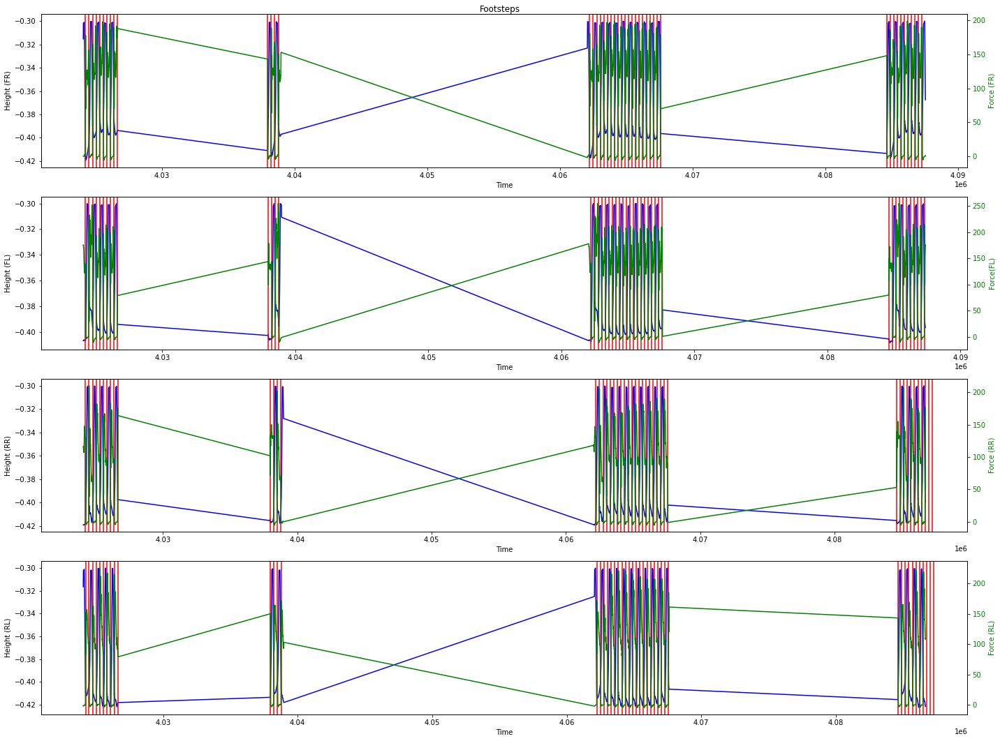

In [19]:
motion_05_fwd, footsteps_05_fwd = footstep_extraction_and_plotting(dataset=motion_05, velocities=[velocity, 0, 0], height_threshold=0.1, force_thresholds=[40,40,40,40], indexes=range(0, 5000))

### Backward motion

Foot swinging motions lenghts:  9338 9114 9095 9035
Min and max diff between front and rear feet 0.00151 0.276987 

Amount of footsteps found with height criteria:  4209 

Intersection with motion commands:  4209 

Intersection with no motion commands:  0 

Number of force footsteps:  279 

Number of height-force footsteps:  279 

Number of footsteps extracted with height-force due to motion:  279 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  279
Footsteps after non-maximum-suppression:  77


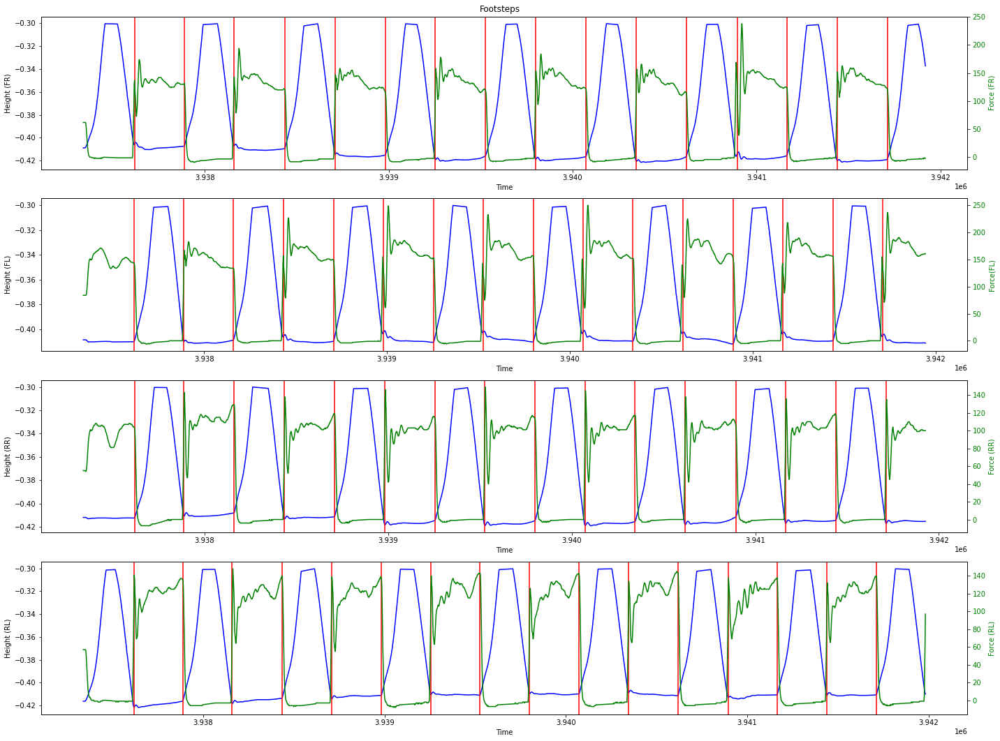

In [20]:
motion_05_bwd, footsteps_05_bwd = footstep_extraction_and_plotting(dataset=motion_05, velocities=[-velocity, 0, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 2000))

### Side motion (right)

Foot swinging motions lenghts:  6602 6481 6739 6697
Min and max diff between front and rear feet 0.002345 0.266081 

Amount of footsteps found with height criteria:  3040 

Intersection with motion commands:  3040 

Intersection with no motion commands:  0 

Number of force footsteps:  200 

Number of height-force footsteps:  200 

Number of footsteps extracted with height-force due to motion:  200 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  200
Footsteps after non-maximum-suppression:  55


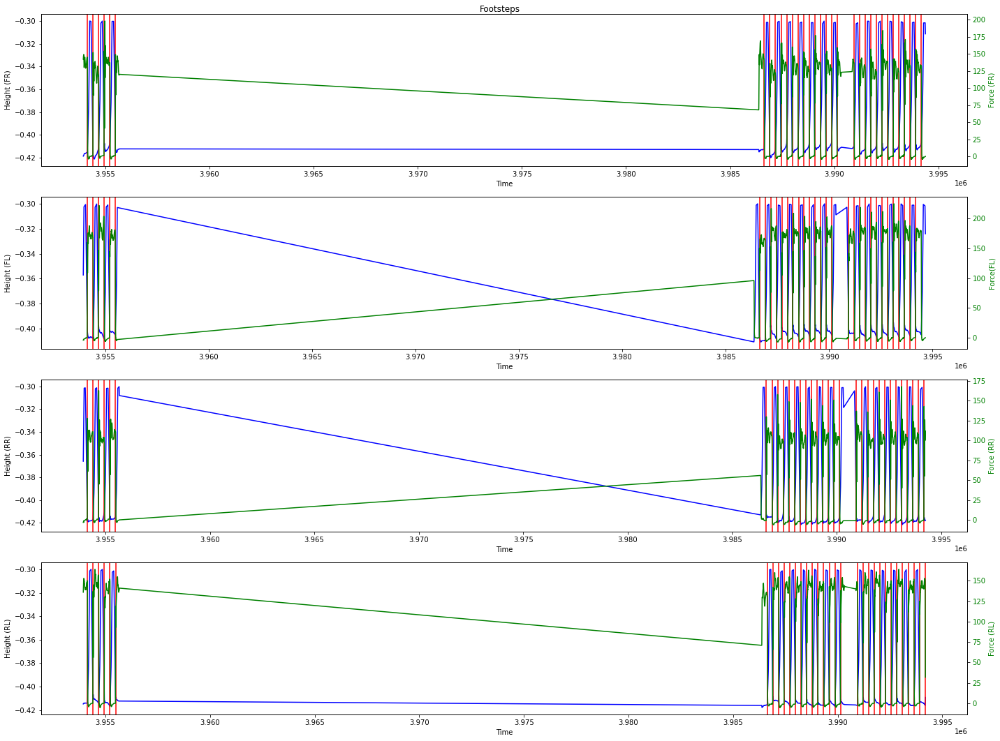

In [21]:
motion_05_side_right, footsteps_05_side_right = footstep_extraction_and_plotting(dataset=motion_05, velocities=[0, velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 4000))

### Side (left)

Foot swinging motions lenghts:  12730 12749 12841 13137
Min and max diff between front and rear feet 0.000622 0.267259 

Amount of footsteps found with height criteria:  5923 

Intersection with motion commands:  5923 

Intersection with no motion commands:  0 

Number of force footsteps:  435 

Number of height-force footsteps:  435 

Number of footsteps extracted with height-force due to motion:  435 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  435
Footsteps after non-maximum-suppression:  109


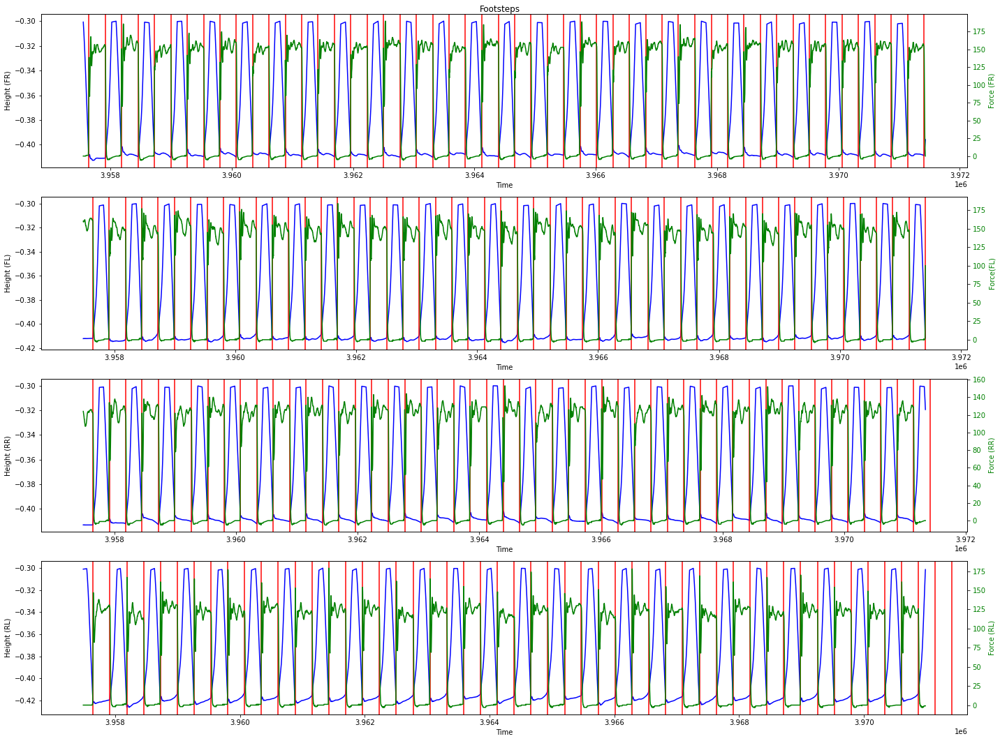

In [22]:
motion_05_side_left, footsteps_05_side_left = footstep_extraction_and_plotting(dataset=motion_05, velocities=[0, -velocity, 0], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 6000))

### Rotation (clockwise)

Foot swinging motions lenghts:  7879 8159 8273 7834
Min and max diff between front and rear feet 0.000304 0.26678 

Amount of footsteps found with height criteria:  3813 

Intersection with motion commands:  3813 

Intersection with no motion commands:  0 

Number of force footsteps:  257 

Number of height-force footsteps:  257 

Number of footsteps extracted with height-force due to motion:  257 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  257
Footsteps after non-maximum-suppression:  69


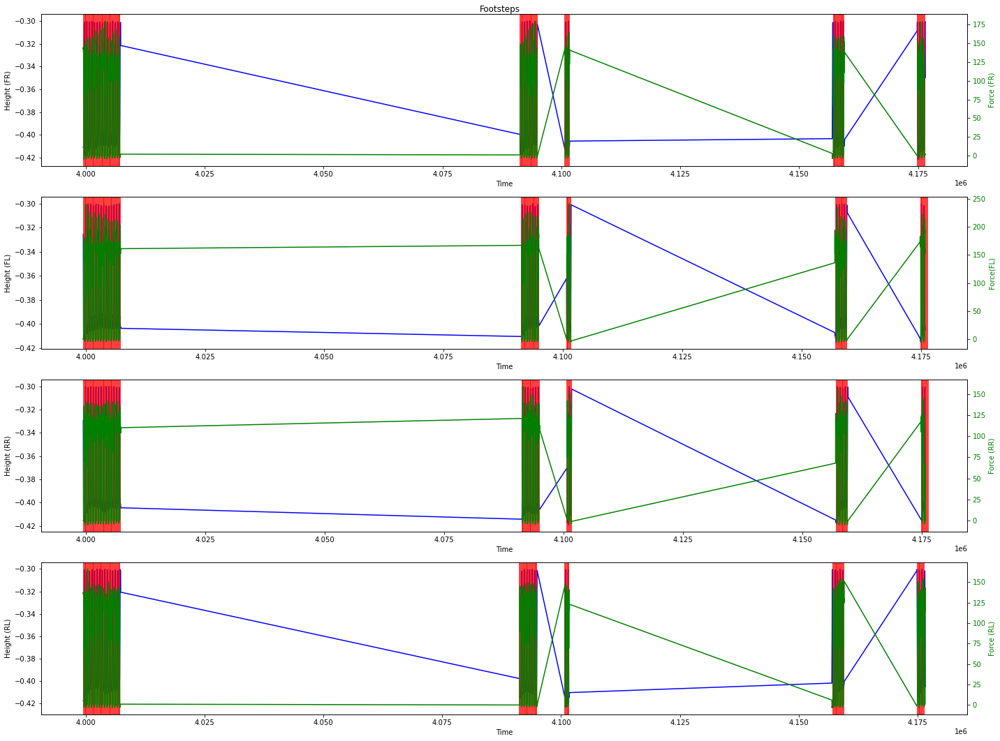

In [23]:
motion_05_clock, footsteps_05_clock = footstep_extraction_and_plotting(dataset=motion_05, velocities=[0, 0, velocity], height_threshold=0.1, force_thresholds=[90,90,90,90], indexes=range(0, 7000))

### Rotation (counter clockwise)

Foot swinging motions lenghts:  14244 13754 13890 14741
Min and max diff between front and rear feet 0.000625 0.273047 

Amount of footsteps found with height criteria:  6646 

Intersection with motion commands:  6646 

Intersection with no motion commands:  0 

Number of force footsteps:  459 

Number of height-force footsteps:  459 

Number of footsteps extracted with height-force due to motion:  459 

Number of footsteps extracted with height-force due to no motion:  0 

Footsteps extracted:  459
Footsteps after non-maximum-suppression:  122


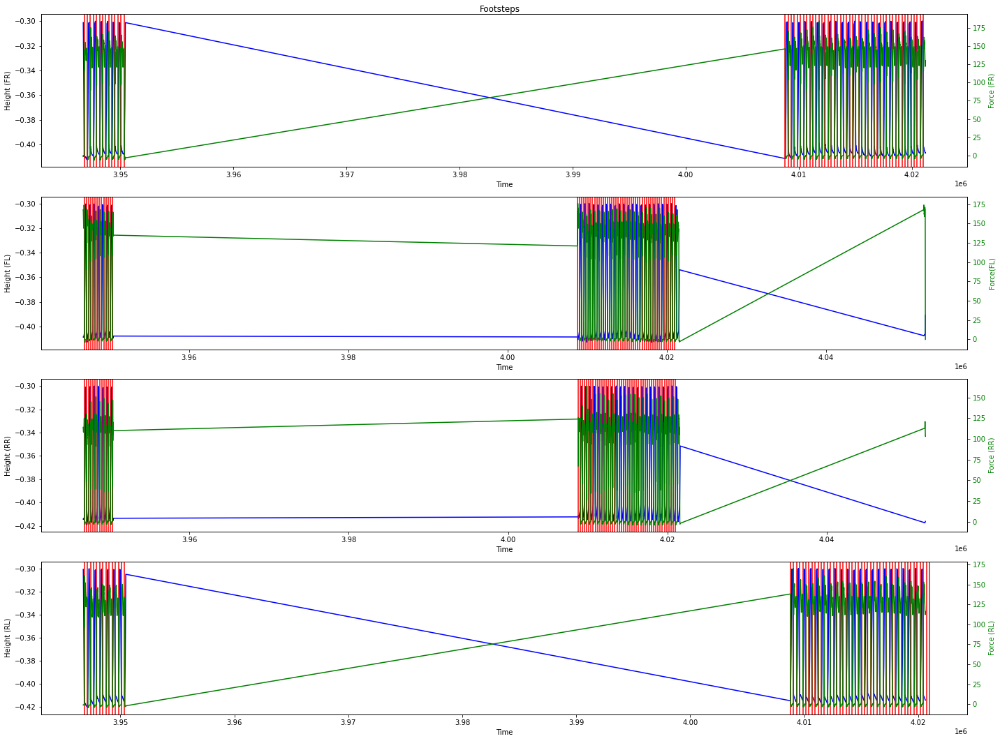

In [24]:
motion_05_count, footsteps_05_count = footstep_extraction_and_plotting(dataset=motion_05, velocities=[0, 0, -velocity], height_threshold=0.1, force_thresholds=[80,80,80,80], indexes=range(0, 7000))

### Step size

In [25]:
def get_step_size(dataset, footsteps, idx_coord=[32,35,38,41]):
    # Footsteps sizes
    step_size_fr = []
    step_size_fl = []
    step_size_rr = []
    step_size_rl = []
    footstep_period = []
    
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                footstep_period.append(time_diff)
                step_size_fr.append(dataset[footsteps[idx], idx_coord[0]] - dataset[footsteps[idx-1], idx_coord[0]])
                step_size_fl.append(dataset[footsteps[idx], idx_coord[1]] - dataset[footsteps[idx-1], idx_coord[1]])
                step_size_rr.append(dataset[footsteps[idx], idx_coord[2]] - dataset[footsteps[idx-1], idx_coord[2]])
                step_size_rl.append(dataset[footsteps[idx], idx_coord[3]] - dataset[footsteps[idx-1], idx_coord[3]])
    
    # Convert to numpy array
    step_size_fr_numpy = np.array(step_size_fr)
    step_size_fl_numpy = np.array(step_size_fl)
    step_size_rr_numpy = np.array(step_size_rr)
    step_size_rl_numpy = np.array(step_size_rl)
    footstep_period_numpy = np.array(footstep_period)
    
    # Only keep positive footsteps
    step_size_fr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_fl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rr_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    step_size_rl_numpy = step_size_fr_numpy[np.where(step_size_fr_numpy > 0)[0]]
    
    # Print average step-size
    print("Avg. step size time: ", np.mean(footstep_period_numpy))
    print("Avg. step size for FR foot: ", np.mean(step_size_fr_numpy))
    print("Avg. step size for FL foot: ", np.mean(step_size_fl_numpy))
    print("Avg. step size for RR foot: ", np.mean(step_size_rr_numpy))
    print("Avg. step size for RL foot: ", np.mean(step_size_rl_numpy), '\n')

    # Print std. dev. step-size
    print("Std. dev. step size for FR foot: ", np.std(step_size_fr_numpy))
    print("Std. dev. step size for FL foot: ", np.std(step_size_fl_numpy))
    print("Std. dev. step size for RR foot: ", np.std(step_size_rr_numpy))
    print("Std. dev. step size for RL foot: ", np.std(step_size_rl_numpy), '\n')
    
    return step_size_fr_numpy, step_size_fl_numpy, step_size_rr_numpy, step_size_rl_numpy

#### Forward motion

In [26]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_fwd, footsteps_05_fwd)

Avg. step size time:  267.11034482758623
Avg. step size for FR foot:  0.19309694285714285
Avg. step size for FL foot:  0.19309694285714285
Avg. step size for RR foot:  0.19309694285714285
Avg. step size for RL foot:  0.19309694285714285 

Std. dev. step size for FR foot:  0.01938763087116976
Std. dev. step size for FL foot:  0.01938763087116976
Std. dev. step size for RR foot:  0.01938763087116976
Std. dev. step size for RL foot:  0.01938763087116976 



In [27]:
step_size_fr_x

array([0.216527, 0.189774, 0.20525 , 0.199957, 0.225157, 0.215293,
       0.191413, 0.20681 , 0.202991, 0.200951, 0.195269, 0.197533,
       0.191914, 0.191959, 0.18875 , 0.224949, 0.189503, 0.202079,
       0.20071 , 0.194784, 0.193467, 0.192598, 0.148693, 0.226065,
       0.2198  , 0.193528, 0.185531, 0.202055, 0.196232, 0.19822 ,
       0.195694, 0.194404, 0.19488 , 0.194802, 0.196518, 0.193261,
       0.188169, 0.18902 , 0.189379, 0.188849, 0.189587, 0.14383 ,
       0.222532, 0.18894 , 0.187667, 0.190777, 0.190209, 0.192805,
       0.190721, 0.192346, 0.188449, 0.18972 , 0.18754 , 0.078215,
       0.23144 , 0.183921, 0.191381, 0.193438, 0.189154, 0.193993,
       0.191927, 0.190176, 0.188193, 0.190686, 0.188081, 0.186166,
       0.186909, 0.187794, 0.189048, 0.188403])

In [28]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_fwd, footsteps_05_fwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  267.11034482758623
Avg. step size for FR foot:  0.01784416231884058
Avg. step size for FL foot:  0.01784416231884058
Avg. step size for RR foot:  0.01784416231884058
Avg. step size for RL foot:  0.01784416231884058 

Std. dev. step size for FR foot:  0.017478343619910946
Std. dev. step size for FL foot:  0.017478343619910946
Std. dev. step size for RR foot:  0.017478343619910946
Std. dev. step size for RL foot:  0.017478343619910946 



### Backward motion

In [29]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_bwd, footsteps_05_bwd)

Avg. step size time:  272.5890410958904
Avg. step size for FR foot:  0.07858730555555554
Avg. step size for FL foot:  0.07858730555555554
Avg. step size for RR foot:  0.07858730555555554
Avg. step size for RL foot:  0.07858730555555554 

Std. dev. step size for FR foot:  0.012529594222434264
Std. dev. step size for FL foot:  0.012529594222434264
Std. dev. step size for RR foot:  0.012529594222434264
Std. dev. step size for RL foot:  0.012529594222434264 



In [30]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_bwd, footsteps_05_bwd, idx_coord=[33, 36, 39, 42])

Avg. step size time:  272.5890410958904
Avg. step size for FR foot:  0.028365263157894737
Avg. step size for FL foot:  0.028365263157894737
Avg. step size for RR foot:  0.028365263157894737
Avg. step size for RL foot:  0.028365263157894737 

Std. dev. step size for FR foot:  0.011744626566813687
Std. dev. step size for FL foot:  0.011744626566813687
Std. dev. step size for RR foot:  0.011744626566813687
Std. dev. step size for RL foot:  0.011744626566813687 



### Side motion (right)

In [31]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_side_right, footsteps_05_side_right)

Avg. step size time:  269.52941176470586
Avg. step size for FR foot:  0.003257551724137932
Avg. step size for FL foot:  0.003257551724137932
Avg. step size for RR foot:  0.003257551724137932
Avg. step size for RL foot:  0.003257551724137932 

Std. dev. step size for FR foot:  0.002137355949349843
Std. dev. step size for FL foot:  0.002137355949349843
Std. dev. step size for RR foot:  0.002137355949349843
Std. dev. step size for RL foot:  0.002137355949349843 



In [32]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_side_right, footsteps_05_side_right, idx_coord=[33, 36, 39, 42])

Avg. step size time:  269.52941176470586
Avg. step size for FR foot:  0.038572423076923074
Avg. step size for FL foot:  0.038572423076923074
Avg. step size for RR foot:  0.038572423076923074
Avg. step size for RL foot:  0.038572423076923074 

Std. dev. step size for FR foot:  0.016543360688187493
Std. dev. step size for FL foot:  0.016543360688187493
Std. dev. step size for RR foot:  0.016543360688187493
Std. dev. step size for RL foot:  0.016543360688187493 



### Side motions (left)

In [33]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_side_left, footsteps_05_side_left)

Avg. step size time:  269.87735849056605
Avg. step size for FR foot:  0.016639830188679247
Avg. step size for FL foot:  0.016639830188679247
Avg. step size for RR foot:  0.016639830188679247
Avg. step size for RL foot:  0.016639830188679247 

Std. dev. step size for FR foot:  0.002333431506131178
Std. dev. step size for FL foot:  0.002333431506131178
Std. dev. step size for RR foot:  0.002333431506131178
Std. dev. step size for RL foot:  0.002333431506131178 



In [34]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_side_left, footsteps_05_side_left, idx_coord=[33, 36, 39, 42])

Avg. step size time:  269.87735849056605
Avg. step size for FR foot:  0.026541403846153847
Avg. step size for FL foot:  0.026541403846153847
Avg. step size for RR foot:  0.026541403846153847
Avg. step size for RL foot:  0.026541403846153847 

Std. dev. step size for FR foot:  0.008968956817523462
Std. dev. step size for FL foot:  0.008968956817523462
Std. dev. step size for RR foot:  0.008968956817523462
Std. dev. step size for RL foot:  0.008968956817523462 



### Rotation (clockwise)

In [35]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_clock, footsteps_05_clock)

Avg. step size time:  270.6190476190476
Avg. step size for FR foot:  0.035999645161290325
Avg. step size for FL foot:  0.035999645161290325
Avg. step size for RR foot:  0.035999645161290325
Avg. step size for RL foot:  0.035999645161290325 

Std. dev. step size for FR foot:  0.009472786848680862
Std. dev. step size for FL foot:  0.009472786848680862
Std. dev. step size for RR foot:  0.009472786848680862
Std. dev. step size for RL foot:  0.009472786848680862 



In [36]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_clock, footsteps_05_clock, idx_coord=[33, 36, 39, 42])

Avg. step size time:  270.6190476190476
Avg. step size for FR foot:  0.051711774193548395
Avg. step size for FL foot:  0.051711774193548395
Avg. step size for RR foot:  0.051711774193548395
Avg. step size for RL foot:  0.051711774193548395 

Std. dev. step size for FR foot:  0.014670105766731062
Std. dev. step size for FL foot:  0.014670105766731062
Std. dev. step size for RR foot:  0.014670105766731062
Std. dev. step size for RL foot:  0.014670105766731062 



### Rotation (counter clockwise)

In [37]:
# Step size and velocity along x axis 
step_size_fr_x,_,_,_ = get_step_size(motion_05_count, footsteps_05_count)

Avg. step size time:  271.0701754385965
Avg. step size for FR foot:  0.01884186666666667
Avg. step size for FL foot:  0.01884186666666667
Avg. step size for RR foot:  0.01884186666666667
Avg. step size for RL foot:  0.01884186666666667 

Std. dev. step size for FR foot:  0.004044131379611148
Std. dev. step size for FL foot:  0.004044131379611148
Std. dev. step size for RR foot:  0.004044131379611148
Std. dev. step size for RL foot:  0.004044131379611148 



In [38]:
# Step size along y axis 
_,_,_,_ = get_step_size(motion_05_count, footsteps_05_count, idx_coord=[33, 36, 39, 42])

Avg. step size time:  271.0701754385965
Avg. step size for FR foot:  0.04525197413793104
Avg. step size for FL foot:  0.04525197413793104
Avg. step size for RR foot:  0.04525197413793104
Avg. step size for RL foot:  0.04525197413793104 

Std. dev. step size for FR foot:  0.00293903249800528
Std. dev. step size for FL foot:  0.00293903249800528
Std. dev. step size for RR foot:  0.00293903249800528
Std. dev. step size for RL foot:  0.00293903249800528 



### Footstep visualization

In [39]:
def visualize_static_foosteps(dataset, footsteps):
    old_xs = None
    old_ys = None
    old_zs = None
    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
        
        time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
        #if time_diff < 300:
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()

        #print(xs, ys, zs, dataset[footstep, 2:5], dataset[footstep, 25:28])
        if idx > 0 and idx < len(footsteps):
            print(f'Diff: {time_diff}. Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}. Step size: {[xs[0]-old_xs[0], ys[0]-old_ys[0], zs[0]-old_zs[0]]}.')
        else:
            print(f'Command: {dataset[footstep, 2:5]}. State: {dataset[footstep, 25:28]}. Coord: {[xs[0], ys[0], zs[0]]}.')
            
        old_xs = xs
        old_ys = ys
        old_zs = zs

In [40]:
def update_points(num, dataset, footsteps, x, y, z, points):    
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    new_y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    new_z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, footsteps, x, y, z, points))
    
    return anim   

In [41]:
def update_prediction_points(dataset, num, x, y, z, points):  
    # Starting footstep index
    footstep = footsteps[num]
    
    # Round footsteps position
    D[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    new_x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    new_y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    new_z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    # update properties
    points.set_data(new_x, new_y)
    points.set_3d_properties(new_z, 'z')

    # return modified artists
    return points

def visualize_predicted_animated_footsteps(dataset, footsteps, style: str):
    # Create figure
    fig = plt.figure()
    ax = p3.Axes3D(fig)

    # Setting the axes properties
    ax.set_xlim3d([-0.4, 0.4])
    ax.set_xlabel('X')

    ax.set_ylim3d([-0.2, 0.2])
    ax.set_ylabel('Y')

    ax.set_zlim3d([-0.5, 0.5])
    ax.set_zlabel('Z')

    # Starting footstep index
    footstep = footsteps[0]

    # Round footsteps position
    D[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)

    # Initial footsteps 3D positions
    x = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
    y = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
    z = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])

    txt = fig.suptitle('')
    points, = ax.plot(x, y, z, style)
    
    # blit=True re-draws only the parts that have changed.
    anim = animation.FuncAnimation(fig, update_points, frames=len(footsteps), fargs=(dataset, x, y, z, points))
    
    return anim   

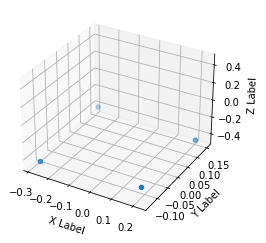

Time diff:  257.0
Footstep timestamp:  4024234.0
Height check index:  134
Height check timestamp:  4024334.0

FL moving: 0.09455600000000003. FR moving: 0.00172300000000003
RL moving: 0.001917000000000002. RR moving: 0.097186

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.417395. FR later: -0.415672
RR moving: -0.406849. RL moving: -0.312293

Coord FR: [0.195, -0.11, -0.417]. Coord FL: [0.221, 0.129, -0.407]. Coord RR: [-0.262, -0.133, -0.417]. Coord RL: [-0.286, 0.151, -0.41]

FR step_size: 0.12198900000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.14237300000000006.


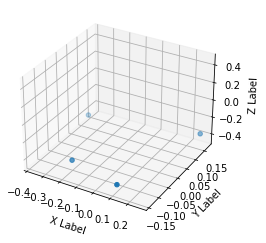

Time diff:  277.0
Footstep timestamp:  4024491.0
Height check index:  262
Height check timestamp:  4024591.0

FL moving: 0.002593999999999985. FR moving: 0.077374
RL moving: 0.07379799999999997. RR moving: 0.003230999999999984

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.403225. FR later: -0.325851
RR moving: -0.379988. RL moving: -0.382582

Coord FR: [0.113, -0.14, -0.403]. Coord FL: [0.261, 0.168, -0.38]. Coord RR: [-0.204, -0.099, -0.406]. Coord RL: [-0.371, 0.114, -0.402]

FR step_size: 0.38858790000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.39942.


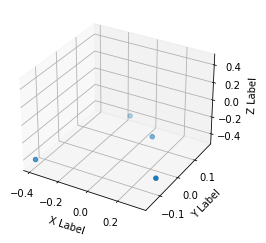

Time diff:  267.0
Footstep timestamp:  4024768.0
Height check index:  400
Height check timestamp:  4024868.0

FL moving: 0.08970500000000003. FR moving: 0.009958999999999996
RL moving: 0.007242000000000026. RR moving: 0.089397

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38975. FR later: -0.399709
RR moving: -0.396627. RL moving: -0.306922

Coord FR: [0.33, -0.079, -0.39]. Coord FL: [0.089, 0.102, -0.397]. Coord RR: [-0.389, -0.152, -0.411]. Coord RL: [-0.156, 0.174, -0.406]

FR step_size: 0.424616. FL step_size: 0. RR step size: 0. RL step_size: 0.40114400000000006.


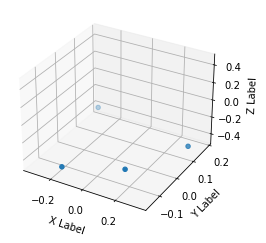

Time diff:  261.0
Footstep timestamp:  4025035.0
Height check index:  532
Height check timestamp:  4025134.0

FL moving: 0.00577500000000003. FR moving: 0.08926600000000001
RL moving: 0.08700199999999997. RR moving: 0.0072429999999999994

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394357. FR later: -0.305091
RR moving: -0.391833. RL moving: -0.397608

Coord FR: [0.148, -0.078, -0.394]. Coord FL: [0.332, 0.113, -0.392]. Coord RR: [-0.157, -0.152, -0.398]. Coord RL: [-0.325, 0.185, -0.415]

FR step_size: 0.361827. FL step_size: 0. RR step size: 0. RL step_size: 0.36890599999999996.


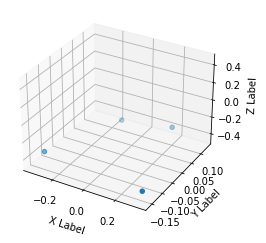

Time diff:  271.0
Footstep timestamp:  4025296.0
Height check index:  662
Height check timestamp:  4025395.0

FL moving: 0.08315600000000001. FR moving: 0.011073
RL moving: 0.005732000000000015. RR moving: 0.08208399999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.382904. FR later: -0.393977
RR moving: -0.397339. RL moving: -0.314183

Coord FR: [0.338, -0.158, -0.383]. Coord FL: [0.16, 0.133, -0.397]. Coord RR: [-0.342, -0.119, -0.406]. Coord RL: [-0.141, 0.105, -0.408]

FR step_size: 0.37753400000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38727600000000006.


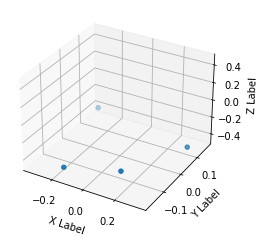

Time diff:  265.0
Footstep timestamp:  4025567.0
Height check index:  797
Height check timestamp:  4025666.0

FL moving: 0.006847999999999965. FR moving: 0.08610200000000001
RL moving: 0.08557400000000004. RR moving: 0.00975100000000001

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393777. FR later: -0.307675
RR moving: -0.391641. RL moving: -0.398489

Coord FR: [0.14, -0.115, -0.394]. Coord FL: [0.34, 0.084, -0.392]. Coord RR: [-0.152, -0.175, -0.396]. Coord RL: [-0.338, 0.161, -0.418]

FR step_size: 0.38969300000000007. FL step_size: 0. RR step size: 0. RL step_size: 0.39460300000000004.


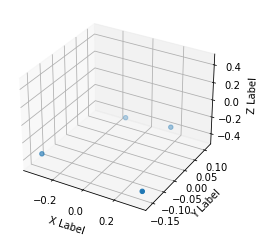

Time diff:  269.0
Footstep timestamp:  4025832.0
Height check index:  929
Height check timestamp:  4025931.0

FL moving: 0.086252. FR moving: 0.010802000000000034
RL moving: 0.005849999999999966. RR moving: 0.08557199999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.384773. FR later: -0.395575
RR moving: -0.39955. RL moving: -0.313298

Coord FR: [0.346, -0.161, -0.385]. Coord FL: [0.156, 0.112, -0.4]. Coord RR: [-0.345, -0.135, -0.407]. Coord RL: [-0.136, 0.101, -0.411]

FR step_size: 0.383885. FL step_size: 0. RR step size: 0. RL step_size: 0.39747899999999997.


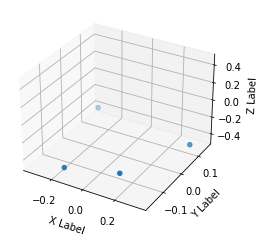

Time diff:  265.0
Footstep timestamp:  4026101.0
Height check index:  1063
Height check timestamp:  4026200.0

FL moving: 0.004608999999999974. FR moving: 0.089926
RL moving: 0.08914699999999998. RR moving: 0.007826

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394397. FR later: -0.304471
RR moving: -0.394384. RL moving: -0.398993

Coord FR: [0.146, -0.122, -0.394]. Coord FL: [0.34, 0.093, -0.394]. Coord RR: [-0.147, -0.169, -0.398]. Coord RL: [-0.335, 0.151, -0.418]

FR step_size: 0.38633700000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.39176500000000003.


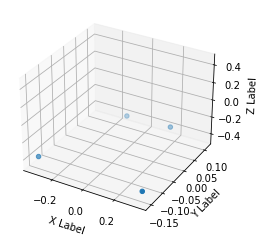

Time diff:  268.0
Footstep timestamp:  4026366.0
Height check index:  1195
Height check timestamp:  4026465.0

FL moving: 0.08800899999999995. FR moving: 0.010823000000000027
RL moving: 0.0045520000000000005. RR moving: 0.086204

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385094. FR later: -0.395917
RR moving: -0.399925. RL moving: -0.311916

Coord FR: [0.346, -0.154, -0.385]. Coord FL: [0.154, 0.112, -0.4]. Coord RR: [-0.342, -0.142, -0.406]. Coord RL: [-0.138, 0.11, -0.412]

FR step_size: 0.38533999999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.390856.


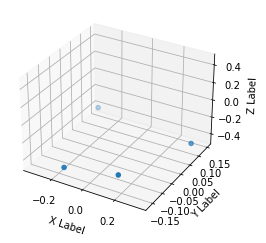

Time diff:  11335.0


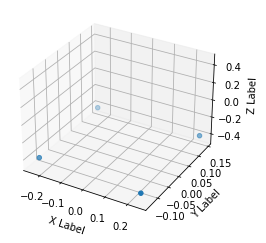

Time diff:  267.0
Footstep timestamp:  4037969.0
Height check index:  1330
Height check timestamp:  4038069.0

FL moving: 0.0033150000000000124. FR moving: 0.09893599999999997
RL moving: 0.098107. RR moving: 0.0013400000000000079

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.411039. FR later: -0.312103
RR moving: -0.402852. RL moving: -0.406167

Coord FR: [0.238, -0.134, -0.411]. Coord FL: [0.244, 0.143, -0.403]. Coord RR: [-0.237, -0.122, -0.415]. Coord RL: [-0.241, 0.141, -0.414]

FR step_size: 0.06426899999999997. FL step_size: 0. RR step size: 0. RL step_size: 0.069214.


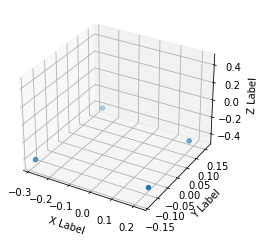

Time diff:  257.0
Footstep timestamp:  4038236.0
Height check index:  1463
Height check timestamp:  4038336.0

FL moving: 0.094412. FR moving: 0.0016680000000000028
RL moving: 0.0022749999999999715. RR moving: 0.093559

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414339. FR later: -0.412671
RR moving: -0.40579. RL moving: -0.311378

Coord FR: [0.219, -0.106, -0.414]. Coord FL: [0.199, 0.125, -0.406]. Coord RR: [-0.285, -0.136, -0.412]. Coord RL: [-0.263, 0.159, -0.407]

FR step_size: 0.18473. FL step_size: 0. RR step size: 0. RL step_size: 0.20512899999999998.


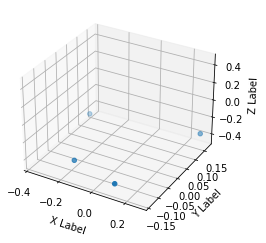

Time diff:  275.0
Footstep timestamp:  4038493.0
Height check index:  1591
Height check timestamp:  4038593.0

FL moving: 0.0042380000000000195. FR moving: 0.07728499999999999
RL moving: 0.07276700000000003. RR moving: 0.004794999999999994

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.400894. FR later: -0.323609
RR moving: -0.378806. RL moving: -0.383044

Coord FR: [0.112, -0.138, -0.401]. Coord FL: [0.277, 0.168, -0.379]. Coord RR: [-0.187, -0.096, -0.403]. Coord RL: [-0.37, 0.121, -0.401]

FR step_size: 0.4039676. FL step_size: 0. RR step size: 0. RL step_size: 0.407728.


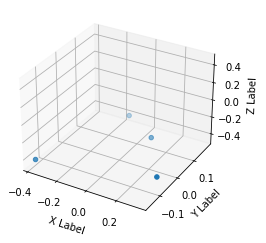

Time diff:  23467.0


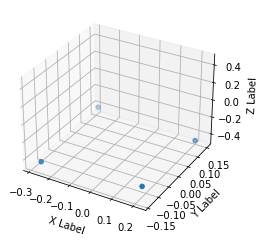

Time diff:  257.0
Footstep timestamp:  4062235.0
Height check index:  1916
Height check timestamp:  4062335.0

FL moving: 0.09351500000000001. FR moving: 1.4999999999987246e-05
RL moving: 0.0016739999999999533. RR moving: 0.094163

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.415294. FR later: -0.415279
RR moving: -0.407576. RL moving: -0.314061

Coord FR: [0.194, -0.112, -0.415]. Coord FL: [0.221, 0.126, -0.408]. Coord RR: [-0.261, -0.139, -0.416]. Coord RL: [-0.289, 0.15, -0.412]

FR step_size: 0.12315599999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.14072.


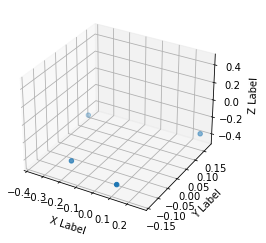

Time diff:  277.0
Footstep timestamp:  4062492.0
Height check index:  2044
Height check timestamp:  4062592.0

FL moving: 0.002503000000000033. FR moving: 0.07518899999999995
RL moving: 0.07198200000000005. RR moving: 0.0031050000000000244

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402869. FR later: -0.32768
RR moving: -0.380223. RL moving: -0.382726

Coord FR: [0.114, -0.137, -0.403]. Coord FL: [0.264, 0.17, -0.38]. Coord RR: [-0.202, -0.1, -0.405]. Coord RL: [-0.371, 0.116, -0.403]

FR step_size: 0.3878533. FL step_size: 0. RR step size: 0. RL step_size: 0.399028.


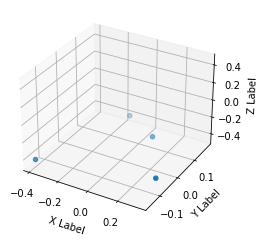

Time diff:  267.0
Footstep timestamp:  4062769.0
Height check index:  2182
Height check timestamp:  4062869.0

FL moving: 0.08814499999999997. FR moving: 0.010682999999999998
RL moving: 0.008667000000000036. RR moving: 0.08858400000000005

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388801. FR later: -0.399484
RR moving: -0.396124. RL moving: -0.307979

Coord FR: [0.329, -0.079, -0.389]. Coord FL: [0.091, 0.103, -0.396]. Coord RR: [-0.387, -0.152, -0.411]. Coord RL: [-0.157, 0.176, -0.404]

FR step_size: 0.422485. FL step_size: 0. RR step size: 0. RL step_size: 0.399219.


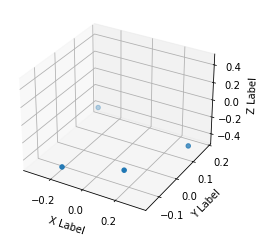

Time diff:  263.0
Footstep timestamp:  4063036.0
Height check index:  2315
Height check timestamp:  4063136.0

FL moving: 0.007655999999999996. FR moving: 0.08925099999999997
RL moving: 0.08609. RR moving: 0.00605

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393978. FR later: -0.304727
RR moving: -0.390397. RL moving: -0.398053

Coord FR: [0.148, -0.08, -0.394]. Coord FL: [0.332, 0.115, -0.39]. Coord RR: [-0.156, -0.148, -0.399]. Coord RL: [-0.325, 0.185, -0.416]

FR step_size: 0.36516899999999997. FL step_size: 0. RR step size: 0. RL step_size: 0.374436.


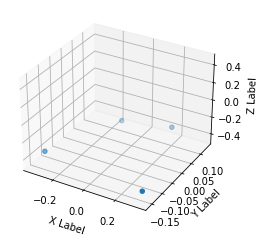

Time diff:  273.0
Footstep timestamp:  4063299.0
Height check index:  2446
Height check timestamp:  4063399.0

FL moving: 0.084698. FR moving: 0.011425000000000018
RL moving: 0.005193999999999976. RR moving: 0.08577499999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.383349. FR later: -0.394774
RR moving: -0.397165. RL moving: -0.312467

Coord FR: [0.339, -0.158, -0.383]. Coord FL: [0.158, 0.135, -0.397]. Coord RR: [-0.345, -0.117, -0.406]. Coord RL: [-0.14, 0.105, -0.409]

FR step_size: 0.381585. FL step_size: 0. RR step size: 0. RL step_size: 0.394466.


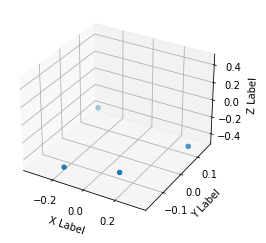

Time diff:  263.0
Footstep timestamp:  4063572.0
Height check index:  2581
Height check timestamp:  4063671.0

FL moving: 0.005437999999999998. FR moving: 0.08727599999999996
RL moving: 0.08836100000000002. RR moving: 0.011726999999999987

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393356. FR later: -0.30608
RR moving: -0.394767. RL moving: -0.400205

Coord FR: [0.139, -0.119, -0.393]. Coord FL: [0.34, 0.088, -0.395]. Coord RR: [-0.154, -0.17, -0.394]. Coord RL: [-0.343, 0.157, -0.419]

FR step_size: 0.39408200000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.40472400000000003.


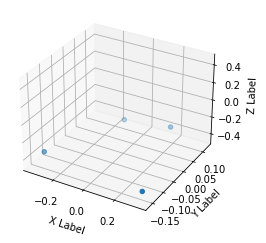

Time diff:  271.0
Footstep timestamp:  4063835.0
Height check index:  2712
Height check timestamp:  4063934.0

FL moving: 0.085148. FR moving: 0.010265000000000024
RL moving: 0.005664000000000002. RR moving: 0.08538499999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385907. FR later: -0.396172
RR moving: -0.39912. RL moving: -0.313972

Coord FR: [0.346, -0.161, -0.386]. Coord FL: [0.153, 0.122, -0.399]. Coord RR: [-0.35, -0.124, -0.406]. Coord RL: [-0.134, 0.1, -0.41]

FR step_size: 0.390957. FL step_size: 0. RR step size: 0. RL step_size: 0.406056.


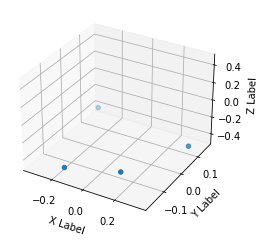

Time diff:  265.0
Footstep timestamp:  4064106.0
Height check index:  2847
Height check timestamp:  4064205.0

FL moving: 0.004045999999999994. FR moving: 0.08792
RL moving: 0.08819900000000003. RR moving: 0.008763999999999994

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395598. FR later: -0.307678
RR moving: -0.396138. RL moving: -0.400184

Coord FR: [0.143, -0.119, -0.396]. Coord FL: [0.341, 0.088, -0.396]. Coord RR: [-0.148, -0.175, -0.397]. Coord RL: [-0.338, 0.156, -0.418]

FR step_size: 0.38874700000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.396421.


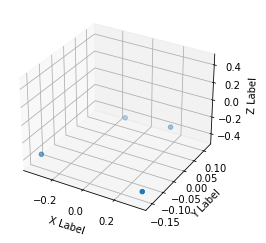

Time diff:  269.0
Footstep timestamp:  4064371.0
Height check index:  2979
Height check timestamp:  4064470.0

FL moving: 0.08765699999999998. FR moving: 0.009855000000000003
RL moving: 0.005908999999999998. RR moving: 0.08686099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.387939. FR later: -0.397794
RR moving: -0.399926. RL moving: -0.312269

Coord FR: [0.346, -0.159, -0.388]. Coord FL: [0.155, 0.116, -0.4]. Coord RR: [-0.343, -0.135, -0.407]. Coord RL: [-0.136, 0.104, -0.411]

FR step_size: 0.38769699999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.397888.


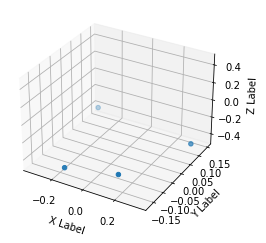

Time diff:  266.0
Footstep timestamp:  4064640.0
Height check index:  3113
Height check timestamp:  4064739.0

FL moving: 0.004102999999999968. FR moving: 0.089279
RL moving: 0.08838999999999997. RR moving: 0.007896000000000014

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39553. FR later: -0.306251
RR moving: -0.396305. RL moving: -0.400408

Coord FR: [0.145, -0.127, -0.396]. Coord FL: [0.341, 0.096, -0.396]. Coord RR: [-0.146, -0.167, -0.398]. Coord RL: [-0.337, 0.147, -0.417]

FR step_size: 0.388958. FL step_size: 0. RR step size: 0. RL step_size: 0.39358600000000005.


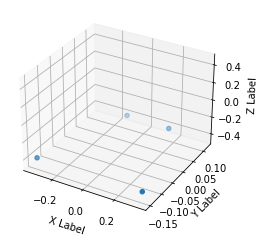

Time diff:  265.0
Footstep timestamp:  4064906.0
Height check index:  3246
Height check timestamp:  4065006.0

FL moving: 0.092644. FR moving: 0.008615999999999957
RL moving: 0.004495000000000027. RR moving: 0.09189499999999995

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389014. FR later: -0.39763
RR moving: -0.400807. RL moving: -0.308163

Coord FR: [0.346, -0.15, -0.389]. Coord FL: [0.153, 0.111, -0.401]. Coord RR: [-0.342, -0.144, -0.406]. Coord RL: [-0.14, 0.118, -0.411]

FR step_size: 0.38529199999999997. FL step_size: 0. RR step size: 0. RL step_size: 0.391807.


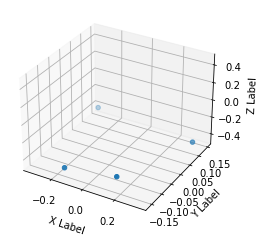

Time diff:  267.0
Footstep timestamp:  4065171.0
Height check index:  3378
Height check timestamp:  4065271.0

FL moving: 0.005305999999999977. FR moving: 0.08766200000000002
RL moving: 0.08792499999999998. RR moving: 0.007739999999999969

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395064. FR later: -0.307402
RR moving: -0.39465. RL moving: -0.399956

Coord FR: [0.15, -0.129, -0.395]. Coord FL: [0.342, 0.106, -0.395]. Coord RR: [-0.144, -0.157, -0.399]. Coord RL: [-0.334, 0.146, -0.417]

FR step_size: 0.38493400000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.391846.


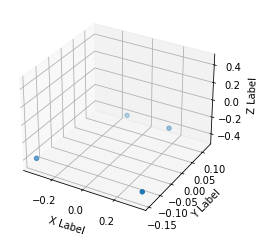

Time diff:  267.0
Footstep timestamp:  4065438.0
Height check index:  3511
Height check timestamp:  4065538.0

FL moving: 0.09042099999999997. FR moving: 0.008150999999999964
RL moving: 0.005179999999999962. RR moving: 0.09056000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389736. FR later: -0.397887
RR moving: -0.399506. RL moving: -0.309085

Coord FR: [0.345, -0.144, -0.39]. Coord FL: [0.153, 0.117, -0.4]. Coord RR: [-0.34, -0.14, -0.407]. Coord RL: [-0.139, 0.123, -0.41]

FR step_size: 0.38686499999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.390999.


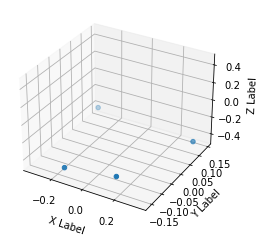

Time diff:  267.0
Footstep timestamp:  4065705.0
Height check index:  3644
Height check timestamp:  4065805.0

FL moving: 0.0044359999999999955. FR moving: 0.09069100000000002
RL moving: 0.09154900000000005. RR moving: 0.008215000000000028

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394542. FR later: -0.303851
RR moving: -0.394808. RL moving: -0.399244

Coord FR: [0.148, -0.129, -0.395]. Coord FL: [0.343, 0.107, -0.395]. Coord RR: [-0.144, -0.157, -0.398]. Coord RL: [-0.334, 0.144, -0.417]

FR step_size: 0.388907. FL step_size: 0. RR step size: 0. RL step_size: 0.390701.


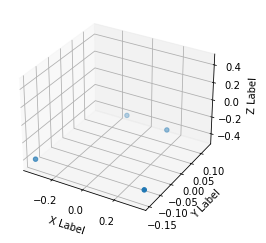

Time diff:  267.0
Footstep timestamp:  4065972.0
Height check index:  3777
Height check timestamp:  4066072.0

FL moving: 0.09079500000000001. FR moving: 0.008469000000000004
RL moving: 0.004964000000000024. RR moving: 0.08982000000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390828. FR later: -0.399297
RR moving: -0.399948. RL moving: -0.309153

Coord FR: [0.346, -0.137, -0.391]. Coord FL: [0.152, 0.114, -0.4]. Coord RR: [-0.341, -0.146, -0.407]. Coord RL: [-0.14, 0.13, -0.411]

FR step_size: 0.385895. FL step_size: 0. RR step size: 0. RL step_size: 0.390232.


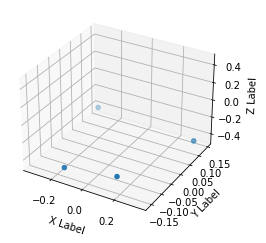

Time diff:  267.0
Footstep timestamp:  4066239.0
Height check index:  3910
Height check timestamp:  4066339.0

FL moving: 0.0044480000000000075. FR moving: 0.08910299999999999
RL moving: 0.089951. RR moving: 0.007626000000000022

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395708. FR later: -0.306605
RR moving: -0.395272. RL moving: -0.39972

Coord FR: [0.151, -0.127, -0.396]. Coord FL: [0.343, 0.112, -0.395]. Coord RR: [-0.144, -0.156, -0.398]. Coord RL: [-0.333, 0.145, -0.416]

FR step_size: 0.381475. FL step_size: 0. RR step size: 0. RL step_size: 0.38395900000000005.


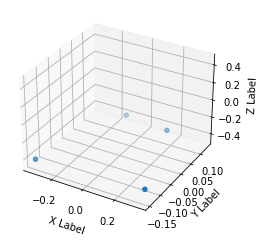

Time diff:  265.0
Footstep timestamp:  4066506.0
Height check index:  4043
Height check timestamp:  4066606.0

FL moving: 0.09089399999999997. FR moving: 0.007552000000000003
RL moving: 0.004776999999999976. RR moving: 0.09010600000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392326. FR later: -0.399878
RR moving: -0.399742. RL moving: -0.308848

Coord FR: [0.343, -0.135, -0.392]. Coord FL: [0.153, 0.116, -0.4]. Coord RR: [-0.338, -0.147, -0.407]. Coord RL: [-0.143, 0.134, -0.41]

FR step_size: 0.37995. FL step_size: 0. RR step size: 0. RL step_size: 0.385969.


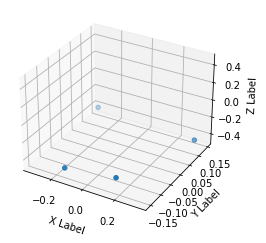

Time diff:  269.0
Footstep timestamp:  4066771.0
Height check index:  4175
Height check timestamp:  4066871.0

FL moving: 0.004383999999999999. FR moving: 0.08782099999999998
RL moving: 0.08662399999999998. RR moving: 0.007357000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396322. FR later: -0.308501
RR moving: -0.393321. RL moving: -0.397705

Coord FR: [0.151, -0.129, -0.396]. Coord FL: [0.341, 0.116, -0.393]. Coord RR: [-0.142, -0.152, -0.4]. Coord RL: [-0.333, 0.145, -0.414]

FR step_size: 0.3818370000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.385253.


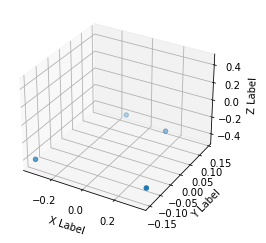

Time diff:  265.0
Footstep timestamp:  4067040.0
Height check index:  4309
Height check timestamp:  4067140.0

FL moving: 0.08965199999999995. FR moving: 0.008225000000000038
RL moving: 0.005574999999999997. RR moving: 0.08805600000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392632. FR later: -0.400857
RR moving: -0.398321. RL moving: -0.308669

Coord FR: [0.343, -0.129, -0.393]. Coord FL: [0.152, 0.116, -0.398]. Coord RR: [-0.336, -0.148, -0.409]. Coord RL: [-0.142, 0.14, -0.408]

FR step_size: 0.38122300000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.38522.


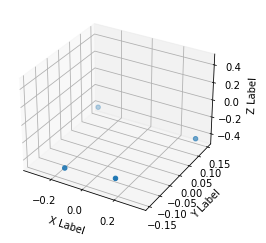

Time diff:  271.0
Footstep timestamp:  4067305.0
Height check index:  4440
Height check timestamp:  4067404.0

FL moving: 0.005274000000000001. FR moving: 0.084594
RL moving: 0.08543499999999998. RR moving: 0.00797800000000004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397136. FR later: -0.312542
RR moving: -0.390707. RL moving: -0.395981

Coord FR: [0.152, -0.126, -0.397]. Coord FL: [0.342, 0.124, -0.391]. Coord RR: [-0.141, -0.146, -0.401]. Coord RL: [-0.332, 0.146, -0.412]

FR step_size: 0.37939900000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38227000000000005.


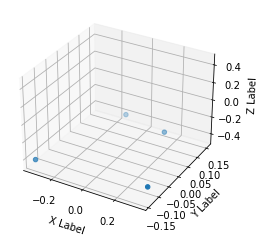

Time diff:  17048.0


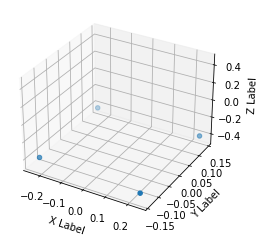

Time diff:  269.0
Footstep timestamp:  4084624.0
Height check index:  4589
Height check timestamp:  4084723.0

FL moving: 0.0024180000000000312. FR moving: 0.09172799999999998
RL moving: 0.09259400000000001. RR moving: 0.0021160000000000068

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.413468. FR later: -0.32174
RR moving: -0.405616. RL moving: -0.408034

Coord FR: [0.234, -0.138, -0.413]. Coord FL: [0.243, 0.141, -0.406]. Coord RR: [-0.238, -0.125, -0.415]. Coord RL: [-0.242, 0.139, -0.416]

FR step_size: 0.05945600000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.06596099999999999.


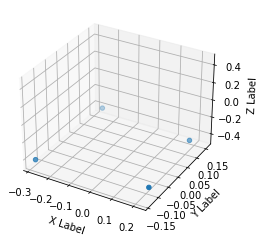

Time diff:  255.0
Footstep timestamp:  4084893.0
Height check index:  4723
Height check timestamp:  4084992.0

FL moving: 0.09317200000000003. FR moving: 0.0014899999999999913
RL moving: 0.0013880000000000003. RR moving: 0.091395

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.415784. FR later: -0.414294
RR moving: -0.407463. RL moving: -0.314291

Coord FR: [0.219, -0.107, -0.416]. Coord FL: [0.198, 0.125, -0.407]. Coord RR: [-0.284, -0.139, -0.413]. Coord RL: [-0.262, 0.156, -0.408]

FR step_size: 0.188917. FL step_size: 0. RR step size: 0. RL step_size: 0.20717799999999995.


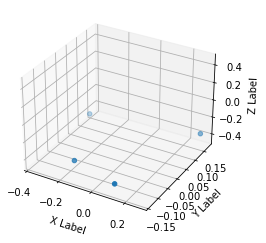

Time diff:  276.0
Footstep timestamp:  4085148.0
Height check index:  4850
Height check timestamp:  4085247.0

FL moving: 0.00340600000000002. FR moving: 0.072942
RL moving: 0.06878499999999999. RR moving: 0.005583999999999978

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.402667. FR later: -0.329725
RR moving: -0.379056. RL moving: -0.382462

Coord FR: [0.114, -0.136, -0.403]. Coord FL: [0.281, 0.171, -0.379]. Coord RR: [-0.184, -0.095, -0.403]. Coord RL: [-0.369, 0.123, -0.4]

FR step_size: 0.40721840000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.41131.


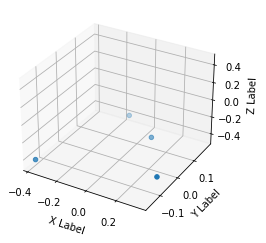

Time diff:  271.0
Footstep timestamp:  4085424.0
Height check index:  4988
Height check timestamp:  4085524.0

FL moving: 0.08540700000000001. FR moving: 0.012701999999999991
RL moving: 0.009726999999999986. RR moving: 0.08572099999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.387116. FR later: -0.399818
RR moving: -0.395694. RL moving: -0.310287

Coord FR: [0.338, -0.074, -0.387]. Coord FL: [0.098, 0.101, -0.396]. Coord RR: [-0.377, -0.155, -0.412]. Coord RL: [-0.151, 0.18, -0.403]

FR step_size: 0.425694. FL step_size: 0. RR step size: 0. RL step_size: 0.40286200000000005.


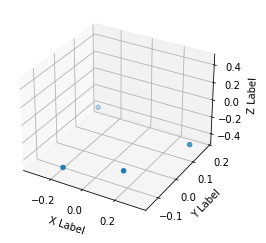

Time diff:  261.0
Footstep timestamp:  4085695.0
Height check index:  5123
Height check timestamp:  4085795.0

FL moving: 0.00547700000000001. FR moving: 0.09284500000000001
RL moving: 0.08926800000000001. RR moving: 0.006935999999999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39561. FR later: -0.302765
RR moving: -0.391027. RL moving: -0.396504

Coord FR: [0.151, -0.078, -0.396]. Coord FL: [0.337, 0.124, -0.391]. Coord RR: [-0.15, -0.142, -0.401]. Coord RL: [-0.327, 0.184, -0.413]

FR step_size: 0.36565700000000007. FL step_size: 0. RR step size: 0. RL step_size: 0.375181.


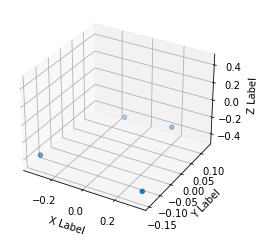

Time diff:  271.0
Footstep timestamp:  4085956.0
Height check index:  5253
Height check timestamp:  4086056.0

FL moving: 0.08555099999999999. FR moving: 0.00938899999999998
RL moving: 0.0070450000000000235. RR moving: 0.08571200000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38462. FR later: -0.394009
RR moving: -0.397482. RL moving: -0.311931

Coord FR: [0.341, -0.145, -0.385]. Coord FL: [0.161, 0.13, -0.397]. Coord RR: [-0.337, -0.125, -0.407]. Coord RL: [-0.139, 0.119, -0.409]

FR step_size: 0.376289. FL step_size: 0. RR step size: 0. RL step_size: 0.382008.


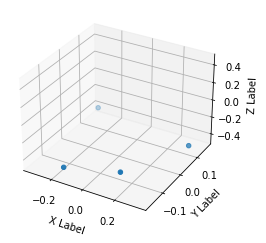

Time diff:  263.0
Footstep timestamp:  4086227.0
Height check index:  5388
Height check timestamp:  4086327.0

FL moving: 0.004605999999999999. FR moving: 0.09084599999999998
RL moving: 0.09116000000000002. RR moving: 0.009984000000000048

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393223. FR later: -0.302377
RR moving: -0.392231. RL moving: -0.396837

Coord FR: [0.144, -0.114, -0.393]. Coord FL: [0.34, 0.093, -0.392]. Coord RR: [-0.15, -0.167, -0.397]. Coord RL: [-0.334, 0.159, -0.419]

FR step_size: 0.38762300000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.392845.


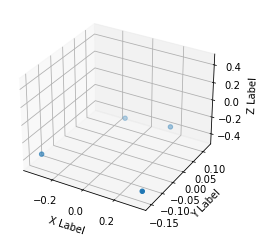

Time diff:  269.0
Footstep timestamp:  4086490.0
Height check index:  5519
Height check timestamp:  4086590.0

FL moving: 0.085596. FR moving: 0.010086999999999957
RL moving: 0.00667300000000004. RR moving: 0.08767799999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.384402. FR later: -0.394489
RR moving: -0.39772. RL moving: -0.312124

Coord FR: [0.346, -0.155, -0.384]. Coord FL: [0.154, 0.12, -0.398]. Coord RR: [-0.343, -0.13, -0.408]. Coord RL: [-0.134, 0.106, -0.41]

FR step_size: 0.39000599999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.398166.


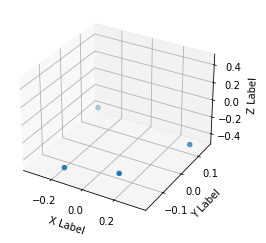

Time diff:  267.0
Footstep timestamp:  4086759.0
Height check index:  5653
Height check timestamp:  4086859.0

FL moving: 0.006934999999999969. FR moving: 0.08811399999999997
RL moving: 0.08671400000000001. RR moving: 0.007463999999999971

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394545. FR later: -0.306431
RR moving: -0.391591. RL moving: -0.398526

Coord FR: [0.146, -0.122, -0.395]. Coord FL: [0.344, 0.093, -0.392]. Coord RR: [-0.145, -0.168, -0.398]. Coord RL: [-0.335, 0.151, -0.417]

FR step_size: 0.38992799999999994. FL step_size: 0. RR step size: 0. RL step_size: 0.39510900000000004.


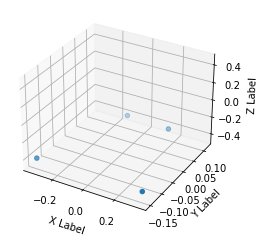

Time diff:  265.0
Footstep timestamp:  4087026.0
Height check index:  5786
Height check timestamp:  4087126.0

FL moving: 0.09157500000000002. FR moving: 0.00973099999999999
RL moving: 0.004929000000000017. RR moving: 0.09060399999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.386682. FR later: -0.396413
RR moving: -0.399424. RL moving: -0.307849

Coord FR: [0.346, -0.151, -0.387]. Coord FL: [0.154, 0.106, -0.399]. Coord RR: [-0.344, -0.146, -0.407]. Coord RL: [-0.139, 0.116, -0.411]

FR step_size: 0.38450399999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.39789699999999995.


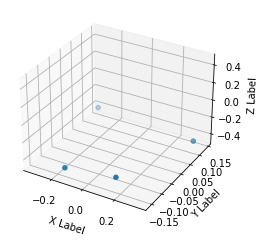

Time diff:  269.0
Footstep timestamp:  4087291.0
Height check index:  5918
Height check timestamp:  4087391.0

FL moving: 0.005540999999999963. FR moving: 0.08738100000000004
RL moving: 0.08887199999999995. RR moving: 0.007971999999999979

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39351. FR later: -0.306129
RR moving: -0.392676. RL moving: -0.398217

Coord FR: [0.15, -0.133, -0.394]. Coord FL: [0.343, 0.107, -0.393]. Coord RR: [-0.142, -0.157, -0.398]. Coord RL: [-0.335, 0.142, -0.417]

FR step_size: 0.38880800000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.394454.


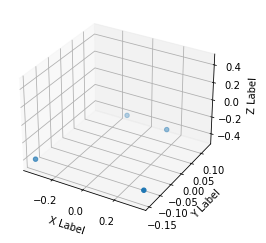

Time diff:  265.0
Footstep timestamp:  4087560.0
Height check index:  6052
Height check timestamp:  4087660.0

FL moving: 0.09072800000000003. FR moving: 0.008131
RL moving: 0.005184999999999995. RR moving: 0.09027999999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390377. FR later: -0.398508
RR moving: -0.39916. RL moving: -0.308432

Coord FR: [0.345, -0.138, -0.39]. Coord FL: [0.149, 0.114, -0.399]. Coord RR: [-0.342, -0.145, -0.407]. Coord RL: [-0.14, 0.129, -0.41]

FR step_size: 0.387714. FL step_size: 0. RR step size: 0. RL step_size: 0.39361999999999997.


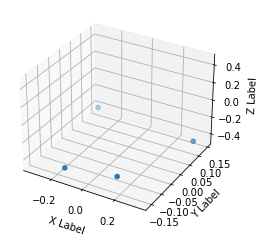

Time diff:  269.0
Footstep timestamp:  4087825.0
Height check index:  6183
Height check timestamp:  4087924.0

FL moving: 0.005089999999999983. FR moving: 0.086258
RL moving: 0.08644999999999997. RR moving: 0.007606999999999975

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394906. FR later: -0.308648
RR moving: -0.392863. RL moving: -0.397953

Coord FR: [0.151, -0.127, -0.395]. Coord FL: [0.342, 0.11, -0.393]. Coord RR: [-0.142, -0.156, -0.399]. Coord RL: [-0.334, 0.146, -0.416]

FR step_size: 0.38433400000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.38993800000000006.


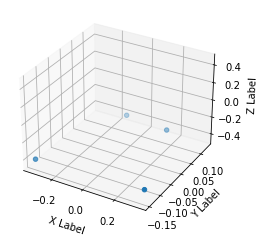

Time diff:  265.0
Footstep timestamp:  4088094.0
Height check index:  6317
Height check timestamp:  4088193.0

FL moving: 0.08929500000000001. FR moving: 0.007979999999999987
RL moving: 0.0050400000000000444. RR moving: 0.08852099999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390851. FR later: -0.398831
RR moving: -0.398975. RL moving: -0.30968

Coord FR: [0.344, -0.136, -0.391]. Coord FL: [0.151, 0.115, -0.399]. Coord RR: [-0.339, -0.146, -0.407]. Coord RL: [-0.141, 0.132, -0.41]

FR step_size: 0.383127. FL step_size: 0. RR step size: 0. RL step_size: 0.38708600000000004.


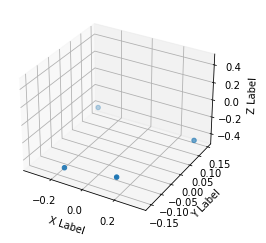

Time diff:  269.0
Footstep timestamp:  4088359.0
Height check index:  6449
Height check timestamp:  4088458.0

FL moving: 0.005375999999999992. FR moving: 0.086038
RL moving: 0.08636899999999997. RR moving: 0.007457999999999965

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395051. FR later: -0.309013
RR moving: -0.392594. RL moving: -0.39797

Coord FR: [0.152, -0.129, -0.395]. Coord FL: [0.342, 0.114, -0.393]. Coord RR: [-0.143, -0.155, -0.399]. Coord RL: [-0.332, 0.145, -0.416]

FR step_size: 0.38335300000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.3857860000000001.


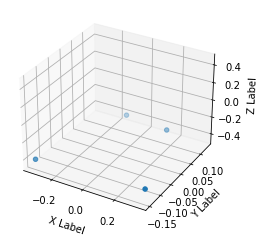

Time diff:  15147.0


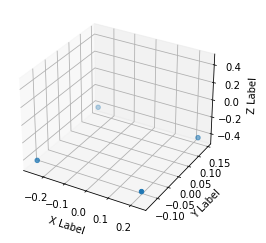

Time diff:  261.0
Footstep timestamp:  4103775.0
Height check index:  6708
Height check timestamp:  4103875.0

FL moving: 0.09650600000000004. FR moving: 0.00012000000000000899
RL moving: 0.0014460000000000028. RR moving: 0.09872399999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.414267. FR later: -0.414147
RR moving: -0.408135. RL moving: -0.311629

Coord FR: [0.221, -0.126, -0.414]. Coord FL: [0.231, 0.136, -0.408]. Coord RR: [-0.251, -0.133, -0.415]. Coord RL: [-0.259, 0.144, -0.413]

FR step_size: 0.07419099999999998. FL step_size: 0. RR step size: 0. RL step_size: 0.07003600000000001.


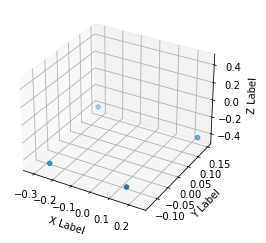

Time diff:  261.0
Footstep timestamp:  4104036.0
Height check index:  6838
Height check timestamp:  4104136.0

FL moving: 0.0016550000000000176. FR moving: 0.08769100000000002
RL moving: 0.08273900000000001. RR moving: 0.0008110000000000062

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.406327. FR later: -0.318636
RR moving: -0.401543. RL moving: -0.403198

Coord FR: [0.16, -0.128, -0.406]. Coord FL: [0.244, 0.136, -0.402]. Coord RR: [-0.239, -0.132, -0.403]. Coord RL: [-0.317, 0.146, -0.408]

FR step_size: 0.28012000000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.28167200000000003.


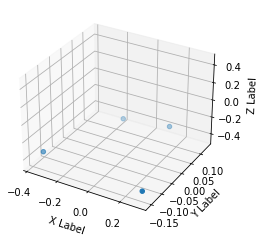

Time diff:  277.0
Footstep timestamp:  4104297.0
Height check index:  6968
Height check timestamp:  4104397.0

FL moving: 0.07984800000000003. FR moving: 0.007498999999999978
RL moving: 0.007550000000000001. RR moving: 0.072934

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.383444. FR later: -0.390943
RR moving: -0.397363. RL moving: -0.317515

Coord FR: [0.309, -0.155, -0.383]. Coord FL: [0.113, 0.134, -0.397]. Coord RR: [-0.373, -0.121, -0.397]. Coord RL: [-0.169, 0.112, -0.403]

FR step_size: 0.418065. FL step_size: 0. RR step size: 0. RL step_size: 0.402983.


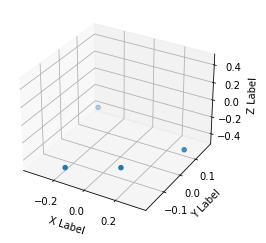

Time diff:  269.0
Footstep timestamp:  4104574.0
Height check index:  7106
Height check timestamp:  4104674.0

FL moving: 0.008567999999999965. FR moving: 0.09176899999999999
RL moving: 0.091063. RR moving: 0.01031800000000005

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393189. FR later: -0.30142
RR moving: -0.387309. RL moving: -0.395877

Coord FR: [0.117, -0.101, -0.393]. Coord FL: [0.339, 0.074, -0.387]. Coord RR: [-0.155, -0.18, -0.395]. Coord RL: [-0.354, 0.175, -0.414]

FR step_size: 0.404239. FL step_size: 0. RR step size: 0. RL step_size: 0.39068.


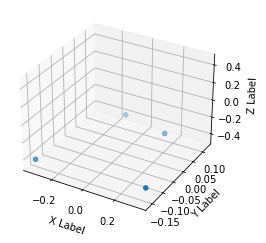

Time diff:  261.0
Footstep timestamp:  4104843.0
Height check index:  7239
Height check timestamp:  4104942.0

FL moving: 0.090692. FR moving: 0.010083000000000009
RL moving: 0.0066050000000000275. RR moving: 0.08955599999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.386021. FR later: -0.396104
RR moving: -0.396463. RL moving: -0.305771

Coord FR: [0.343, -0.143, -0.386]. Coord FL: [0.161, 0.087, -0.396]. Coord RR: [-0.338, -0.159, -0.408]. Coord RL: [-0.147, 0.122, -0.408]

FR step_size: 0.366105. FL step_size: 0. RR step size: 0. RL step_size: 0.39215500000000003.


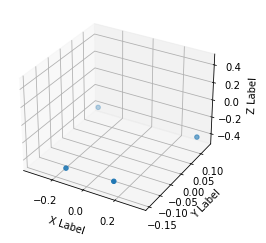

Time diff:  6221.0


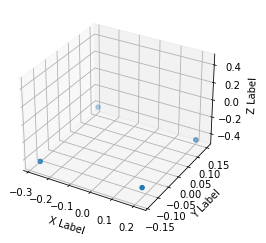

Time diff:  257.0
Footstep timestamp:  4111325.0
Height check index:  7580
Height check timestamp:  4111425.0

FL moving: 0.09503400000000001. FR moving: 0.0015330000000000066
RL moving: 0.00013699999999999823. RR moving: 0.096194

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.416941. FR later: -0.415408
RR moving: -0.408436. RL moving: -0.313402

Coord FR: [0.196, -0.114, -0.417]. Coord FL: [0.219, 0.13, -0.408]. Coord RR: [-0.263, -0.137, -0.416]. Coord RL: [-0.286, 0.15, -0.411]

FR step_size: 0.12990500000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.14849600000000002.


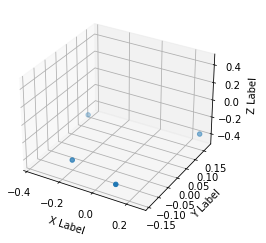

Time diff:  277.0
Footstep timestamp:  4111582.0
Height check index:  7707
Height check timestamp:  4111681.0

FL moving: 0.0020580000000000043. FR moving: 0.075484
RL moving: 0.071822. RR moving: 0.0036359999999999726

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.401663. FR later: -0.326179
RR moving: -0.382544. RL moving: -0.384602

Coord FR: [0.111, -0.142, -0.402]. Coord FL: [0.264, 0.168, -0.383]. Coord RR: [-0.202, -0.1, -0.404]. Coord RL: [-0.374, 0.115, -0.403]

FR step_size: 0.3943882. FL step_size: 0. RR step size: 0. RL step_size: 0.405825.


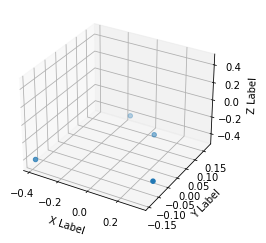

Time diff:  267.0
Footstep timestamp:  4111859.0
Height check index:  7845
Height check timestamp:  4111958.0

FL moving: 0.08569899999999997. FR moving: 0.00939899999999999
RL moving: 0.009469999999999978. RR moving: 0.08573700000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390811. FR later: -0.40021
RR moving: -0.396501. RL moving: -0.310802

Coord FR: [0.33, -0.088, -0.391]. Coord FL: [0.089, 0.112, -0.397]. Coord RR: [-0.387, -0.143, -0.411]. Coord RL: [-0.153, 0.17, -0.404]

FR step_size: 0.43124400000000007. FL step_size: 0. RR step size: 0. RL step_size: 0.405802.


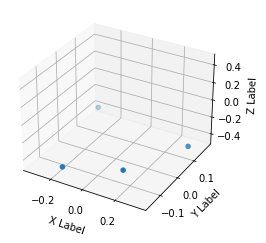

Time diff:  263.0
Footstep timestamp:  4112126.0
Height check index:  7978
Height check timestamp:  4112225.0

FL moving: 0.00573499999999999. FR moving: 0.08771699999999999
RL moving: 0.08468700000000001. RR moving: 0.007423999999999986

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394507. FR later: -0.30679
RR moving: -0.392785. RL moving: -0.39852

Coord FR: [0.144, -0.088, -0.395]. Coord FL: [0.334, 0.109, -0.393]. Coord RR: [-0.154, -0.156, -0.397]. Coord RL: [-0.326, 0.181, -0.415]

FR step_size: 0.36724100000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.37191399999999997.


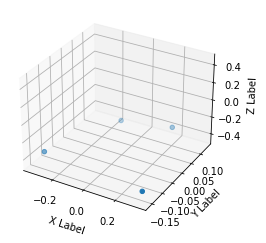

Time diff:  1093.0


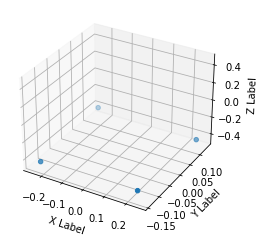

Time diff:  259.0
Footstep timestamp:  4113482.0
Height check index:  8250
Height check timestamp:  4113582.0

FL moving: 0.09795599999999999. FR moving: 0.0014679999999999693
RL moving: 0.0011829999999999896. RR moving: 0.098024

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.41381. FR later: -0.415278
RR moving: -0.410835. RL moving: -0.312879

Coord FR: [0.226, -0.134, -0.414]. Coord FL: [0.253, 0.119, -0.411]. Coord RR: [-0.226, -0.14, -0.417]. Coord RL: [-0.251, 0.136, -0.418]

FR step_size: 0.09825400000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.10422899999999999.


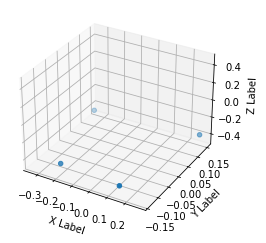

Time diff:  267.0
Footstep timestamp:  4113741.0
Height check index:  8379
Height check timestamp:  4113841.0

FL moving: 0.0005630000000000357. FR moving: 0.08280500000000002
RL moving: 0.07788. RR moving: 0.0010780000000000234

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.404856. FR later: -0.322051
RR moving: -0.391562. RL moving: -0.390999

Coord FR: [0.144, -0.137, -0.405]. Coord FL: [0.269, 0.149, -0.392]. Coord RR: [-0.208, -0.123, -0.409]. Coord RL: [-0.337, 0.13, -0.41]

FR step_size: 0.34984800000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.349714.


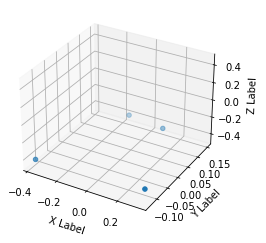

Time diff:  273.0
Footstep timestamp:  4114008.0
Height check index:  8512
Height check timestamp:  4114108.0

FL moving: 0.07889199999999996. FR moving: 0.008257000000000014
RL moving: 0.013371999999999995. RR moving: 0.08265099999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389356. FR later: -0.397613
RR moving: -0.393194. RL moving: -0.314302

Coord FR: [0.329, -0.118, -0.389]. Coord FL: [0.104, 0.131, -0.393]. Coord RR: [-0.374, -0.13, -0.41]. Coord RL: [-0.153, 0.148, -0.4]

FR step_size: 0.42311400000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.40566100000000005.


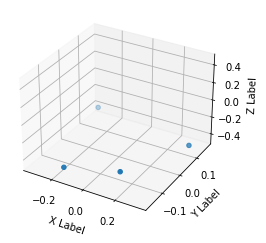

Time diff:  267.0
Footstep timestamp:  4114281.0
Height check index:  8648
Height check timestamp:  4114381.0

FL moving: 0.0068050000000000055. FR moving: 0.08815100000000003
RL moving: 0.08685199999999998. RR moving: 0.008678999999999992

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.3934. FR later: -0.305249
RR moving: -0.392478. RL moving: -0.399283

Coord FR: [0.138, -0.111, -0.393]. Coord FL: [0.337, 0.098, -0.392]. Coord RR: [-0.151, -0.166, -0.396]. Coord RL: [-0.336, 0.163, -0.415]

FR step_size: 0.38314400000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.381666.


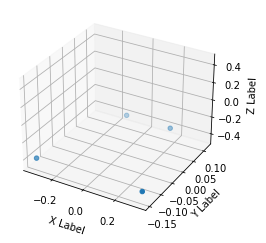

Time diff:  267.0
Footstep timestamp:  4114548.0
Height check index:  8781
Height check timestamp:  4114648.0

FL moving: 0.091644. FR moving: 0.008670000000000011
RL moving: 0.00491999999999998. RR moving: 0.089804

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38687. FR later: -0.39554
RR moving: -0.39908. RL moving: -0.307436

Coord FR: [0.34, -0.147, -0.387]. Coord FL: [0.156, 0.111, -0.399]. Coord RR: [-0.34, -0.143, -0.405]. Coord RL: [-0.143, 0.116, -0.411]

FR step_size: 0.37381000000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.38155400000000006.


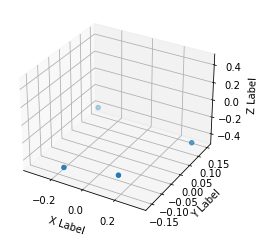

Time diff:  265.0
Footstep timestamp:  4114815.0
Height check index:  8914
Height check timestamp:  4114915.0

FL moving: 0.005383000000000027. FR moving: 0.089723
RL moving: 0.09040599999999999. RR moving: 0.007961999999999969

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.393722. FR later: -0.303999
RR moving: -0.393372. RL moving: -0.398755

Coord FR: [0.149, -0.122, -0.394]. Coord FL: [0.339, 0.104, -0.393]. Coord RR: [-0.148, -0.158, -0.398]. Coord RL: [-0.333, 0.149, -0.417]

FR step_size: 0.383197. FL step_size: 0. RR step size: 0. RL step_size: 0.391552.


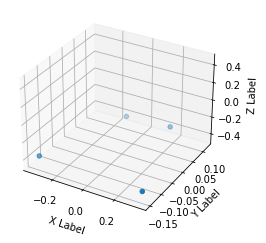

Time diff:  269.0
Footstep timestamp:  4115080.0
Height check index:  9046
Height check timestamp:  4115181.0

FL moving: 0.09066999999999997. FR moving: 0.010670000000000013
RL moving: 0.005794000000000021. RR moving: 0.08994799999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.386299. FR later: -0.396969
RR moving: -0.398761. RL moving: -0.308091

Coord FR: [0.346, -0.149, -0.386]. Coord FL: [0.152, 0.12, -0.399]. Coord RR: [-0.344, -0.134, -0.406]. Coord RL: [-0.138, 0.115, -0.41]

FR step_size: 0.387488. FL step_size: 0. RR step size: 0. RL step_size: 0.39295899999999995.


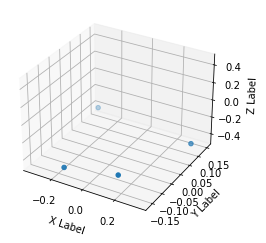

Time diff:  265.0
Footstep timestamp:  4115349.0
Height check index:  9179
Height check timestamp:  4115448.0

FL moving: 0.004685999999999968. FR moving: 0.08797499999999997
RL moving: 0.08733399999999997. RR moving: 0.008328000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394622. FR later: -0.306647
RR moving: -0.395116. RL moving: -0.399802

Coord FR: [0.148, -0.124, -0.395]. Coord FL: [0.341, 0.1, -0.395]. Coord RR: [-0.147, -0.161, -0.397]. Coord RL: [-0.334, 0.15, -0.418]

FR step_size: 0.385145. FL step_size: 0. RR step size: 0. RL step_size: 0.394776.


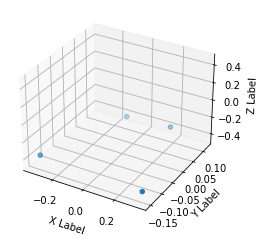

Time diff:  269.0
Footstep timestamp:  4115614.0
Height check index:  9311
Height check timestamp:  4115713.0

FL moving: 0.08757700000000002. FR moving: 0.010093999999999992
RL moving: 0.005218999999999974. RR moving: 0.08673599999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.387169. FR later: -0.397263
RR moving: -0.400171. RL moving: -0.312594

Coord FR: [0.346, -0.152, -0.387]. Coord FL: [0.154, 0.119, -0.4]. Coord RR: [-0.344, -0.133, -0.406]. Coord RL: [-0.136, 0.114, -0.411]

FR step_size: 0.386951. FL step_size: 0. RR step size: 0. RL step_size: 0.3947839999999999.


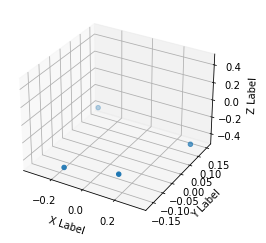

Time diff:  265.0
Footstep timestamp:  4115883.0
Height check index:  9445
Height check timestamp:  4115982.0

FL moving: 0.0045339999999999825. FR moving: 0.08750200000000002
RL moving: 0.087399. RR moving: 0.008897999999999961

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395121. FR later: -0.307619
RR moving: -0.396019. RL moving: -0.400553

Coord FR: [0.146, -0.124, -0.395]. Coord FL: [0.341, 0.097, -0.396]. Coord RR: [-0.147, -0.166, -0.397]. Coord RL: [-0.334, 0.151, -0.418]

FR step_size: 0.382004. FL step_size: 0. RR step size: 0. RL step_size: 0.38908300000000007.


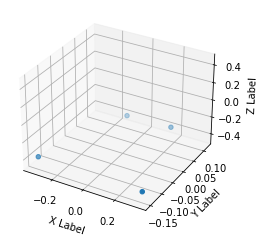

Time diff:  267.0
Footstep timestamp:  4116148.0
Height check index:  9577
Height check timestamp:  4116247.0

FL moving: 0.08808299999999997. FR moving: 0.007732000000000017
RL moving: 0.004902999999999991. RR moving: 0.08693299999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388957. FR later: -0.396689
RR moving: -0.400053. RL moving: -0.31197

Coord FR: [0.342, -0.151, -0.389]. Coord FL: [0.155, 0.116, -0.4]. Coord RR: [-0.341, -0.14, -0.406]. Coord RL: [-0.139, 0.115, -0.411]

FR step_size: 0.38012300000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38831400000000005.


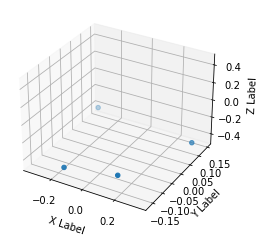

Time diff:  268.0
Footstep timestamp:  4116415.0
Height check index:  9710
Height check timestamp:  4116514.0

FL moving: 0.005135000000000001. FR moving: 0.08601599999999998
RL moving: 0.08675900000000003. RR moving: 0.008118000000000014

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394269. FR later: -0.308253
RR moving: -0.393995. RL moving: -0.39913

Coord FR: [0.148, -0.128, -0.394]. Coord FL: [0.341, 0.102, -0.394]. Coord RR: [-0.146, -0.163, -0.397]. Coord RL: [-0.332, 0.147, -0.417]

FR step_size: 0.38317600000000007. FL step_size: 0. RR step size: 0. RL step_size: 0.386942.


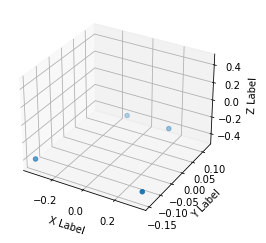

Time diff:  265.0
Footstep timestamp:  4116683.0
Height check index:  9844
Height check timestamp:  4116783.0

FL moving: 0.09281399999999995. FR moving: 0.00773299999999999
RL moving: 0.004525000000000001. RR moving: 0.09174399999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389361. FR later: -0.397094
RR moving: -0.400151. RL moving: -0.307337

Coord FR: [0.342, -0.145, -0.389]. Coord FL: [0.152, 0.113, -0.4]. Coord RR: [-0.341, -0.145, -0.405]. Coord RL: [-0.14, 0.121, -0.412]

FR step_size: 0.38121700000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.387654.


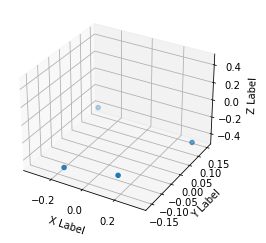

Time diff:  267.0
Footstep timestamp:  4116948.0
Height check index:  9976
Height check timestamp:  4117048.0

FL moving: 0.0043560000000000265. FR moving: 0.089804
RL moving: 0.08957999999999999. RR moving: 0.0072770000000000334

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394442. FR later: -0.304638
RR moving: -0.39369. RL moving: -0.398046

Coord FR: [0.15, -0.123, -0.394]. Coord FL: [0.341, 0.106, -0.394]. Coord RR: [-0.145, -0.158, -0.398]. Coord RL: [-0.331, 0.149, -0.417]

FR step_size: 0.382498. FL step_size: 0. RR step size: 0. RL step_size: 0.38511100000000004.


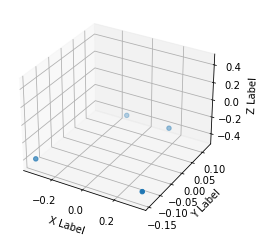

Time diff:  267.0
Footstep timestamp:  4117215.0
Height check index:  10109
Height check timestamp:  4117315.0

FL moving: 0.08921499999999999. FR moving: 0.00970399999999999
RL moving: 0.004533000000000009. RR moving: 0.08980100000000002

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.388428. FR later: -0.398132
RR moving: -0.399795. RL moving: -0.31058

Coord FR: [0.345, -0.144, -0.388]. Coord FL: [0.153, 0.117, -0.4]. Coord RR: [-0.339, -0.143, -0.406]. Coord RL: [-0.14, 0.123, -0.411]

FR step_size: 0.38310299999999997. FL step_size: 0. RR step size: 0. RL step_size: 0.386964.


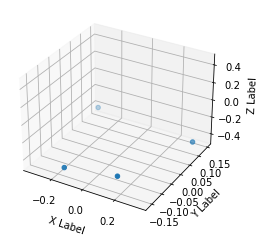

Time diff:  267.0
Footstep timestamp:  4117482.0
Height check index:  10242
Height check timestamp:  4117582.0

FL moving: 0.005524000000000029. FR moving: 0.08784199999999998
RL moving: 0.08836900000000003. RR moving: 0.007440000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394765. FR later: -0.306923
RR moving: -0.39413. RL moving: -0.399654

Coord FR: [0.15, -0.127, -0.395]. Coord FL: [0.341, 0.107, -0.394]. Coord RR: [-0.146, -0.158, -0.398]. Coord RL: [-0.334, 0.147, -0.416]

FR step_size: 0.38304000000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.38912.


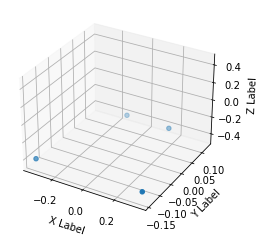

Time diff:  267.0
Footstep timestamp:  4117749.0
Height check index:  10375
Height check timestamp:  4117849.0

FL moving: 0.08915800000000002. FR moving: 0.00905800000000001
RL moving: 0.005126999999999993. RR moving: 0.088613

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390181. FR later: -0.399239
RR moving: -0.399162. RL moving: -0.310004

Coord FR: [0.345, -0.143, -0.39]. Coord FL: [0.153, 0.118, -0.399]. Coord RR: [-0.341, -0.141, -0.407]. Coord RL: [-0.14, 0.125, -0.409]

FR step_size: 0.385733. FL step_size: 0. RR step size: 0. RL step_size: 0.39324400000000004.


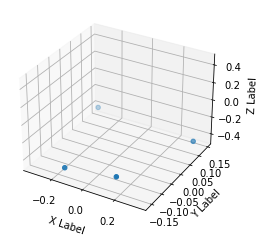

Time diff:  269.0
Footstep timestamp:  4118016.0
Height check index:  10508
Height check timestamp:  4118116.0

FL moving: 0.005643000000000009. FR moving: 0.08695399999999998
RL moving: 0.08806899999999995. RR moving: 0.007579999999999976

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395277. FR later: -0.308323
RR moving: -0.394263. RL moving: -0.399906

Coord FR: [0.148, -0.13, -0.395]. Coord FL: [0.342, 0.109, -0.394]. Coord RR: [-0.144, -0.157, -0.398]. Coord RL: [-0.336, 0.145, -0.415]

FR step_size: 0.38649400000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.391057.


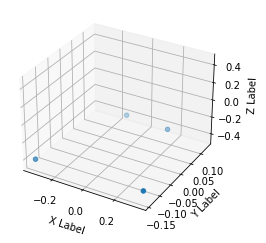

Time diff:  267.0
Footstep timestamp:  4118285.0
Height check index:  10642
Height check timestamp:  4118385.0

FL moving: 0.09053099999999997. FR moving: 0.008382
RL moving: 0.005081999999999975. RR moving: 0.092472

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39288. FR later: -0.401262
RR moving: -0.39947. RL moving: -0.308939

Coord FR: [0.345, -0.138, -0.393]. Coord FL: [0.152, 0.118, -0.399]. Coord RR: [-0.341, -0.143, -0.407]. Coord RL: [-0.142, 0.131, -0.409]

FR step_size: 0.385984. FL step_size: 0. RR step size: 0. RL step_size: 0.39259700000000003.


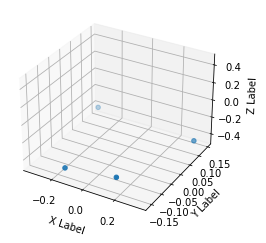

Time diff:  269.0
Footstep timestamp:  4118552.0
Height check index:  10775
Height check timestamp:  4118652.0

FL moving: 0.005539999999999989. FR moving: 0.087428
RL moving: 0.08709299999999998. RR moving: 0.0072690000000000254

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397513. FR later: -0.310085
RR moving: -0.396281. RL moving: -0.401821

Coord FR: [0.149, -0.13, -0.398]. Coord FL: [0.342, 0.113, -0.396]. Coord RR: [-0.143, -0.156, -0.399]. Coord RL: [-0.337, 0.145, -0.414]

FR step_size: 0.382541. FL step_size: 0. RR step size: 0. RL step_size: 0.38922100000000004.


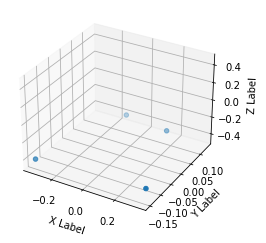

Time diff:  265.0
Footstep timestamp:  4118821.0
Height check index:  10909
Height check timestamp:  4118921.0

FL moving: 0.09137. FR moving: 0.0071289999999999965
RL moving: 0.005025000000000002. RR moving: 0.09001500000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39465. FR later: -0.401779
RR moving: -0.400577. RL moving: -0.309207

Coord FR: [0.342, -0.132, -0.395]. Coord FL: [0.153, 0.115, -0.401]. Coord RR: [-0.338, -0.149, -0.406]. Coord RL: [-0.143, 0.135, -0.408]

FR step_size: 0.378332. FL step_size: 0. RR step size: 0. RL step_size: 0.3847750000000001.


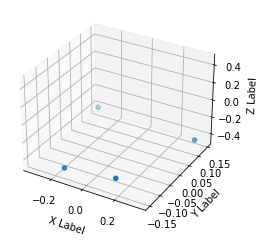

Time diff:  271.0
Footstep timestamp:  4119086.0
Height check index:  11040
Height check timestamp:  4119185.0

FL moving: 0.005525999999999975. FR moving: 0.08627800000000002
RL moving: 0.08537800000000001. RR moving: 0.007181999999999966

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397866. FR later: -0.311588
RR moving: -0.393718. RL moving: -0.399244

Coord FR: [0.152, -0.127, -0.398]. Coord FL: [0.341, 0.118, -0.394]. Coord RR: [-0.143, -0.148, -0.401]. Coord RL: [-0.332, 0.146, -0.412]

FR step_size: 0.376244. FL step_size: 0. RR step size: 0. RL step_size: 0.379474.


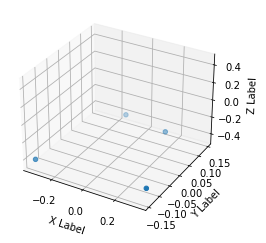

Time diff:  265.0
Footstep timestamp:  4119357.0
Height check index:  11175
Height check timestamp:  4119456.0

FL moving: 0.08975300000000003. FR moving: 0.005964000000000025
RL moving: 0.005716999999999972. RR moving: 0.08891199999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.397286. FR later: -0.40325
RR moving: -0.398355. RL moving: -0.308602

Coord FR: [0.34, -0.124, -0.397]. Coord FL: [0.152, 0.117, -0.398]. Coord RR: [-0.336, -0.143, -0.409]. Coord RL: [-0.145, 0.144, -0.407]

FR step_size: 0.376911. FL step_size: 0. RR step size: 0. RL step_size: 0.38168500000000005.


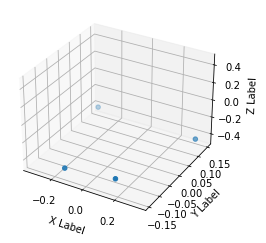

Time diff:  271.0
Footstep timestamp:  4119622.0
Height check index:  11307
Height check timestamp:  4119721.0

FL moving: 0.0044319999999999915. FR moving: 0.086445
RL moving: 0.085368. RR moving: 0.00696399999999997

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398886. FR later: -0.312441
RR moving: -0.392844. RL moving: -0.397276

Coord FR: [0.151, -0.125, -0.399]. Coord FL: [0.34, 0.124, -0.393]. Coord RR: [-0.143, -0.144, -0.402]. Coord RL: [-0.334, 0.147, -0.411]

FR step_size: 0.377931. FL step_size: 0. RR step size: 0. RL step_size: 0.3820410000000001.


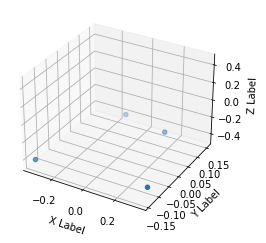

Time diff:  265.0
Footstep timestamp:  4119893.0
Height check index:  11442
Height check timestamp:  4119992.0

FL moving: 0.08950799999999998. FR moving: 0.00569900000000001
RL moving: 0.006842999999999988. RR moving: 0.09020499999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.397994. FR later: -0.403693
RR moving: -0.396804. RL moving: -0.307296

Coord FR: [0.34, -0.116, -0.398]. Coord FL: [0.151, 0.122, -0.397]. Coord RR: [-0.337, -0.141, -0.411]. Coord RL: [-0.146, 0.152, -0.404]

FR step_size: 0.378224. FL step_size: 0. RR step size: 0. RL step_size: 0.382448.


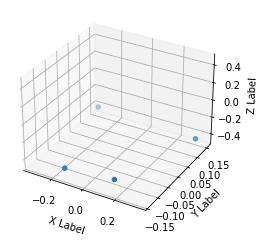

Time diff:  271.0
Footstep timestamp:  4120158.0
Height check index:  11574
Height check timestamp:  4120257.0

FL moving: 0.003713000000000022. FR moving: 0.08685199999999998
RL moving: 0.08460699999999999. RR moving: 0.006010000000000015

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398937. FR later: -0.312085
RR moving: -0.391391. RL moving: -0.395104

Coord FR: [0.15, -0.121, -0.399]. Coord FL: [0.34, 0.13, -0.391]. Coord RR: [-0.142, -0.136, -0.403]. Coord RL: [-0.333, 0.152, -0.41]

FR step_size: 0.378783. FL step_size: 0. RR step size: 0. RL step_size: 0.38247600000000004.


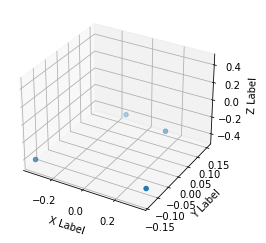

Time diff:  266.0
Footstep timestamp:  4120429.0
Height check index:  11709
Height check timestamp:  4120528.0

FL moving: 0.08890399999999998. FR moving: 0.005095999999999989
RL moving: 0.007701000000000013. RR moving: 0.089395

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.397447. FR later: -0.402543
RR moving: -0.396094. RL moving: -0.30719

Coord FR: [0.34, -0.118, -0.397]. Coord FL: [0.151, 0.125, -0.396]. Coord RR: [-0.336, -0.136, -0.411]. Coord RL: [-0.144, 0.15, -0.405]

FR step_size: 0.37664300000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.378711.


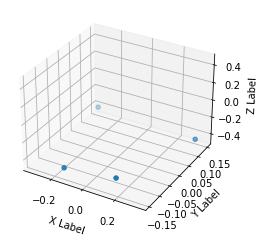

Time diff:  269.0
Footstep timestamp:  4120695.0
Height check index:  11842
Height check timestamp:  4120795.0

FL moving: 0.004618000000000011. FR moving: 0.08976100000000004
RL moving: 0.08826499999999998. RR moving: 0.006464000000000025

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397436. FR later: -0.307675
RR moving: -0.393049. RL moving: -0.397667

Coord FR: [0.151, -0.123, -0.397]. Coord FL: [0.339, 0.124, -0.393]. Coord RR: [-0.146, -0.145, -0.401]. Coord RL: [-0.332, 0.148, -0.411]

FR step_size: 0.37694000000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.38046800000000003.


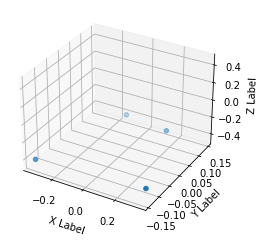

Time diff:  267.0
Footstep timestamp:  4120964.0
Height check index:  11976
Height check timestamp:  4121064.0

FL moving: 0.09051199999999998. FR moving: 0.006300000000000028
RL moving: 0.006491999999999998. RR moving: 0.09098899999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.395202. FR later: -0.401502
RR moving: -0.397686. RL moving: -0.307174

Coord FR: [0.34, -0.124, -0.395]. Coord FL: [0.151, 0.122, -0.398]. Coord RR: [-0.339, -0.141, -0.409]. Coord RL: [-0.144, 0.143, -0.406]

FR step_size: 0.3770490000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.382591.


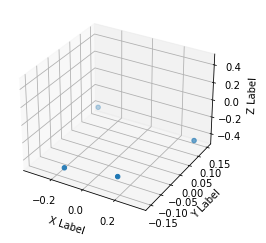

Time diff:  267.0
Footstep timestamp:  4121231.0
Height check index:  12109
Height check timestamp:  4121331.0

FL moving: 0.0048519999999999675. FR moving: 0.09001900000000002
RL moving: 0.087949. RR moving: 0.006594999999999962

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397108. FR later: -0.307089
RR moving: -0.394842. RL moving: -0.399694

Coord FR: [0.151, -0.123, -0.397]. Coord FL: [0.339, 0.117, -0.395]. Coord RR: [-0.145, -0.153, -0.4]. Coord RL: [-0.333, 0.148, -0.413]

FR step_size: 0.37516800000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.37914600000000004.


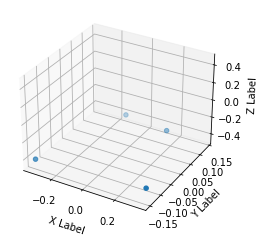

Time diff:  18449.0


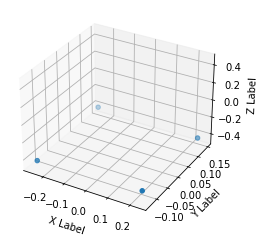

Time diff:  263.0
Footstep timestamp:  4139947.0
Height check index:  12330
Height check timestamp:  4140047.0

FL moving: 0.093949. FR moving: 0.0006140000000000034
RL moving: 0.002697999999999978. RR moving: 0.09783799999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.41559. FR later: -0.414976
RR moving: -0.406839. RL moving: -0.31289

Coord FR: [0.223, -0.118, -0.416]. Coord FL: [0.234, 0.135, -0.407]. Coord RR: [-0.25, -0.129, -0.418]. Coord RL: [-0.258, 0.145, -0.412]

FR step_size: 0.06676099999999999. FL step_size: 0. RR step size: 0. RL step_size: 0.068577.


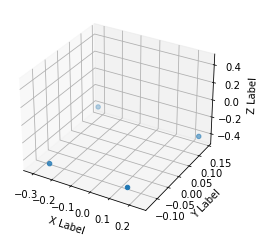

Time diff:  261.0
Footstep timestamp:  4140210.0
Height check index:  12461
Height check timestamp:  4140310.0

FL moving: 0.0010209999999999941. FR moving: 0.09024500000000002
RL moving: 0.08285399999999998. RR moving: 0.0003750000000000142

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.407719. FR later: -0.317474
RR moving: -0.402352. RL moving: -0.401331

Coord FR: [0.163, -0.127, -0.408]. Coord FL: [0.241, 0.136, -0.402]. Coord RR: [-0.237, -0.131, -0.407]. Coord RL: [-0.313, 0.14, -0.409]

FR step_size: 0.276532. FL step_size: 0. RR step size: 0. RL step_size: 0.277512.


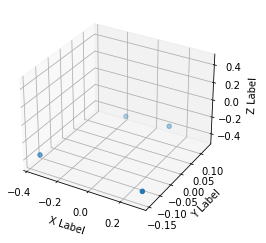

Time diff:  273.0
Footstep timestamp:  4140471.0
Height check index:  12591
Height check timestamp:  4140571.0

FL moving: 0.07909. FR moving: 0.005147999999999986
RL moving: 0.008604. RR moving: 0.076318

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.385351. FR later: -0.390499
RR moving: -0.394581. RL moving: -0.315491

Coord FR: [0.307, -0.144, -0.385]. Coord FL: [0.109, 0.131, -0.395]. Coord RR: [-0.372, -0.126, -0.4]. Coord RL: [-0.17, 0.123, -0.403]

FR step_size: 0.41968900000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.403452.


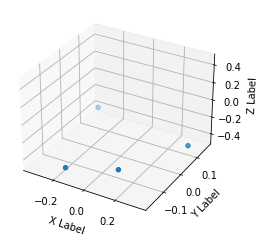

Time diff:  273.0
Footstep timestamp:  4140744.0
Height check index:  12727
Height check timestamp:  4140844.0

FL moving: 0.010798999999999948. FR moving: 0.08518400000000004
RL moving: 0.08469100000000002. RR moving: 0.00964100000000001

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390282. FR later: -0.305098
RR moving: -0.383574. RL moving: -0.394373

Coord FR: [0.119, -0.112, -0.39]. Coord FL: [0.341, 0.089, -0.384]. Coord RR: [-0.149, -0.173, -0.395]. Coord RL: [-0.35, 0.161, -0.414]

FR step_size: 0.40835200000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.39130299999999996.


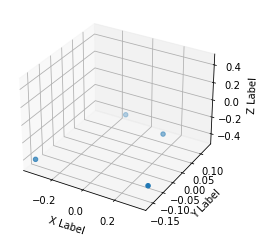

Time diff:  259.0
Footstep timestamp:  4141017.0
Height check index:  12863
Height check timestamp:  4141117.0

FL moving: 0.09398499999999999. FR moving: 0.00892900000000002
RL moving: 0.006563000000000041. RR moving: 0.09064

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.38653. FR later: -0.395459
RR moving: -0.394356. RL moving: -0.300371

Coord FR: [0.342, -0.135, -0.387]. Coord FL: [0.155, 0.092, -0.394]. Coord RR: [-0.339, -0.163, -0.409]. Coord RL: [-0.148, 0.134, -0.407]

FR step_size: 0.37279. FL step_size: 0. RR step size: 0. RL step_size: 0.39338300000000004.


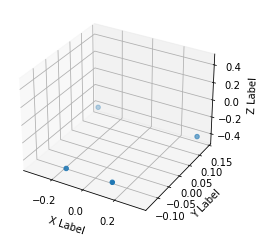

Time diff:  273.0
Footstep timestamp:  4141276.0
Height check index:  12992
Height check timestamp:  4141376.0

FL moving: 0.005695999999999979. FR moving: 0.08222200000000002
RL moving: 0.081874. RR moving: 0.009888999999999981

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394023. FR later: -0.311801
RR moving: -0.383147. RL moving: -0.388843

Coord FR: [0.156, -0.133, -0.394]. Coord FL: [0.342, 0.125, -0.383]. Coord RR: [-0.136, -0.134, -0.401]. Coord RL: [-0.338, 0.138, -0.413]

FR step_size: 0.385075. FL step_size: 0. RR step size: 0. RL step_size: 0.393836.


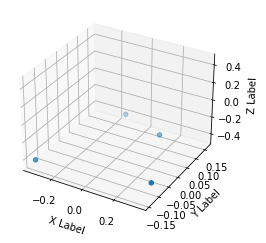

Time diff:  261.0
Footstep timestamp:  4141549.0
Height check index:  13128
Height check timestamp:  4141649.0

FL moving: 0.08896100000000001. FR moving: 0.008654999999999968
RL moving: 0.009164000000000005. RR moving: 0.09012999999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390583. FR later: -0.399238
RR moving: -0.391963. RL moving: -0.303002

Coord FR: [0.345, -0.098, -0.391]. Coord FL: [0.146, 0.11, -0.392]. Coord RR: [-0.335, -0.143, -0.415]. Coord RL: [-0.144, 0.162, -0.402]

FR step_size: 0.38733399999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.38598800000000005.


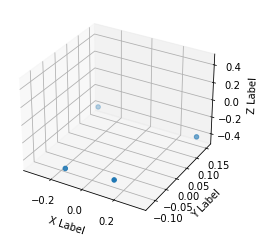

Time diff:  275.0
Footstep timestamp:  4141810.0
Height check index:  13258
Height check timestamp:  4141910.0

FL moving: 0.009575999999999973. FR moving: 0.08239999999999997
RL moving: 0.07916799999999996. RR moving: 0.008350999999999997

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397041. FR later: -0.314641
RR moving: -0.379931. RL moving: -0.389507

Coord FR: [0.156, -0.111, -0.397]. Coord FL: [0.345, 0.137, -0.38]. Coord RR: [-0.136, -0.123, -0.404]. Coord RL: [-0.331, 0.153, -0.409]

FR step_size: 0.383326. FL step_size: 0. RR step size: 0. RL step_size: 0.390361.


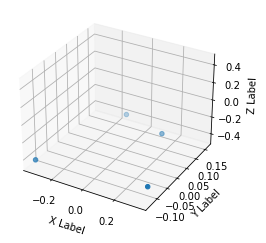

Time diff:  263.0
Footstep timestamp:  4142085.0
Height check index:  13395
Height check timestamp:  4142185.0

FL moving: 0.09037100000000003. FR moving: 0.006855
RL moving: 0.009386000000000005. RR moving: 0.09047699999999997

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394243. FR later: -0.401098
RR moving: -0.392448. RL moving: -0.302077

Coord FR: [0.344, -0.107, -0.394]. Coord FL: [0.15, 0.118, -0.392]. Coord RR: [-0.338, -0.133, -0.415]. Coord RL: [-0.142, 0.16, -0.402]

FR step_size: 0.385548. FL step_size: 0. RR step size: 0. RL step_size: 0.39180600000000004.


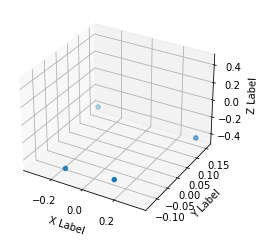

Time diff:  273.0
Footstep timestamp:  4142348.0
Height check index:  13526
Height check timestamp:  4142449.0

FL moving: 0.0071450000000000125. FR moving: 0.088038
RL moving: 0.085895. RR moving: 0.0069450000000000345

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397903. FR later: -0.309865
RR moving: -0.385006. RL moving: -0.392151

Coord FR: [0.153, -0.118, -0.398]. Coord FL: [0.344, 0.134, -0.385]. Coord RR: [-0.137, -0.132, -0.404]. Coord RL: [-0.333, 0.154, -0.409]

FR step_size: 0.38592099999999996. FL step_size: 0. RR step size: 0. RL step_size: 0.391911.


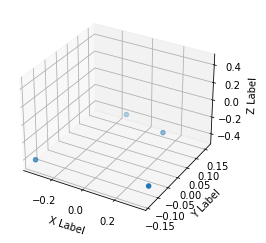

Time diff:  263.0
Footstep timestamp:  4142621.0
Height check index:  13661
Height check timestamp:  4142720.0

FL moving: 0.09040599999999999. FR moving: 0.005180000000000018
RL moving: 0.008247000000000004. RR moving: 0.09187699999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.396513. FR later: -0.401693
RR moving: -0.394129. RL moving: -0.303723

Coord FR: [0.343, -0.107, -0.397]. Coord FL: [0.148, 0.123, -0.394]. Coord RR: [-0.338, -0.138, -0.414]. Coord RL: [-0.142, 0.159, -0.402]

FR step_size: 0.38435700000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.38737900000000003.


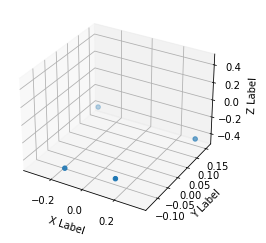

Time diff:  271.0
Footstep timestamp:  4142884.0
Height check index:  13792
Height check timestamp:  4142983.0

FL moving: 0.005541999999999991. FR moving: 0.08505400000000002
RL moving: 0.08491399999999999. RR moving: 0.006962999999999997

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397835. FR later: -0.312781
RR moving: -0.388874. RL moving: -0.394416

Coord FR: [0.153, -0.116, -0.398]. Coord FL: [0.342, 0.131, -0.389]. Coord RR: [-0.14, -0.135, -0.403]. Coord RL: [-0.331, 0.155, -0.41]

FR step_size: 0.38123900000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.388276.


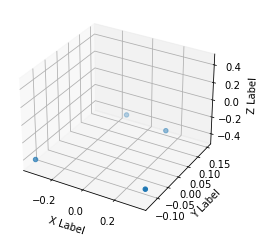

Time diff:  265.0
Footstep timestamp:  4143155.0
Height check index:  13927
Height check timestamp:  4143254.0

FL moving: 0.09013499999999997. FR moving: 0.005267999999999995
RL moving: 0.007596000000000047. RR moving: 0.09120699999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394845. FR later: -0.400113
RR moving: -0.395817. RL moving: -0.305682

Coord FR: [0.343, -0.12, -0.395]. Coord FL: [0.151, 0.126, -0.396]. Coord RR: [-0.339, -0.134, -0.411]. Coord RL: [-0.142, 0.148, -0.406]

FR step_size: 0.381819. FL step_size: 0. RR step size: 0. RL step_size: 0.38468800000000003.


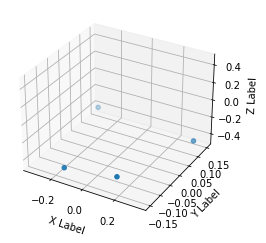

Time diff:  269.0
Footstep timestamp:  4143420.0
Height check index:  14059
Height check timestamp:  4143519.0

FL moving: 0.005120999999999987. FR moving: 0.088387
RL moving: 0.08629600000000004. RR moving: 0.006622000000000017

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395837. FR later: -0.30745
RR moving: -0.393169. RL moving: -0.39829

Coord FR: [0.151, -0.122, -0.396]. Coord FL: [0.341, 0.116, -0.393]. Coord RR: [-0.144, -0.15, -0.4]. Coord RL: [-0.331, 0.15, -0.414]

FR step_size: 0.38306700000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.386366.


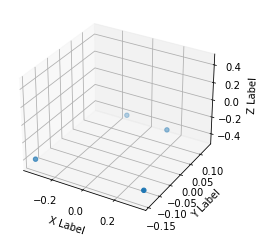

Time diff:  266.0
Footstep timestamp:  4143689.0
Height check index:  14193
Height check timestamp:  4143788.0

FL moving: 0.09051899999999996. FR moving: 0.007040999999999964
RL moving: 0.005439000000000027. RR moving: 0.09106000000000003

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391473. FR later: -0.398514
RR moving: -0.398788. RL moving: -0.308269

Coord FR: [0.344, -0.135, -0.391]. Coord FL: [0.151, 0.118, -0.399]. Coord RR: [-0.341, -0.142, -0.407]. Coord RL: [-0.141, 0.134, -0.409]

FR step_size: 0.382181. FL step_size: 0. RR step size: 0. RL step_size: 0.38809800000000005.


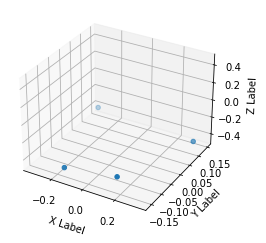

Time diff:  267.0
Footstep timestamp:  4143955.0
Height check index:  14326
Height check timestamp:  4144055.0

FL moving: 0.003970000000000029. FR moving: 0.08948800000000001
RL moving: 0.08970600000000001. RR moving: 0.007384000000000002

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39494. FR later: -0.305452
RR moving: -0.395858. RL moving: -0.399828

Coord FR: [0.151, -0.128, -0.395]. Coord FL: [0.34, 0.111, -0.396]. Coord RR: [-0.145, -0.156, -0.398]. Coord RL: [-0.333, 0.147, -0.416]

FR step_size: 0.37892800000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38287000000000004.


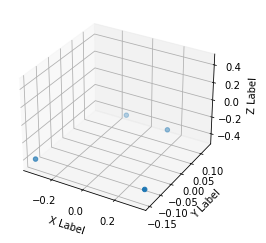

Time diff:  265.0
Footstep timestamp:  4144222.0
Height check index:  14459
Height check timestamp:  4144322.0

FL moving: 0.09238000000000002. FR moving: 0.006684000000000023
RL moving: 0.004962999999999995. RR moving: 0.09167799999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391495. FR later: -0.398179
RR moving: -0.399934. RL moving: -0.307554

Coord FR: [0.342, -0.136, -0.391]. Coord FL: [0.152, 0.116, -0.4]. Coord RR: [-0.338, -0.147, -0.406]. Coord RL: [-0.143, 0.131, -0.41]

FR step_size: 0.380166. FL step_size: 0. RR step size: 0. RL step_size: 0.38385400000000003.


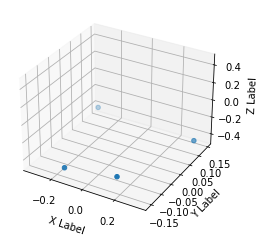

Time diff:  269.0
Footstep timestamp:  4144487.0
Height check index:  14591
Height check timestamp:  4144587.0

FL moving: 0.0047339999999999605. FR moving: 0.08940599999999999
RL moving: 0.088418. RR moving: 0.007410000000000028

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.394949. FR later: -0.305543
RR moving: -0.394004. RL moving: -0.398738

Coord FR: [0.151, -0.127, -0.395]. Coord FL: [0.341, 0.113, -0.394]. Coord RR: [-0.143, -0.155, -0.399]. Coord RL: [-0.332, 0.145, -0.415]

FR step_size: 0.381386. FL step_size: 0. RR step size: 0. RL step_size: 0.383128.


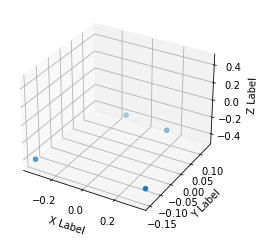

Time diff:  265.0
Footstep timestamp:  4144756.0
Height check index:  14725
Height check timestamp:  4144856.0

FL moving: 0.09100200000000003. FR moving: 0.007714999999999972
RL moving: 0.004357. RR moving: 0.090084

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392064. FR later: -0.399779
RR moving: -0.399374. RL moving: -0.308372

Coord FR: [0.343, -0.133, -0.392]. Coord FL: [0.152, 0.117, -0.399]. Coord RR: [-0.337, -0.148, -0.407]. Coord RL: [-0.143, 0.135, -0.409]

FR step_size: 0.38040100000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38613600000000003.


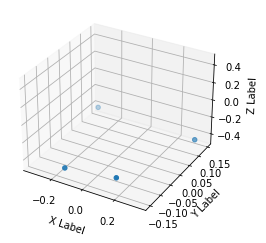

Time diff:  271.0
Footstep timestamp:  4145021.0
Height check index:  14857
Height check timestamp:  4145121.0

FL moving: 0.005614000000000008. FR moving: 0.08813499999999996
RL moving: 0.086727. RR moving: 0.007201999999999986

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396149. FR later: -0.308014
RR moving: -0.392659. RL moving: -0.398273

Coord FR: [0.153, -0.127, -0.396]. Coord FL: [0.342, 0.119, -0.393]. Coord RR: [-0.142, -0.15, -0.4]. Coord RL: [-0.334, 0.146, -0.414]

FR step_size: 0.378995. FL step_size: 0. RR step size: 0. RL step_size: 0.38614500000000007.


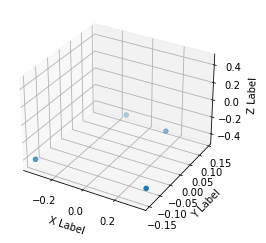

Time diff:  265.0
Footstep timestamp:  4145292.0
Height check index:  14992
Height check timestamp:  4145392.0

FL moving: 0.09242299999999998. FR moving: 0.005954999999999988
RL moving: 0.005705999999999989. RR moving: 0.091167

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394766. FR later: -0.400721
RR moving: -0.39873. RL moving: -0.306307

Coord FR: [0.341, -0.128, -0.395]. Coord FL: [0.151, 0.117, -0.399]. Coord RR: [-0.338, -0.146, -0.408]. Coord RL: [-0.144, 0.14, -0.408]

FR step_size: 0.37961000000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.386097.


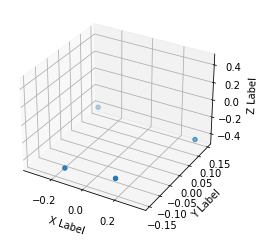

Time diff:  269.0
Footstep timestamp:  4145557.0
Height check index:  15124
Height check timestamp:  4145657.0

FL moving: 0.003164. FR moving: 0.08943500000000004
RL moving: 0.08969100000000002. RR moving: 0.007280000000000009

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39683. FR later: -0.307395
RR moving: -0.393623. RL moving: -0.396787

Coord FR: [0.151, -0.126, -0.397]. Coord FL: [0.341, 0.121, -0.394]. Coord RR: [-0.142, -0.146, -0.401]. Coord RL: [-0.334, 0.146, -0.412]

FR step_size: 0.37858400000000003. FL step_size: 0. RR step size: 0. RL step_size: 0.38261900000000004.


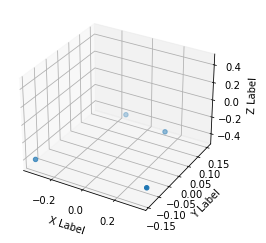

Time diff:  265.0
Footstep timestamp:  4145826.0
Height check index:  15258
Height check timestamp:  4145926.0

FL moving: 0.09070299999999998. FR moving: 0.005773000000000028
RL moving: 0.006748000000000032. RR moving: 0.090391

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.395476. FR later: -0.401249
RR moving: -0.39743. RL moving: -0.306727

Coord FR: [0.341, -0.12, -0.395]. Coord FL: [0.152, 0.121, -0.397]. Coord RR: [-0.335, -0.141, -0.41]. Coord RL: [-0.144, 0.149, -0.406]

FR step_size: 0.376294. FL step_size: 0. RR step size: 0. RL step_size: 0.3795200000000001.


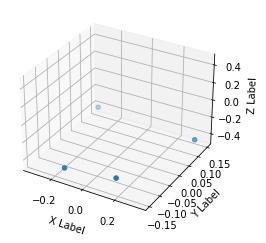

Time diff:  269.0
Footstep timestamp:  4146091.0
Height check index:  15390
Height check timestamp:  4146191.0

FL moving: 0.003872000000000042. FR moving: 0.08796999999999999
RL moving: 0.08672399999999997. RR moving: 0.007161999999999946

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396887. FR later: -0.308917
RR moving: -0.392939. RL moving: -0.396811

Coord FR: [0.152, -0.124, -0.397]. Coord FL: [0.34, 0.121, -0.393]. Coord RR: [-0.143, -0.146, -0.401]. Coord RL: [-0.332, 0.148, -0.412]

FR step_size: 0.37596100000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.37983000000000006.


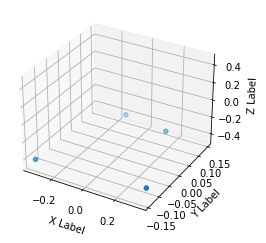

Time diff:  265.0
Footstep timestamp:  4146360.0
Height check index:  15523
Height check timestamp:  4146459.0

FL moving: 0.08936900000000003. FR moving: 0.006070999999999993
RL moving: 0.005760999999999961. RR moving: 0.08876499999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39406. FR later: -0.400131
RR moving: -0.397554. RL moving: -0.308185

Coord FR: [0.34, -0.122, -0.394]. Coord FL: [0.152, 0.121, -0.398]. Coord RR: [-0.335, -0.141, -0.409]. Coord RL: [-0.144, 0.145, -0.407]

FR step_size: 0.37541900000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.375083.


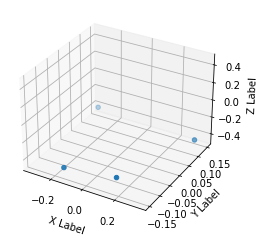

Time diff:  15180.0


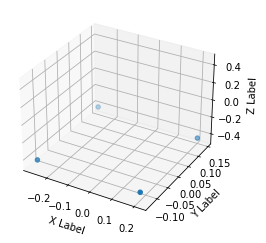

Time diff:  259.0
Footstep timestamp:  4161805.0
Height check index:  15876
Height check timestamp:  4161905.0

FL moving: 0.00013599999999996948. FR moving: 0.09652299999999997
RL moving: 0.09199099999999999. RR moving: 0.0015800000000000258

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.412597. FR later: -0.316074
RR moving: -0.406054. RL moving: -0.40619

Coord FR: [0.203, -0.128, -0.413]. Coord FL: [0.215, 0.133, -0.406]. Coord RR: [-0.266, -0.131, -0.409]. Coord RL: [-0.275, 0.144, -0.409]

FR step_size: 0.17810199999999998. FL step_size: 0. RR step size: 0. RL step_size: 0.18711400000000003.


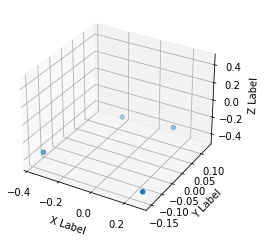

Time diff:  271.0
Footstep timestamp:  4162064.0
Height check index:  16005
Height check timestamp:  4162164.0

FL moving: 0.079453. FR moving: 0.0031059999999999977
RL moving: 0.007103999999999999. RR moving: 0.07719199999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.389528. FR later: -0.392634
RR moving: -0.397441. RL moving: -0.317988

Coord FR: [0.281, -0.153, -0.39]. Coord FL: [0.115, 0.132, -0.397]. Coord RR: [-0.371, -0.121, -0.399]. Coord RL: [-0.193, 0.116, -0.404]

FR step_size: 0.391523. FL step_size: 0. RR step size: 0. RL step_size: 0.380856.


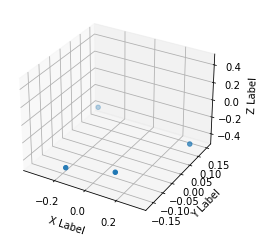

Time diff:  273.0
Footstep timestamp:  4162335.0
Height check index:  16140
Height check timestamp:  4162435.0

FL moving: 0.009541999999999995. FR moving: 0.08303100000000002
RL moving: 0.08661999999999997. RR moving: 0.010948000000000013

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.390706. FR later: -0.307675
RR moving: -0.385099. RL moving: -0.394641

Coord FR: [0.109, -0.122, -0.391]. Coord FL: [0.334, 0.093, -0.385]. Coord RR: [-0.156, -0.166, -0.394]. Coord RL: [-0.359, 0.151, -0.413]

FR step_size: 0.413176. FL step_size: 0. RR step size: 0. RL step_size: 0.397104.


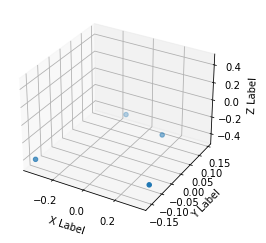

Time diff:  261.0
Footstep timestamp:  4162608.0
Height check index:  16276
Height check timestamp:  4162709.0

FL moving: 0.09525. FR moving: 0.008004999999999984
RL moving: 0.007678000000000018. RR moving: 0.09317399999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.390193. FR later: -0.398198
RR moving: -0.394602. RL moving: -0.299352

Coord FR: [0.34, -0.123, -0.39]. Coord FL: [0.152, 0.096, -0.395]. Coord RR: [-0.344, -0.157, -0.409]. Coord RL: [-0.15, 0.143, -0.404]

FR step_size: 0.370355. FL step_size: 0. RR step size: 0. RL step_size: 0.391682.


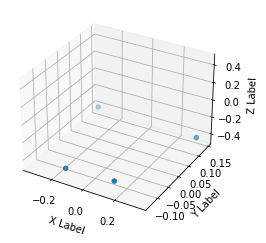

Time diff:  273.0
Footstep timestamp:  4162869.0
Height check index:  16405
Height check timestamp:  4162968.0

FL moving: 0.005238999999999994. FR moving: 0.083536
RL moving: 0.08116099999999998. RR moving: 0.009128999999999998

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396165. FR later: -0.312629
RR moving: -0.385759. RL moving: -0.390998

Coord FR: [0.157, -0.125, -0.396]. Coord FL: [0.34, 0.126, -0.386]. Coord RR: [-0.139, -0.133, -0.401]. Coord RL: [-0.337, 0.143, -0.41]

FR step_size: 0.375912. FL step_size: 0. RR step size: 0. RL step_size: 0.387668.


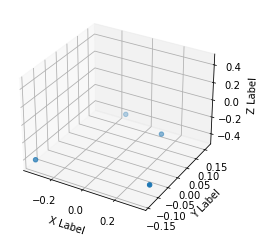

Time diff:  263.0
Footstep timestamp:  4163142.0
Height check index:  16541
Height check timestamp:  4163241.0

FL moving: 0.08879199999999998. FR moving: 0.006031000000000009
RL moving: 0.009402000000000021. RR moving: 0.08962900000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.395009. FR later: -0.40104
RR moving: -0.393403. RL moving: -0.304611

Coord FR: [0.341, -0.103, -0.395]. Coord FL: [0.148, 0.116, -0.393]. Coord RR: [-0.335, -0.139, -0.414]. Coord RL: [-0.145, 0.161, -0.402]

FR step_size: 0.382166. FL step_size: 0. RR step size: 0. RL step_size: 0.38371400000000006.


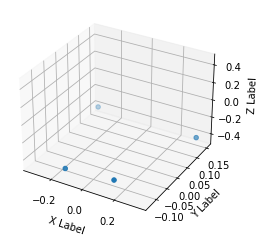

Time diff:  271.0
Footstep timestamp:  4163405.0
Height check index:  16672
Height check timestamp:  4163504.0

FL moving: 0.006103000000000025. FR moving: 0.08459500000000003
RL moving: 0.082171. RR moving: 0.006375999999999993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397687. FR later: -0.313092
RR moving: -0.385302. RL moving: -0.391405

Coord FR: [0.153, -0.116, -0.398]. Coord FL: [0.342, 0.134, -0.385]. Coord RR: [-0.138, -0.128, -0.405]. Coord RL: [-0.332, 0.152, -0.409]

FR step_size: 0.382935. FL step_size: 0. RR step size: 0. RL step_size: 0.388567.


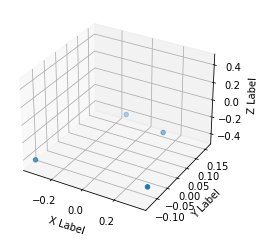

Time diff:  265.0
Footstep timestamp:  4163676.0
Height check index:  16807
Height check timestamp:  4163775.0

FL moving: 0.08699799999999996. FR moving: 0.007283999999999957
RL moving: 0.008435999999999999. RR moving: 0.08807899999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394006. FR later: -0.40129
RR moving: -0.393252. RL moving: -0.306254

Coord FR: [0.344, -0.108, -0.394]. Coord FL: [0.15, 0.124, -0.393]. Coord RR: [-0.336, -0.133, -0.415]. Coord RL: [-0.142, 0.159, -0.403]

FR step_size: 0.383953. FL step_size: 0. RR step size: 0. RL step_size: 0.385606.


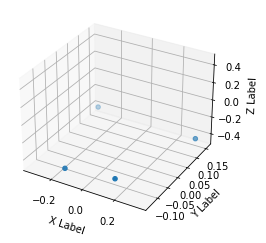

Time diff:  270.0
Footstep timestamp:  4163941.0
Height check index:  16939
Height check timestamp:  4164040.0

FL moving: 0.004794999999999994. FR moving: 0.08643699999999999
RL moving: 0.08470300000000003. RR moving: 0.0068170000000000175

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397148. FR later: -0.310711
RR moving: -0.387506. RL moving: -0.392301

Coord FR: [0.151, -0.117, -0.397]. Coord FL: [0.341, 0.132, -0.388]. Coord RR: [-0.14, -0.135, -0.404]. Coord RL: [-0.332, 0.155, -0.41]

FR step_size: 0.38455200000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.39005999999999996.


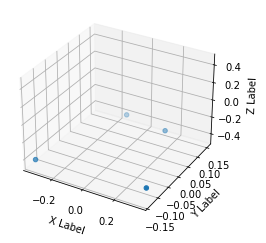

Time diff:  265.0
Footstep timestamp:  4164211.0
Height check index:  17074
Height check timestamp:  4164311.0

FL moving: 0.08812500000000001. FR moving: 0.006971000000000005
RL moving: 0.00859500000000002. RR moving: 0.08965000000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.393116. FR later: -0.400087
RR moving: -0.39447. RL moving: -0.306345

Coord FR: [0.345, -0.117, -0.393]. Coord FL: [0.15, 0.126, -0.394]. Coord RR: [-0.338, -0.136, -0.412]. Coord RL: [-0.14, 0.15, -0.405]

FR step_size: 0.38197. FL step_size: 0. RR step size: 0. RL step_size: 0.38483100000000003.


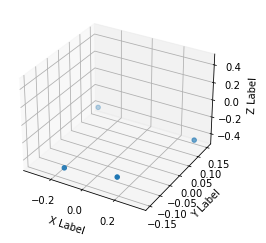

Time diff:  271.0
Footstep timestamp:  4164476.0
Height check index:  17206
Height check timestamp:  4164576.0

FL moving: 0.006392999999999982. FR moving: 0.08704299999999998
RL moving: 0.08455799999999997. RR moving: 0.006776000000000004

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39576. FR later: -0.308717
RR moving: -0.390504. RL moving: -0.396897

Coord FR: [0.153, -0.121, -0.396]. Coord FL: [0.34, 0.119, -0.391]. Coord RR: [-0.143, -0.148, -0.401]. Coord RL: [-0.33, 0.149, -0.414]

FR step_size: 0.3787560000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.38165800000000005.


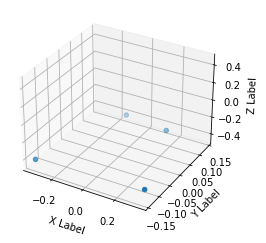

Time diff:  265.0
Footstep timestamp:  4164747.0
Height check index:  17341
Height check timestamp:  4164847.0

FL moving: 0.09092800000000001. FR moving: 0.007290999999999992
RL moving: 0.005344999999999989. RR moving: 0.09092999999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.392134. FR later: -0.399425
RR moving: -0.397423. RL moving: -0.306495

Coord FR: [0.342, -0.13, -0.392]. Coord FL: [0.151, 0.118, -0.397]. Coord RR: [-0.338, -0.141, -0.409]. Coord RL: [-0.143, 0.138, -0.408]

FR step_size: 0.381582. FL step_size: 0. RR step size: 0. RL step_size: 0.386509.


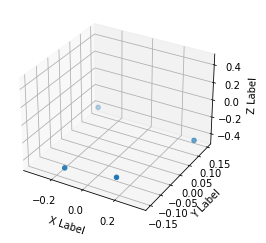

Time diff:  269.0
Footstep timestamp:  4165012.0
Height check index:  17473
Height check timestamp:  4165112.0

FL moving: 0.005967999999999973. FR moving: 0.088345
RL moving: 0.08618599999999998. RR moving: 0.006932000000000049

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.395419. FR later: -0.307074
RR moving: -0.391681. RL moving: -0.397649

Coord FR: [0.15, -0.126, -0.395]. Coord FL: [0.34, 0.116, -0.392]. Coord RR: [-0.144, -0.151, -0.4]. Coord RL: [-0.335, 0.147, -0.414]

FR step_size: 0.383393. FL step_size: 0. RR step size: 0. RL step_size: 0.386927.


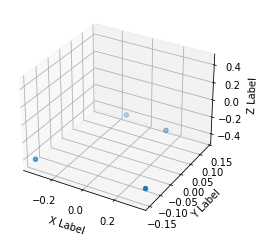

Time diff:  267.0
Footstep timestamp:  4165281.0
Height check index:  17607
Height check timestamp:  4165381.0

FL moving: 0.08961399999999997. FR moving: 0.00905499999999998
RL moving: 0.005209999999999992. RR moving: 0.08818200000000004

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.391195. FR later: -0.40025
RR moving: -0.398039. RL moving: -0.308425

Coord FR: [0.344, -0.132, -0.391]. Coord FL: [0.15, 0.116, -0.398]. Coord RR: [-0.339, -0.147, -0.408]. Coord RL: [-0.143, 0.136, -0.408]

FR step_size: 0.38527900000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.3909.


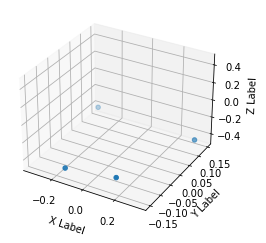

Time diff:  269.0
Footstep timestamp:  4165548.0
Height check index:  17740
Height check timestamp:  4165648.0

FL moving: 0.004840999999999984. FR moving: 0.089669
RL moving: 0.08821400000000001. RR moving: 0.006981999999999988

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396547. FR later: -0.306878
RR moving: -0.392501. RL moving: -0.397342

Coord FR: [0.15, -0.126, -0.397]. Coord FL: [0.342, 0.118, -0.393]. Coord RR: [-0.142, -0.15, -0.4]. Coord RL: [-0.337, 0.146, -0.413]

FR step_size: 0.382188. FL step_size: 0. RR step size: 0. RL step_size: 0.389456.


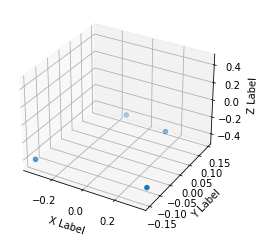

Time diff:  267.0
Footstep timestamp:  4165817.0
Height check index:  17874
Height check timestamp:  4165917.0

FL moving: 0.08955999999999997. FR moving: 0.008052999999999977
RL moving: 0.005672999999999984. RR moving: 0.0897

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394587. FR later: -0.40264
RR moving: -0.398159. RL moving: -0.308599

Coord FR: [0.342, -0.125, -0.395]. Coord FL: [0.152, 0.117, -0.398]. Coord RR: [-0.338, -0.147, -0.409]. Coord RL: [-0.143, 0.143, -0.407]

FR step_size: 0.381107. FL step_size: 0. RR step size: 0. RL step_size: 0.3898440000000001.


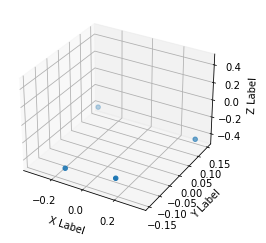

Time diff:  271.0
Footstep timestamp:  4166084.0
Height check index:  18007
Height check timestamp:  4166184.0

FL moving: 0.004554999999999976. FR moving: 0.08940100000000001
RL moving: 0.08851499999999995. RR moving: 0.007280000000000009

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39835. FR later: -0.308949
RR moving: -0.393056. RL moving: -0.397611

Coord FR: [0.151, -0.124, -0.398]. Coord FL: [0.342, 0.123, -0.393]. Coord RR: [-0.141, -0.145, -0.402]. Coord RL: [-0.336, 0.147, -0.411]

FR step_size: 0.38070600000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.38607900000000006.


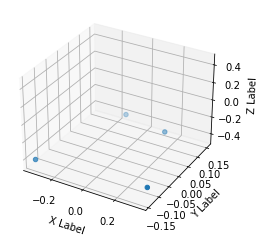

Time diff:  263.0
Footstep timestamp:  4166355.0
Height check index:  18142
Height check timestamp:  4166455.0

FL moving: 0.09177200000000002. FR moving: 0.0048559999999999715
RL moving: 0.007651999999999992. RR moving: 0.09323399999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.398482. FR later: -0.403338
RR moving: -0.397438. RL moving: -0.305666

Coord FR: [0.341, -0.117, -0.398]. Coord FL: [0.151, 0.122, -0.397]. Coord RR: [-0.337, -0.141, -0.411]. Coord RL: [-0.145, 0.151, -0.404]

FR step_size: 0.37843400000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.38222600000000007.


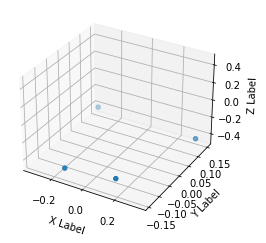

Time diff:  271.0
Footstep timestamp:  4166618.0
Height check index:  18272
Height check timestamp:  4166717.0

FL moving: 0.005473000000000006. FR moving: 0.0852
RL moving: 0.08379900000000001. RR moving: 0.006651999999999991

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398935. FR later: -0.313735
RR moving: -0.391491. RL moving: -0.396964

Coord FR: [0.153, -0.123, -0.399]. Coord FL: [0.341, 0.126, -0.391]. Coord RR: [-0.142, -0.143, -0.402]. Coord RL: [-0.333, 0.148, -0.411]

FR step_size: 0.3780990000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.381238.


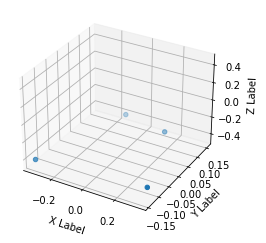

Time diff:  267.0
Footstep timestamp:  4166889.0
Height check index:  18407
Height check timestamp:  4166988.0

FL moving: 0.08754200000000001. FR moving: 0.006722000000000006
RL moving: 0.006803999999999977. RR moving: 0.088426

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.396759. FR later: -0.403481
RR moving: -0.396971. RL moving: -0.309429

Coord FR: [0.341, -0.117, -0.397]. Coord FL: [0.151, 0.123, -0.397]. Coord RR: [-0.334, -0.141, -0.411]. Coord RL: [-0.144, 0.152, -0.405]

FR step_size: 0.379355. FL step_size: 0. RR step size: 0. RL step_size: 0.37879100000000004.


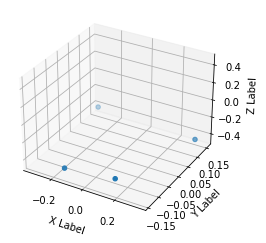

Time diff:  269.0
Footstep timestamp:  4167156.0
Height check index:  18540
Height check timestamp:  4167255.0

FL moving: 0.005135999999999974. FR moving: 0.08848499999999998
RL moving: 0.08625. RR moving: 0.005824000000000051

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39903. FR later: -0.310545
RR moving: -0.392716. RL moving: -0.397852

Coord FR: [0.15, -0.121, -0.399]. Coord FL: [0.34, 0.127, -0.393]. Coord RR: [-0.143, -0.14, -0.403]. Coord RL: [-0.332, 0.152, -0.41]

FR step_size: 0.38016600000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.38058100000000006.


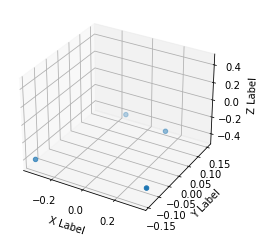

Time diff:  267.0
Footstep timestamp:  4167425.0
Height check index:  18674
Height check timestamp:  4167524.0

FL moving: 0.08703699999999998. FR moving: 0.006774000000000002
RL moving: 0.006847999999999965. RR moving: 0.08876200000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.395983. FR later: -0.402757
RR moving: -0.397391. RL moving: -0.310354

Coord FR: [0.341, -0.121, -0.396]. Coord FL: [0.151, 0.123, -0.397]. Coord RR: [-0.336, -0.141, -0.41]. Coord RL: [-0.145, 0.148, -0.405]

FR step_size: 0.378547. FL step_size: 0. RR step size: 0. RL step_size: 0.382016.


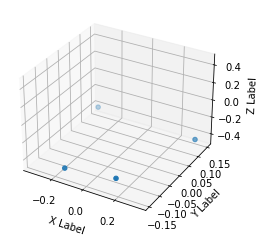

Time diff:  270.0
Footstep timestamp:  4167692.0
Height check index:  18807
Height check timestamp:  4167791.0

FL moving: 0.004060999999999981. FR moving: 0.087945
RL moving: 0.08706199999999997. RR moving: 0.006806000000000034

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.398144. FR later: -0.310199
RR moving: -0.394019. RL moving: -0.39808

Coord FR: [0.151, -0.124, -0.398]. Coord FL: [0.339, 0.123, -0.394]. Coord RR: [-0.144, -0.145, -0.402]. Coord RL: [-0.335, 0.148, -0.411]

FR step_size: 0.37525700000000006. FL step_size: 0. RR step size: 0. RL step_size: 0.38171600000000006.


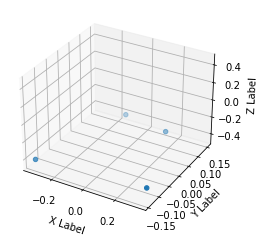

Time diff:  263.0
Footstep timestamp:  4167962.0
Height check index:  18942
Height check timestamp:  4168062.0

FL moving: 0.09201100000000001. FR moving: 0.004481000000000013
RL moving: 0.007075999999999971. RR moving: 0.09281800000000001

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.397399. FR later: -0.40188
RR moving: -0.397634. RL moving: -0.305623

Coord FR: [0.339, -0.12, -0.397]. Coord FL: [0.152, 0.122, -0.398]. Coord RR: [-0.336, -0.141, -0.41]. Coord RL: [-0.146, 0.148, -0.406]

FR step_size: 0.37340900000000005. FL step_size: 0. RR step size: 0. RL step_size: 0.376682.


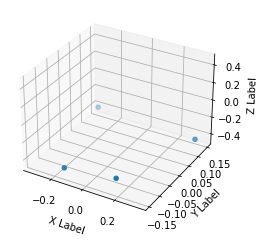

Time diff:  271.0
Footstep timestamp:  4168225.0
Height check index:  19073
Height check timestamp:  4168325.0

FL moving: 0.0041380000000000305. FR moving: 0.08669699999999997
RL moving: 0.08655200000000002. RR moving: 0.007180999999999993

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397468. FR later: -0.310771
RR moving: -0.391885. RL moving: -0.396023

Coord FR: [0.153, -0.124, -0.397]. Coord FL: [0.339, 0.123, -0.392]. Coord RR: [-0.144, -0.145, -0.401]. Coord RL: [-0.331, 0.148, -0.412]

FR step_size: 0.373981. FL step_size: 0. RR step size: 0. RL step_size: 0.37644800000000006.


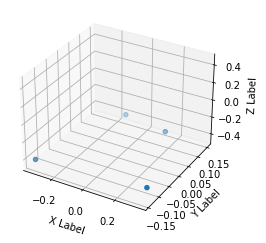

Time diff:  265.0
Footstep timestamp:  4168496.0
Height check index:  19208
Height check timestamp:  4168596.0

FL moving: 0.09066399999999997. FR moving: 0.005226000000000008
RL moving: 0.007070000000000021. RR moving: 0.09131099999999998

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.39608. FR later: -0.401306
RR moving: -0.396626. RL moving: -0.305962

Coord FR: [0.339, -0.119, -0.396]. Coord FL: [0.151, 0.122, -0.397]. Coord RR: [-0.335, -0.141, -0.41]. Coord RL: [-0.145, 0.149, -0.406]

FR step_size: 0.3742000000000001. FL step_size: 0. RR step size: 0. RL step_size: 0.37775200000000003.


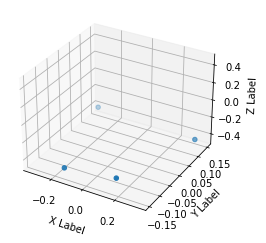

Time diff:  271.0
Footstep timestamp:  4168761.0
Height check index:  19340
Height check timestamp:  4168861.0

FL moving: 0.0031079999999999997. FR moving: 0.08809500000000003
RL moving: 0.08823600000000004. RR moving: 0.007336999999999982

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.396861. FR later: -0.308766
RR moving: -0.392252. RL moving: -0.39536

Coord FR: [0.152, -0.124, -0.397]. Coord FL: [0.338, 0.122, -0.392]. Coord RR: [-0.144, -0.146, -0.401]. Coord RL: [-0.331, 0.148, -0.412]

FR step_size: 0.373934. FL step_size: 0. RR step size: 0. RL step_size: 0.37612600000000007.


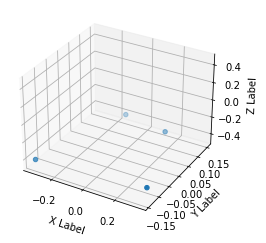

Time diff:  265.0
Footstep timestamp:  4169032.0
Height check index:  19475
Height check timestamp:  4169132.0

FL moving: 0.092088. FR moving: 0.0048579999999999735
RL moving: 0.007583000000000006. RR moving: 0.09326999999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.396243. FR later: -0.401101
RR moving: -0.396274. RL moving: -0.304186

Coord FR: [0.339, -0.119, -0.396]. Coord FL: [0.151, 0.121, -0.396]. Coord RR: [-0.336, -0.141, -0.411]. Coord RL: [-0.146, 0.149, -0.405]

FR step_size: 0.374499. FL step_size: 0. RR step size: 0. RL step_size: 0.37831800000000004.


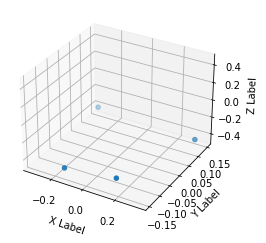

Time diff:  269.0
Footstep timestamp:  4169297.0
Height check index:  19607
Height check timestamp:  4169397.0

FL moving: 0.0036599999999999966. FR moving: 0.08968599999999999
RL moving: 0.088478. RR moving: 0.0072309999999999874

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.39666. FR later: -0.306974
RR moving: -0.392726. RL moving: -0.396386

Coord FR: [0.152, -0.124, -0.397]. Coord FL: [0.338, 0.122, -0.393]. Coord RR: [-0.144, -0.146, -0.401]. Coord RL: [-0.332, 0.148, -0.412]

FR step_size: 0.373771. FL step_size: 0. RR step size: 0. RL step_size: 0.38061000000000006.


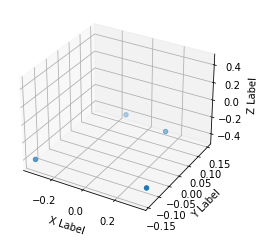

Time diff:  267.0
Footstep timestamp:  4169566.0
Height check index:  19741
Height check timestamp:  4169666.0

FL moving: 0.09062300000000001. FR moving: 0.005993000000000026
RL moving: 0.007012000000000018. RR moving: 0.09032599999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.395312. FR later: -0.401305
RR moving: -0.397196. RL moving: -0.306573

Coord FR: [0.34, -0.121, -0.395]. Coord FL: [0.152, 0.121, -0.397]. Coord RR: [-0.337, -0.141, -0.41]. Coord RL: [-0.145, 0.147, -0.406]

FR step_size: 0.376958. FL step_size: 0. RR step size: 0. RL step_size: 0.38173.


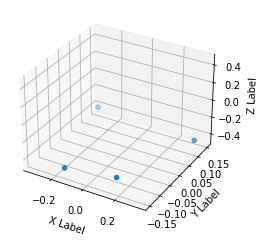

Time diff:  267.0
Footstep timestamp:  4169833.0
Height check index:  19874
Height check timestamp:  4169933.0

FL moving: 0.004632000000000025. FR moving: 0.08978000000000003
RL moving: 0.089586. RR moving: 0.0069849999999999635

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397177. FR later: -0.307397
RR moving: -0.394705. RL moving: -0.399337

Coord FR: [0.151, -0.123, -0.397]. Coord FL: [0.34, 0.119, -0.395]. Coord RR: [-0.144, -0.148, -0.401]. Coord RL: [-0.334, 0.149, -0.412]

FR step_size: 0.375127. FL step_size: 0. RR step size: 0. RL step_size: 0.381342.


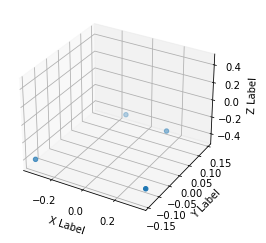

Time diff:  267.0
Footstep timestamp:  4170100.0
Height check index:  20007
Height check timestamp:  4170200.0

FL moving: 0.089144. FR moving: 0.006877999999999995
RL moving: 0.006164000000000003. RR moving: 0.08951799999999999

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.394549. FR later: -0.401427
RR moving: -0.39813. RL moving: -0.308986

Coord FR: [0.34, -0.125, -0.395]. Coord FL: [0.154, 0.121, -0.398]. Coord RR: [-0.336, -0.141, -0.409]. Coord RL: [-0.145, 0.143, -0.406]

FR step_size: 0.375487. FL step_size: 0. RR step size: 0. RL step_size: 0.38069900000000007.


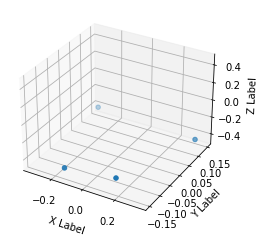

Time diff:  271.0
Footstep timestamp:  4170367.0
Height check index:  20139
Height check timestamp:  4170466.0

FL moving: 0.005610000000000004. FR moving: 0.08622399999999997
RL moving: 0.08671699999999999. RR moving: 0.006516999999999995

FL moving: False. FR moving: True
RL moving: True. RR moving: False

FR before: -0.397186. FR later: -0.310962
RR moving: -0.39409. RL moving: -0.3997

Coord FR: [0.151, -0.125, -0.397]. Coord FL: [0.34, 0.122, -0.394]. Coord RR: [-0.144, -0.147, -0.401]. Coord RL: [-0.333, 0.147, -0.412]

FR step_size: 0.37632000000000004. FL step_size: 0. RR step size: 0. RL step_size: 0.37956500000000004.


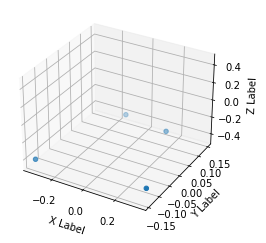

Time diff:  267.0
Footstep timestamp:  4170638.0
Height check index:  20274
Height check timestamp:  4170737.0

FL moving: 0.09068100000000001. FR moving: 0.005598999999999965
RL moving: 0.006008999999999987. RR moving: 0.09099199999999996

FL moving: True. FR moving: False
RL moving: False. RR moving: True

FR before: -0.397351. FR later: -0.40295
RR moving: -0.398408. RL moving: -0.307727

Coord FR: [0.339, -0.123, -0.397]. Coord FL: [0.152, 0.121, -0.398]. Coord RR: [-0.338, -0.142, -0.408]. Coord RL: [-0.147, 0.145, -0.406]

FR step_size: 0.377072. FL step_size: 0. RR step size: 0. RL step_size: 0.38327100000000003.


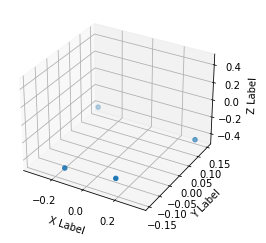

In [42]:
def visualize_absolute_foostep_sizes(dataset, footsteps):    
    # Visualize footsteps
    for idx, footstep in enumerate(footsteps):
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')

        #ax.set_xlim([-0.5, 0.5])
        #ax.set_ylim([-0.3, 0.3])
        ax.set_zlim([-0.5, 0.5])

        dataset[footstep, 32:44] = np.round(dataset[footstep, 32:44], 3)
                    
        # 3D positions
        xs = np.array([dataset[footstep, 32], dataset[footstep, 35], dataset[footstep, 38], dataset[footstep, 41]])
        ys = np.array([dataset[footstep, 33], dataset[footstep, 36], dataset[footstep, 39], dataset[footstep, 42]])
        zs = np.array([dataset[footstep, 34], dataset[footstep, 37], dataset[footstep, 40], dataset[footstep, 43]])    

        ax.scatter(xs, ys, zs, marker='o')

        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')

        plt.show()
        
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
        
            print("Time diff: ", time_diff)

            if time_diff < 300:
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(motion_05_cmds[:, 0] - (motion_05_cmds[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(motion_05_cmds[footstep, 34] - motion_05_cmds[idx_height_check, 34])
                fl_moving = np.abs(motion_05_cmds[footstep, 37] - motion_05_cmds[idx_height_check, 37])
                rr_moving = np.abs(motion_05_cmds[footstep, 40] - motion_05_cmds[idx_height_check, 40])
                rl_moving = np.abs(motion_05_cmds[footstep, 43] - motion_05_cmds[idx_height_check, 43])
                
                print("Footstep timestamp: ", motion_05_cmds[footstep, 0])
                print("Height check index: ", idx_height_check)
                print("Height check timestamp: ", motion_05_cmds[idx_height_check, 0])

                print(f'\nFL moving: {fl_moving}. FR moving: {fr_moving}')
                print(f'RL moving: {rl_moving}. RR moving: {rr_moving}')

                print(f'\nFL moving: {fl_moving > 0.06}. FR moving: {fr_moving > 0.06}')
                print(f'RL moving: {rl_moving > 0.06}. RR moving: {rr_moving > 0.06}')
                
                print(f'\nFR before: {motion_05_cmds[footstep, 34]}. FR later: {motion_05_cmds[idx_height_check, 34]}')
                print(f'RR moving: {motion_05_cmds[footstep, 37]}. RL moving: {motion_05_cmds[idx_height_check, 37]}')

                assert (fr_moving > 0.06) == (rl_moving > 0.06)
                assert (rr_moving > 0.06) == (fl_moving > 0.06)
                assert (fr_moving > 0.06) != (fl_moving > 0.06)
                
                # Compute front feet movements
                fr_movement = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fl_movement = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                rr_movement = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rl_movement = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                
                print(f'\nCoord FR: {[xs[0], ys[0], zs[0]]}. Coord FL: {[xs[1], ys[1], zs[1]]}. Coord RR: {[xs[2], ys[2], zs[2]]}. Coord RL: {[xs[3], ys[3], zs[3]]}')
                
                if fr_moving:
                    print(f'\nFR step_size: {fr_movement + fl_movement}. FL step_size: {0}. RR step size: {0}. RL step_size: {rl_movement + rr_movement}.')
                elif fl_moving:
                    print(f'\nFR step_size: {0}. FL step_size: {fl_movement + fr_movement}. RR step size: {rl_movement + rr_movement}. RL step_size: {0}.')
                else:
                    print("\nERROR")

cmds = get_specific_cmd(motion_05, velocity, 0, 0)
motion_05_cmds = motion_05[cmds]
visualize_absolute_foostep_sizes(motion_05_fwd, footsteps_05_fwd)

### Forward motion

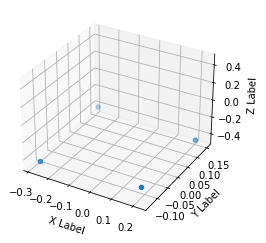

Command: [0.518221 0.       0.      ]. State: [0.417402  0.0342839 0.0573968]. Coord: [0.195, -0.11, -0.417].


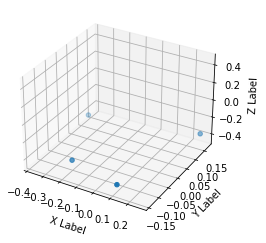

Diff: 257.0. Command: [0.518221 0.       0.      ]. State: [ 0.330497  0.103217 -0.309054]. Coord: [0.113, -0.14, -0.403]. Step size: [-0.082, -0.030000000000000013, 0.013999999999999957].


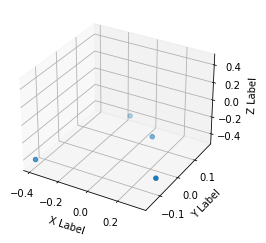

Diff: 277.0. Command: [0.518221 0.       0.      ]. State: [ 0.19708  -0.264475  0.400412]. Coord: [0.33, -0.079, -0.39]. Step size: [0.21700000000000003, 0.06100000000000001, 0.013000000000000012].


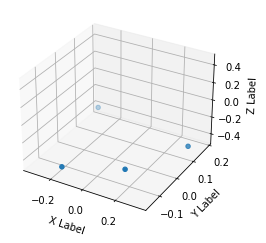

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.220468  -0.13433    0.0137209]. Coord: [0.148, -0.078, -0.394]. Step size: [-0.18200000000000002, 0.0010000000000000009, -0.0040000000000000036].


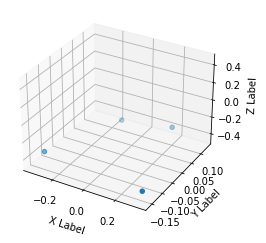

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [0.0993652 0.127757  0.21186  ]. Coord: [0.338, -0.158, -0.383]. Step size: [0.19000000000000003, -0.08, 0.01100000000000001].


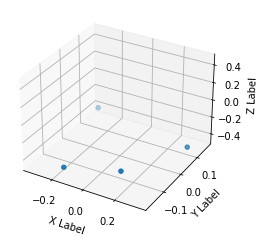

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.247883   0.0727412 -0.0619128]. Coord: [0.14, -0.115, -0.394]. Step size: [-0.198, 0.043, -0.01100000000000001].


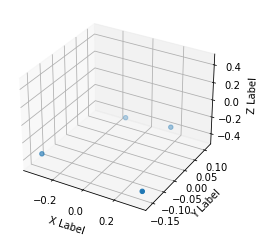

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.151338 0.106533 0.285363]. Coord: [0.346, -0.161, -0.385]. Step size: [0.20599999999999996, -0.046, 0.009000000000000008].


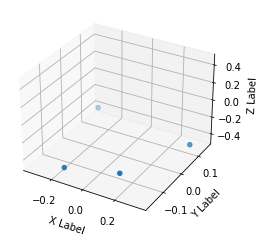

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.228852   0.0326811 -0.0693697]. Coord: [0.146, -0.122, -0.394]. Step size: [-0.19999999999999998, 0.03900000000000001, -0.009000000000000008].


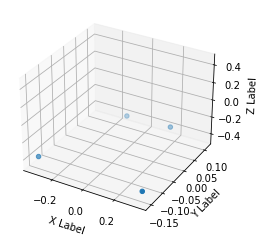

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.175283   0.00552875 0.274711  ]. Coord: [0.346, -0.154, -0.385]. Step size: [0.19999999999999998, -0.032, 0.009000000000000008].


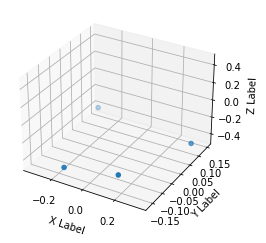

Diff: 268.0. Command: [0.518221 0.       0.      ]. State: [ 0.245935  -0.0187585 -0.0874792]. Coord: [0.148, -0.125, -0.394]. Step size: [-0.19799999999999998, 0.028999999999999998, -0.009000000000000008].


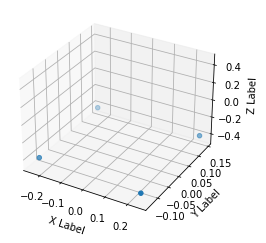

Diff: 11335.0. Command: [0.518221 0.       0.      ]. State: [ 0.185568    0.0353826  -0.00758436]. Coord: [0.238, -0.134, -0.411]. Step size: [0.09, -0.009000000000000008, -0.01699999999999996].


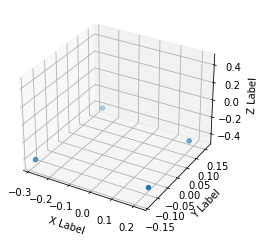

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.252203   0.00706166 0.0488747 ]. Coord: [0.219, -0.106, -0.414]. Step size: [-0.01899999999999999, 0.02800000000000001, -0.0030000000000000027].


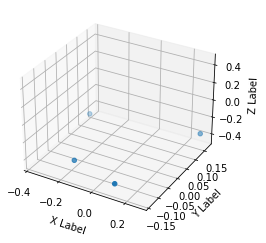

Diff: 257.0. Command: [0.518221 0.       0.      ]. State: [ 0.307568   0.0385228 -0.288814 ]. Coord: [0.112, -0.138, -0.401]. Step size: [-0.107, -0.032000000000000015, 0.012999999999999956].


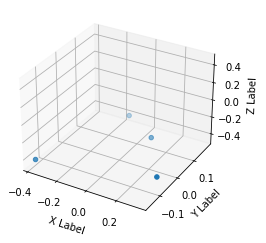

Diff: 275.0. Command: [0.518221 0.       0.      ]. State: [ 0.185495 -0.313894  0.304538]. Coord: [0.337, -0.073, -0.387]. Step size: [0.22500000000000003, 0.06500000000000002, 0.014000000000000012].


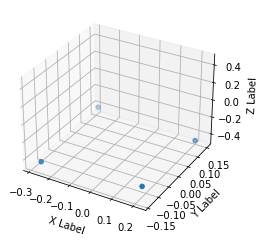

Diff: 23467.0. Command: [0.518221 0.       0.      ]. State: [ 0.378591  -0.0233465  0.0190473]. Coord: [0.194, -0.112, -0.415]. Step size: [-0.14300000000000002, -0.03900000000000001, -0.02799999999999997].


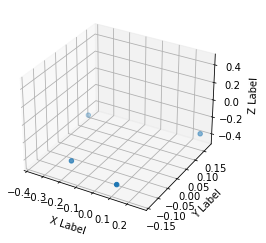

Diff: 257.0. Command: [0.518221 0.       0.      ]. State: [ 0.293099   0.0560179 -0.255791 ]. Coord: [0.114, -0.137, -0.403]. Step size: [-0.08, -0.02500000000000001, 0.011999999999999955].


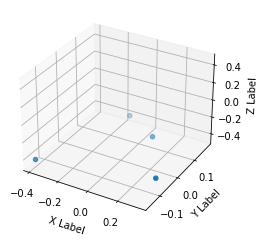

Diff: 277.0. Command: [0.518221 0.       0.      ]. State: [ 0.189925 -0.261759  0.39402 ]. Coord: [0.329, -0.079, -0.389]. Step size: [0.21500000000000002, 0.05800000000000001, 0.014000000000000012].


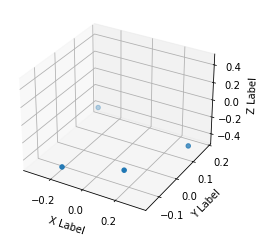

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.207431  -0.138394  -0.0171717]. Coord: [0.148, -0.08, -0.394]. Step size: [-0.18100000000000002, -0.0010000000000000009, -0.0050000000000000044].


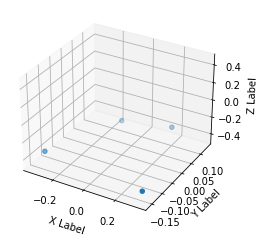

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [0.10909   0.0910524 0.264058 ]. Coord: [0.339, -0.158, -0.383]. Step size: [0.19100000000000003, -0.078, 0.01100000000000001].


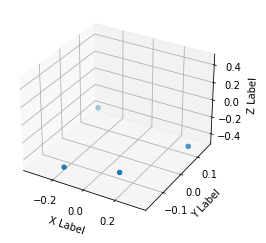

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [ 0.302955 -0.058103 -0.106654]. Coord: [0.139, -0.119, -0.393]. Step size: [-0.2, 0.03900000000000001, -0.010000000000000009].


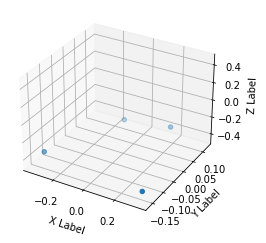

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [0.134301  0.0374381 0.347149 ]. Coord: [0.346, -0.161, -0.386]. Step size: [0.20699999999999996, -0.04200000000000001, 0.007000000000000006].


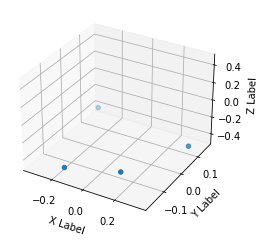

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.265855    0.00934599 -0.0619128 ]. Coord: [0.143, -0.119, -0.396]. Step size: [-0.20299999999999999, 0.04200000000000001, -0.010000000000000009].


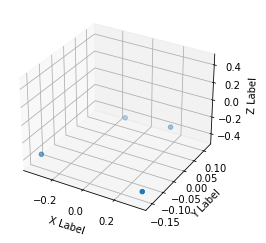

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.166858  0.0584781 0.266189 ]. Coord: [0.346, -0.159, -0.388]. Step size: [0.20299999999999999, -0.04000000000000001, 0.008000000000000007].


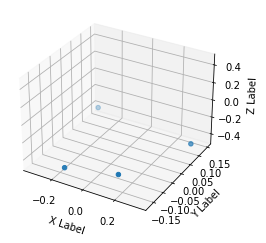

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.241701   0.0262762 -0.0725655]. Coord: [0.145, -0.127, -0.396]. Step size: [-0.20099999999999998, 0.032, -0.008000000000000007].


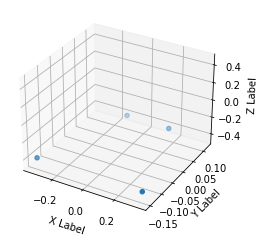

Diff: 266.0. Command: [0.518221 0.       0.      ]. State: [0.195022  0.0185063 0.19162  ]. Coord: [0.346, -0.15, -0.389]. Step size: [0.20099999999999998, -0.022999999999999993, 0.007000000000000006].


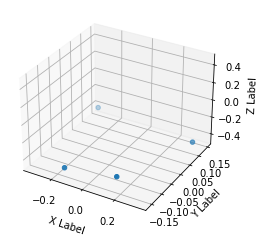

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.201118  -0.0711028 -0.101328 ]. Coord: [0.15, -0.129, -0.395]. Step size: [-0.19599999999999998, 0.02099999999999999, -0.006000000000000005].


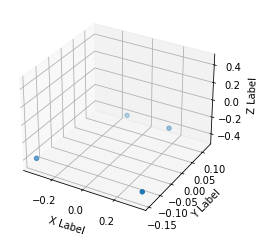

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.184545 0.057041 0.281102]. Coord: [0.345, -0.144, -0.39]. Step size: [0.19499999999999998, -0.014999999999999986, 0.0050000000000000044].


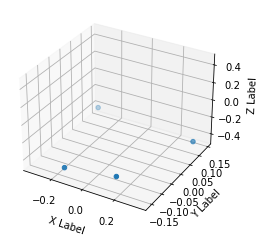

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.234361  -0.0417533 -0.105589 ]. Coord: [0.148, -0.129, -0.395]. Step size: [-0.19699999999999998, 0.014999999999999986, -0.0050000000000000044].


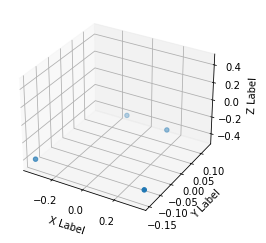

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.205144 0.059223 0.227839]. Coord: [0.346, -0.137, -0.391]. Step size: [0.19799999999999998, -0.008000000000000007, 0.0040000000000000036].


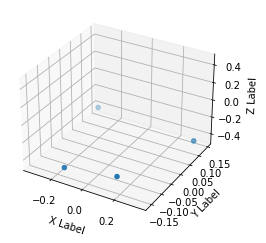

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.226876 -0.049072 -0.094936]. Coord: [0.151, -0.127, -0.396]. Step size: [-0.19499999999999998, 0.010000000000000009, -0.0050000000000000044].


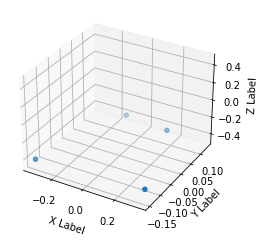

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.190655  0.0763276 0.205469 ]. Coord: [0.343, -0.135, -0.392]. Step size: [0.19200000000000003, -0.008000000000000007, 0.0040000000000000036].


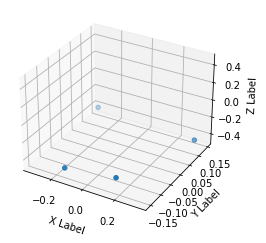

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.178378  -0.0301143 -0.139677 ]. Coord: [0.151, -0.129, -0.396]. Step size: [-0.19200000000000003, 0.006000000000000005, -0.0040000000000000036].


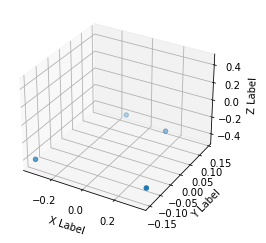

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.208604  0.0648145 0.206534 ]. Coord: [0.343, -0.129, -0.393]. Step size: [0.19200000000000003, 0.0, 0.0030000000000000027].


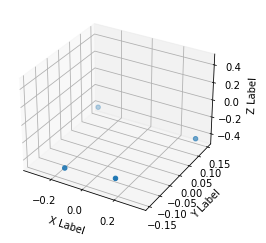

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.159162  -0.0357664 -0.104523 ]. Coord: [0.152, -0.126, -0.397]. Step size: [-0.19100000000000003, 0.0030000000000000027, -0.0040000000000000036].


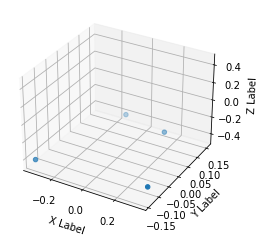

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.23202   0.0434514 0.231035 ]. Coord: [0.341, -0.115, -0.396]. Step size: [0.18900000000000003, 0.010999999999999996, 0.0010000000000000009].


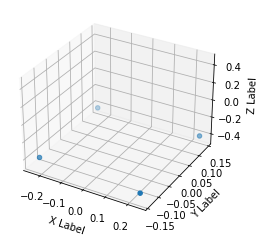

Diff: 17048.0. Command: [0.518221 0.       0.      ]. State: [0.179736   0.00647254 0.0765715 ]. Coord: [0.234, -0.138, -0.413]. Step size: [-0.10700000000000001, -0.023000000000000007, -0.01699999999999996].


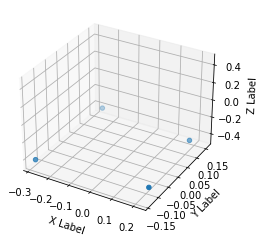

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.247281  -0.0243634  0.0254388]. Coord: [0.219, -0.107, -0.416]. Step size: [-0.015000000000000013, 0.031000000000000014, -0.0030000000000000027].


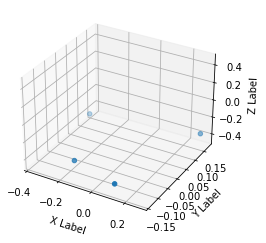

Diff: 255.0. Command: [0.518221 0.       0.      ]. State: [ 0.257472   -0.00998297 -0.219572  ]. Coord: [0.114, -0.136, -0.403]. Step size: [-0.105, -0.029000000000000012, 0.012999999999999956].


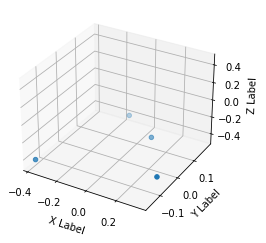

Diff: 276.0. Command: [0.518221 0.       0.      ]. State: [ 0.172147 -0.279044  0.296016]. Coord: [0.338, -0.074, -0.387]. Step size: [0.22400000000000003, 0.06200000000000001, 0.016000000000000014].


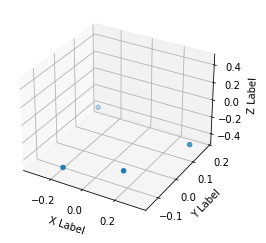

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.206622   -0.173802    0.00093776]. Coord: [0.151, -0.078, -0.396]. Step size: [-0.18700000000000003, -0.0040000000000000036, -0.009000000000000008].


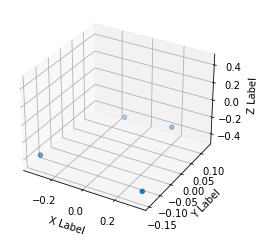

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [0.12273   0.0669671 0.157532 ]. Coord: [0.341, -0.145, -0.385]. Step size: [0.19000000000000003, -0.06699999999999999, 0.01100000000000001].


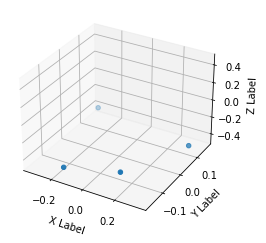

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.267501  -0.0175716 -0.107719 ]. Coord: [0.144, -0.114, -0.393]. Step size: [-0.19700000000000004, 0.030999999999999986, -0.008000000000000007].


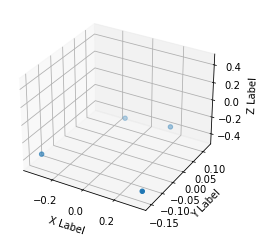

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [0.139887  0.0250811 0.218252 ]. Coord: [0.346, -0.155, -0.384]. Step size: [0.20199999999999999, -0.040999999999999995, 0.009000000000000008].


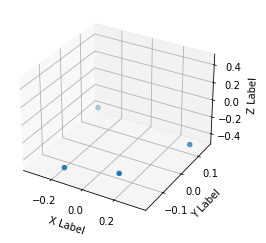

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.236793   0.0998511 -0.0896097]. Coord: [0.146, -0.122, -0.395]. Step size: [-0.19999999999999998, 0.033, -0.01100000000000001].


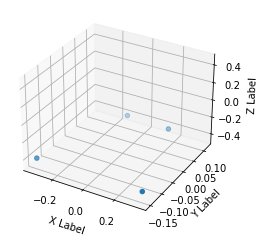

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.182001  0.0399746 0.164988 ]. Coord: [0.346, -0.151, -0.387]. Step size: [0.19999999999999998, -0.028999999999999998, 0.008000000000000007].


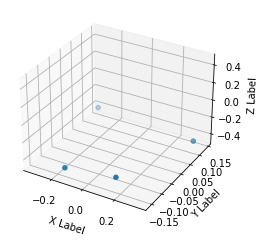

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.19939   -0.0500507 -0.131155 ]. Coord: [0.15, -0.133, -0.394]. Step size: [-0.19599999999999998, 0.017999999999999988, -0.007000000000000006].


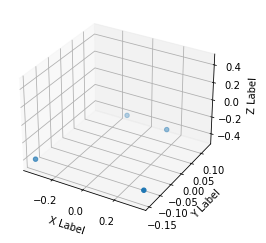

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.21242   0.0374835 0.183098 ]. Coord: [0.345, -0.138, -0.39]. Step size: [0.19499999999999998, -0.0050000000000000044, 0.0040000000000000036].


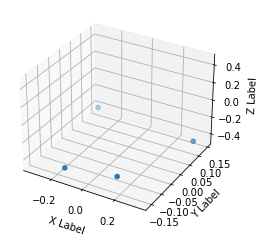

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.20397   -0.0283279 -0.11198  ]. Coord: [0.151, -0.127, -0.395]. Step size: [-0.19399999999999998, 0.01100000000000001, -0.0050000000000000044].


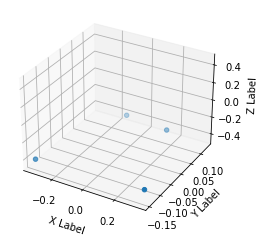

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.200647  0.0529288 0.2321   ]. Coord: [0.344, -0.136, -0.391]. Step size: [0.19299999999999998, -0.009000000000000008, 0.0040000000000000036].


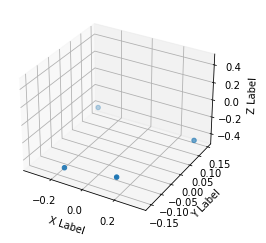

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.194725  -0.0356505 -0.147134 ]. Coord: [0.152, -0.129, -0.395]. Step size: [-0.19199999999999998, 0.007000000000000006, -0.0040000000000000036].


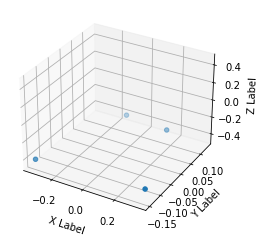

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.220045  0.0764704 0.163923 ]. Coord: [0.344, -0.134, -0.391]. Step size: [0.19199999999999998, -0.0050000000000000044, 0.0040000000000000036].


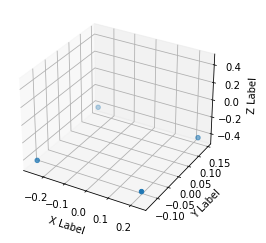

Diff: 15147.0. Command: [0.518221 0.       0.      ]. State: [0.360073  0.0121339 0.0520705]. Coord: [0.221, -0.126, -0.414]. Step size: [-0.12299999999999997, 0.008000000000000007, -0.022999999999999965].


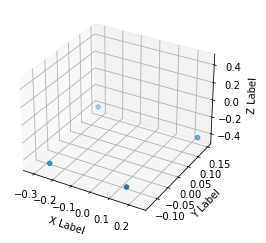

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.274483  -0.0188029 -0.0438033]. Coord: [0.16, -0.128, -0.406]. Step size: [-0.061, -0.0020000000000000018, 0.007999999999999952].


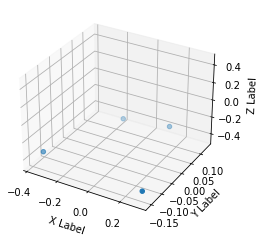

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.128808  -0.0387504  0.306669 ]. Coord: [0.309, -0.155, -0.383]. Step size: [0.149, -0.026999999999999996, 0.02300000000000002].


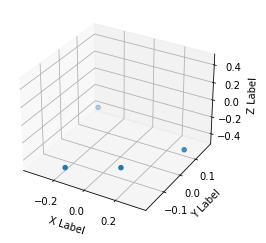

Diff: 277.0. Command: [0.518221 0.       0.      ]. State: [ 0.255978  0.119285 -0.136481]. Coord: [0.117, -0.101, -0.393]. Step size: [-0.192, 0.05399999999999999, -0.010000000000000009].


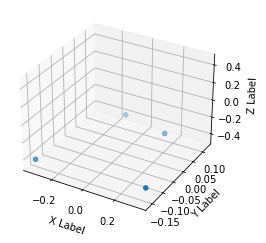

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.202889 0.133899 0.18949 ]. Coord: [0.343, -0.143, -0.386]. Step size: [0.22600000000000003, -0.04199999999999998, 0.007000000000000006].


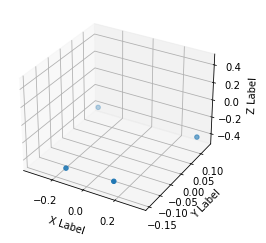

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.103165  -0.0706799 -0.058717 ]. Coord: [0.156, -0.139, -0.394]. Step size: [-0.18700000000000003, 0.003999999999999976, -0.008000000000000007].


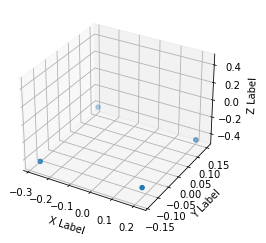

Diff: 6221.0. Command: [0.518221 0.       0.      ]. State: [0.344077  0.0114326 0.022243 ]. Coord: [0.196, -0.114, -0.417]. Step size: [0.04000000000000001, 0.02500000000000001, -0.022999999999999965].


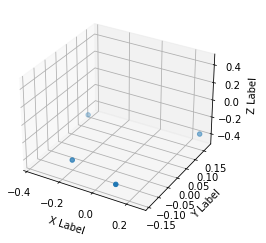

Diff: 257.0. Command: [0.518221 0.       0.      ]. State: [ 0.350526    0.00059986 -0.347404  ]. Coord: [0.111, -0.142, -0.402]. Step size: [-0.085, -0.027999999999999983, 0.014999999999999958].


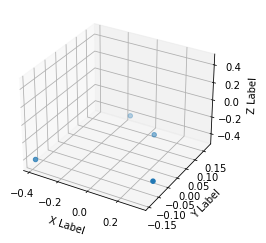

Diff: 277.0. Command: [0.518221 0.       0.      ]. State: [ 0.174588 -0.248253  0.416391]. Coord: [0.33, -0.088, -0.391]. Step size: [0.21900000000000003, 0.05399999999999999, 0.01100000000000001].


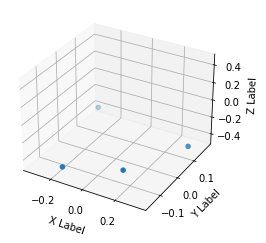

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.184223  -0.109681  -0.0139759]. Coord: [0.144, -0.088, -0.395]. Step size: [-0.18600000000000003, 0.0, -0.0040000000000000036].


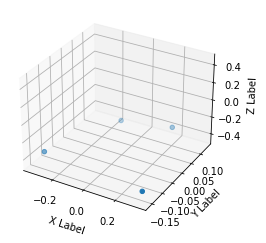

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [0.119318 0.128508 0.22997 ]. Coord: [0.337, -0.159, -0.385]. Step size: [0.19300000000000003, -0.07100000000000001, 0.010000000000000009].


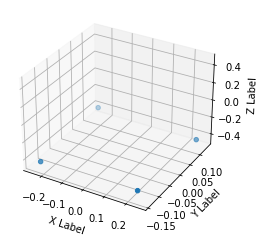

Diff: 1093.0. Command: [0.518221 0.       0.      ]. State: [ 0.411058   0.0502731 -0.034216 ]. Coord: [0.226, -0.134, -0.414]. Step size: [-0.11100000000000002, 0.024999999999999994, -0.02899999999999997].


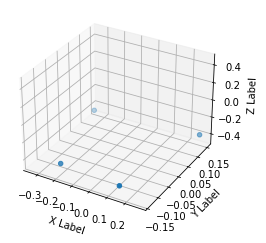

Diff: 259.0. Command: [0.518221 0.       0.      ]. State: [ 0.33678    -0.00095624 -0.185484  ]. Coord: [0.144, -0.137, -0.405]. Step size: [-0.08200000000000002, -0.0030000000000000027, 0.008999999999999952].


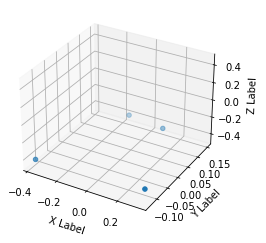

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.107717  -0.0945589  0.374846 ]. Coord: [0.329, -0.118, -0.389]. Step size: [0.18500000000000003, 0.019000000000000017, 0.016000000000000014].


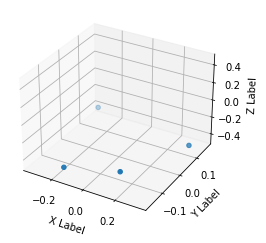

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [ 0.186658   0.0112818 -0.054456 ]. Coord: [0.138, -0.111, -0.393]. Step size: [-0.191, 0.006999999999999992, -0.0040000000000000036].


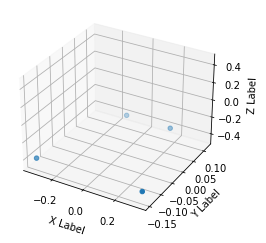

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.149341 0.037193 0.274711]. Coord: [0.34, -0.147, -0.387]. Step size: [0.202, -0.03599999999999999, 0.006000000000000005].


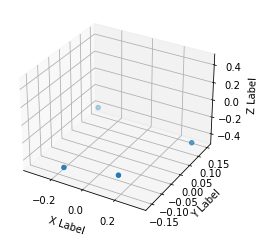

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.219253  -0.0602031 -0.133286 ]. Coord: [0.149, -0.122, -0.394]. Step size: [-0.19100000000000003, 0.024999999999999994, -0.007000000000000006].


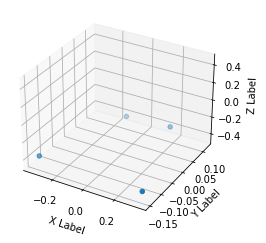

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.166093  0.0106054 0.297081 ]. Coord: [0.346, -0.149, -0.386]. Step size: [0.19699999999999998, -0.026999999999999996, 0.008000000000000007].


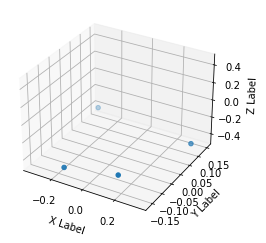

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.240508   -0.00941381 -0.0640434 ]. Coord: [0.148, -0.124, -0.395]. Step size: [-0.19799999999999998, 0.024999999999999994, -0.009000000000000008].


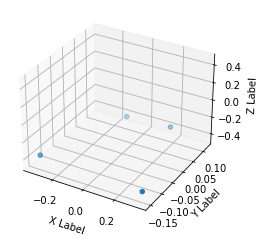

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.159401  0.0142458 0.298147 ]. Coord: [0.346, -0.152, -0.387]. Step size: [0.19799999999999998, -0.027999999999999997, 0.008000000000000007].


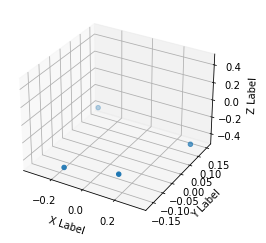

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [ 0.247689    0.00734009 -0.0800223 ]. Coord: [0.146, -0.124, -0.395]. Step size: [-0.19999999999999998, 0.027999999999999997, -0.008000000000000007].


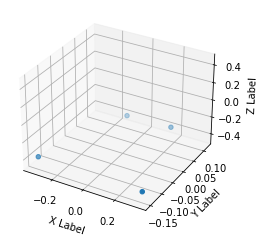

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [0.150942 0.021309 0.258732]. Coord: [0.342, -0.151, -0.389]. Step size: [0.19600000000000004, -0.026999999999999996, 0.006000000000000005].


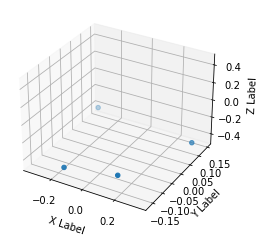

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.210944    0.00204765 -0.0651086 ]. Coord: [0.148, -0.128, -0.394]. Step size: [-0.19400000000000003, 0.022999999999999993, -0.0050000000000000044].


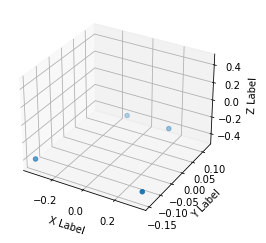

Diff: 268.0. Command: [0.518221 0.       0.      ]. State: [0.212098  0.0185266 0.25234  ]. Coord: [0.342, -0.145, -0.389]. Step size: [0.19400000000000003, -0.016999999999999987, 0.0050000000000000044].


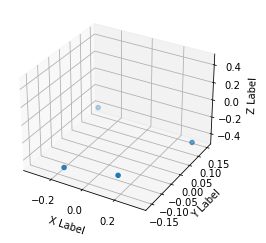

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.208427  -0.0486177 -0.0928055]. Coord: [0.15, -0.123, -0.394]. Step size: [-0.19200000000000003, 0.021999999999999992, -0.0050000000000000044].


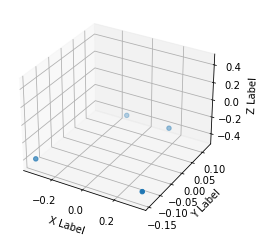

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.186984  0.0385104 0.240622 ]. Coord: [0.345, -0.144, -0.388]. Step size: [0.19499999999999998, -0.02099999999999999, 0.006000000000000005].


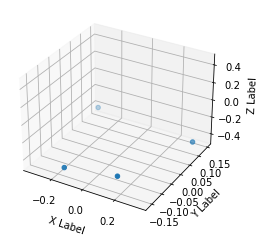

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.213112  -0.0151318 -0.0789571]. Coord: [0.15, -0.127, -0.395]. Step size: [-0.19499999999999998, 0.016999999999999987, -0.007000000000000006].


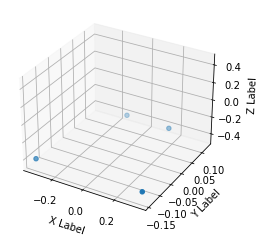

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.177264  0.0438914 0.27258  ]. Coord: [0.345, -0.143, -0.39]. Step size: [0.19499999999999998, -0.015999999999999986, 0.0050000000000000044].


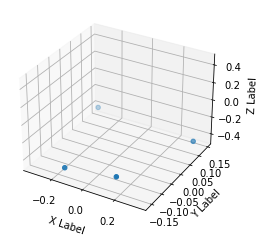

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.213398  -0.0244351 -0.120502 ]. Coord: [0.148, -0.13, -0.395]. Step size: [-0.19699999999999998, 0.012999999999999984, -0.0050000000000000044].


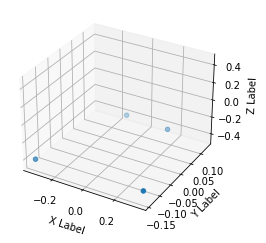

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.196436  0.0651676 0.180967 ]. Coord: [0.345, -0.138, -0.393]. Step size: [0.19699999999999998, -0.008000000000000007, 0.0020000000000000018].


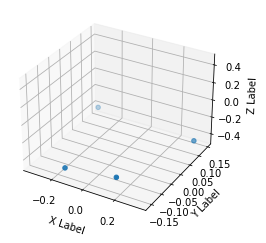

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.222278  -0.0463173 -0.106654 ]. Coord: [0.149, -0.13, -0.398]. Step size: [-0.19599999999999998, 0.008000000000000007, -0.0050000000000000044].


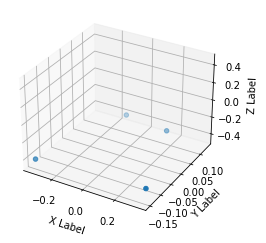

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.202394  0.0787743 0.172445 ]. Coord: [0.342, -0.132, -0.395]. Step size: [0.19300000000000003, -0.0020000000000000018, 0.0030000000000000027].


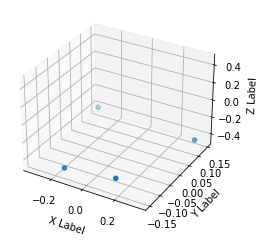

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.156528  -0.0069376 -0.0960013]. Coord: [0.152, -0.127, -0.398]. Step size: [-0.19000000000000003, 0.0050000000000000044, -0.0030000000000000027].


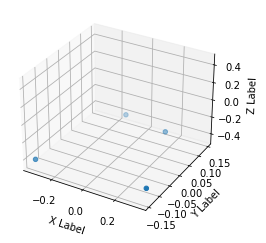

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.207304  0.0633792 0.218252 ]. Coord: [0.34, -0.124, -0.397]. Step size: [0.18800000000000003, 0.0030000000000000027, 0.0010000000000000009].


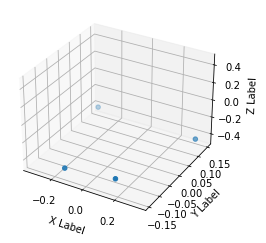

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.177627 -0.067841 -0.119437]. Coord: [0.151, -0.125, -0.399]. Step size: [-0.18900000000000003, -0.0010000000000000009, -0.0020000000000000018].


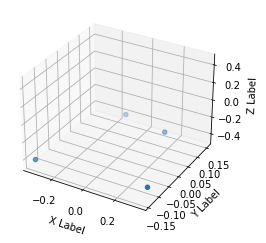

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.230796 0.063157 0.188424]. Coord: [0.34, -0.116, -0.398]. Step size: [0.18900000000000003, 0.008999999999999994, 0.0010000000000000009].


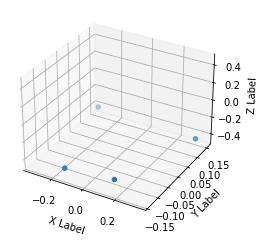

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.173559  -0.0818183 -0.0853487]. Coord: [0.15, -0.121, -0.399]. Step size: [-0.19000000000000003, -0.0049999999999999906, -0.0010000000000000009].


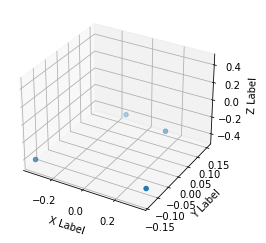

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.229178  0.0393643 0.242753 ]. Coord: [0.34, -0.118, -0.397]. Step size: [0.19000000000000003, 0.0030000000000000027, 0.0020000000000000018].


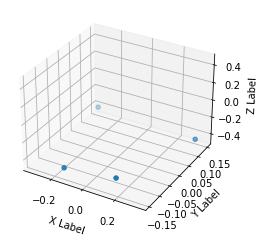

Diff: 266.0. Command: [0.518221 0.       0.      ]. State: [ 0.181927  -0.0874382 -0.126894 ]. Coord: [0.151, -0.123, -0.397]. Step size: [-0.18900000000000003, -0.0050000000000000044, 0.0].


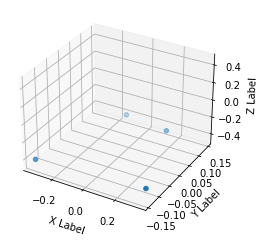

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.21147   0.0883129 0.200142 ]. Coord: [0.34, -0.124, -0.395]. Step size: [0.18900000000000003, -0.0010000000000000009, 0.0020000000000000018].


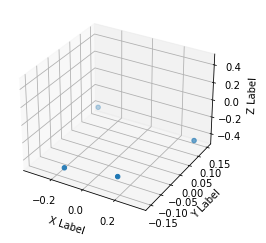

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.186905  -0.0580064 -0.154591 ]. Coord: [0.151, -0.123, -0.397]. Step size: [-0.18900000000000003, 0.0010000000000000009, -0.0020000000000000018].


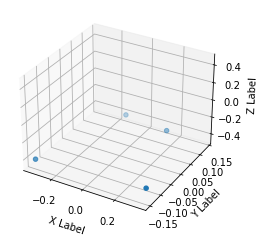

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.181486  0.0823943 0.176706 ]. Coord: [0.341, -0.131, -0.393]. Step size: [0.19000000000000003, -0.008000000000000007, 0.0040000000000000036].


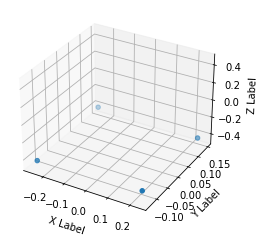

Diff: 18449.0. Command: [0.518221 0.       0.      ]. State: [0.354916  0.0104575 0.0307652]. Coord: [0.223, -0.118, -0.416]. Step size: [-0.11800000000000002, 0.013000000000000012, -0.022999999999999965].


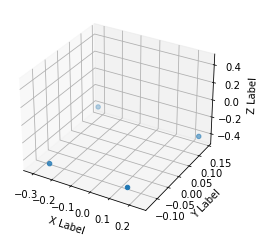

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.21911    -0.00831033 -0.00119277]. Coord: [0.163, -0.127, -0.408]. Step size: [-0.06, -0.009000000000000008, 0.008000000000000007].


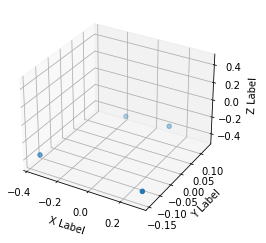

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.14744  -0.100334  0.330104]. Coord: [0.307, -0.144, -0.385]. Step size: [0.144, -0.016999999999999987, 0.022999999999999965].


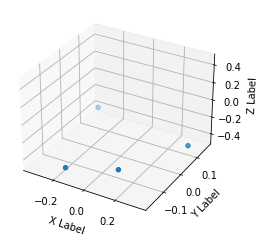

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [ 0.149469  0.156325 -0.184418]. Coord: [0.119, -0.112, -0.39]. Step size: [-0.188, 0.03199999999999999, -0.0050000000000000044].


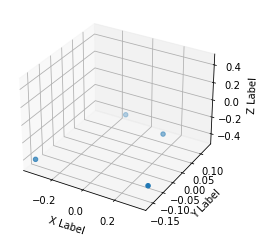

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [0.229537  0.0930041 0.16925  ]. Coord: [0.342, -0.135, -0.387]. Step size: [0.22300000000000003, -0.023000000000000007, 0.0030000000000000027].


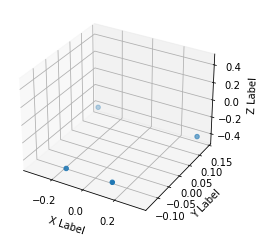

Diff: 259.0. Command: [0.518221 0.       0.      ]. State: [ 0.0818433 -0.0563741 -0.0459339]. Coord: [0.156, -0.133, -0.394]. Step size: [-0.18600000000000003, 0.0020000000000000018, -0.007000000000000006].


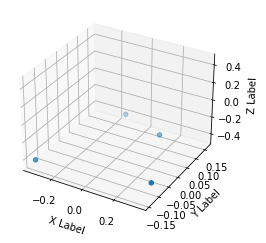

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [ 0.22942   -0.0560655  0.155401 ]. Coord: [0.345, -0.098, -0.391]. Step size: [0.18899999999999997, 0.035, 0.0030000000000000027].


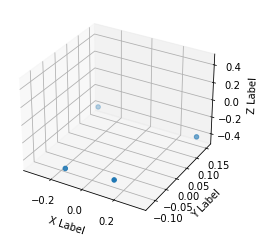

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.109627   -0.0695853  -0.00225803]. Coord: [0.156, -0.111, -0.397]. Step size: [-0.18899999999999997, -0.012999999999999998, -0.006000000000000005].


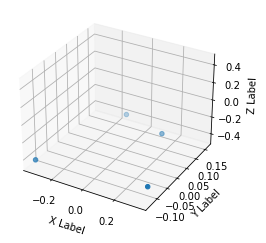

Diff: 275.0. Command: [0.518221 0.       0.      ]. State: [0.242359 0.017541 0.219317]. Coord: [0.344, -0.107, -0.394]. Step size: [0.18799999999999997, 0.0040000000000000036, 0.0030000000000000027].


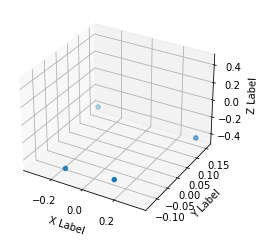

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.147951  -0.0690212 -0.0459339]. Coord: [0.153, -0.118, -0.398]. Step size: [-0.19099999999999998, -0.010999999999999996, -0.0040000000000000036].


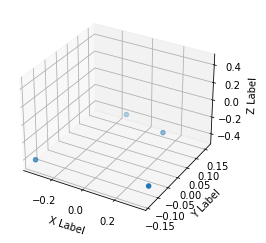

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [0.253916  0.0114192 0.188424 ]. Coord: [0.343, -0.107, -0.397]. Step size: [0.19000000000000003, 0.010999999999999996, 0.0010000000000000009].


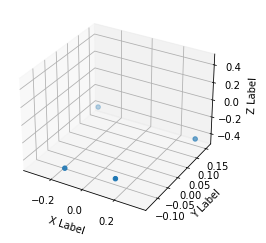

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.158604  -0.0788986 -0.101328 ]. Coord: [0.153, -0.116, -0.398]. Step size: [-0.19000000000000003, -0.009000000000000008, -0.0010000000000000009].


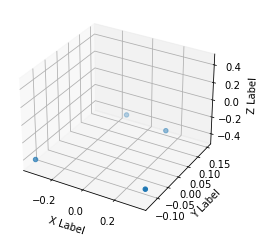

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.229969  0.0487531 0.264058 ]. Coord: [0.343, -0.12, -0.395]. Step size: [0.19000000000000003, -0.00399999999999999, 0.0030000000000000027].


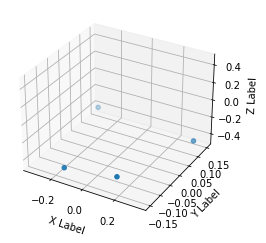

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.216532  -0.0693038 -0.139677 ]. Coord: [0.151, -0.122, -0.396]. Step size: [-0.19200000000000003, -0.0020000000000000018, -0.0010000000000000009].


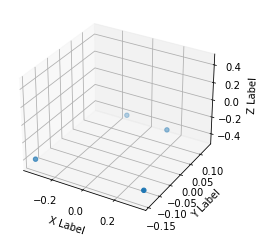

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.211073  0.0434865 0.190555 ]. Coord: [0.344, -0.135, -0.391]. Step size: [0.19299999999999998, -0.013000000000000012, 0.0050000000000000044].


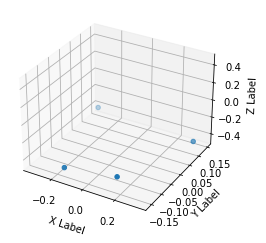

Diff: 266.0. Command: [0.518221 0.       0.      ]. State: [ 0.218354  -0.0375173 -0.116241 ]. Coord: [0.151, -0.128, -0.395]. Step size: [-0.19299999999999998, 0.007000000000000006, -0.0040000000000000036].


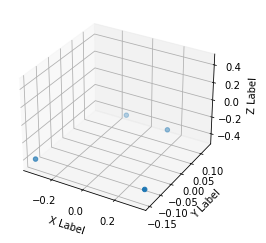

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [0.201539  0.0705857 0.219317 ]. Coord: [0.342, -0.136, -0.391]. Step size: [0.19100000000000003, -0.008000000000000007, 0.0040000000000000036].


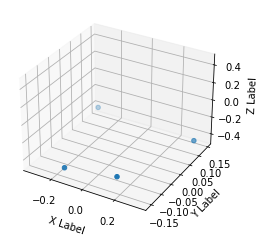

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.209565  -0.0351719 -0.151395 ]. Coord: [0.151, -0.127, -0.395]. Step size: [-0.19100000000000003, 0.009000000000000008, -0.0040000000000000036].


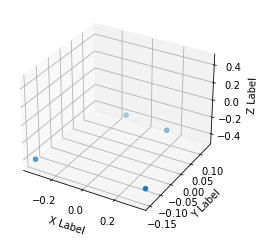

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.202619  0.0983836 0.158597 ]. Coord: [0.343, -0.133, -0.392]. Step size: [0.19200000000000003, -0.006000000000000005, 0.0030000000000000027].


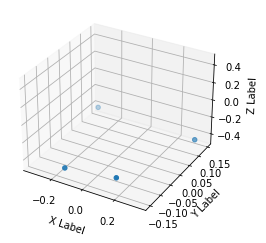

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.15824   -0.0486189 -0.169505 ]. Coord: [0.153, -0.127, -0.396]. Step size: [-0.19000000000000003, 0.006000000000000005, -0.0040000000000000036].


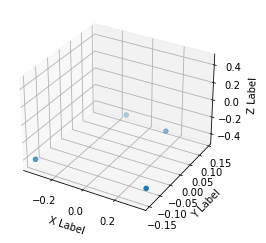

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.229477  0.0617805 0.161793 ]. Coord: [0.341, -0.128, -0.395]. Step size: [0.18800000000000003, -0.0010000000000000009, 0.0010000000000000009].


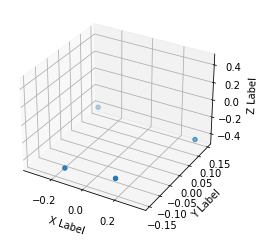

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.176201  -0.0547295 -0.120502 ]. Coord: [0.151, -0.126, -0.397]. Step size: [-0.19000000000000003, 0.0020000000000000018, -0.0020000000000000018].


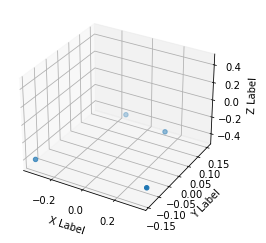

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.241141  0.0449444 0.220382 ]. Coord: [0.341, -0.12, -0.395]. Step size: [0.19000000000000003, 0.006000000000000005, 0.0020000000000000018].


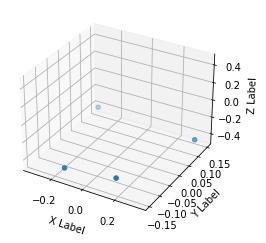

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.163359  -0.0674421 -0.117307 ]. Coord: [0.152, -0.124, -0.397]. Step size: [-0.18900000000000003, -0.0040000000000000036, -0.0020000000000000018].


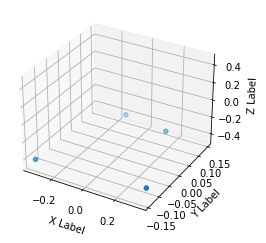

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.191717  0.0679148 0.155401 ]. Coord: [0.34, -0.122, -0.394]. Step size: [0.18800000000000003, 0.0020000000000000018, 0.0030000000000000027].


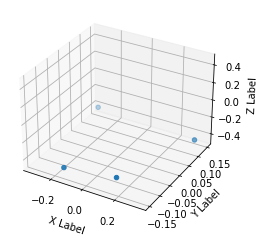

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.174888  -0.0618004 -0.133286 ]. Coord: [0.152, -0.123, -0.396]. Step size: [-0.18800000000000003, -0.0010000000000000009, -0.0020000000000000018].


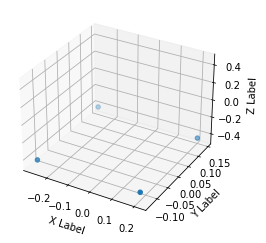

Diff: 15180.0. Command: [0.518221 0.       0.      ]. State: [ 0.253387   -0.0158259   0.00306829]. Coord: [0.203, -0.128, -0.413]. Step size: [0.05100000000000002, -0.0050000000000000044, -0.01699999999999996].


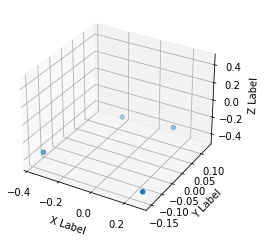

Diff: 259.0. Command: [0.518221 0.       0.      ]. State: [ 0.246428  -0.0579072  0.308799 ]. Coord: [0.281, -0.153, -0.39]. Step size: [0.07800000000000001, -0.024999999999999994, 0.022999999999999965].


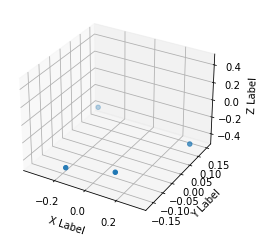

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.127779  0.143981 -0.247269]. Coord: [0.109, -0.122, -0.391]. Step size: [-0.17200000000000004, 0.031, -0.0010000000000000009].


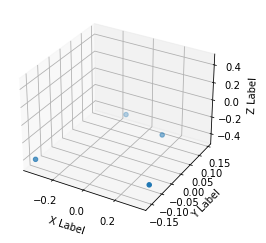

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [0.223134 0.139796 0.170315]. Coord: [0.34, -0.123, -0.39]. Step size: [0.23100000000000004, -0.0010000000000000009, 0.0010000000000000009].


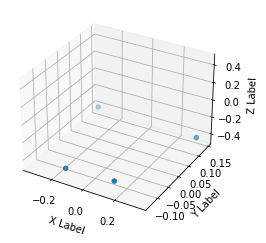

Diff: 261.0. Command: [0.518221 0.       0.      ]. State: [ 0.108658  -0.0601647 -0.0576518]. Coord: [0.157, -0.125, -0.396]. Step size: [-0.18300000000000002, -0.0020000000000000018, -0.006000000000000005].


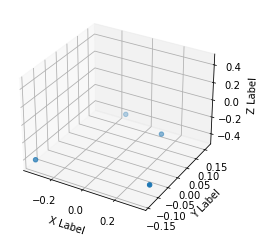

Diff: 273.0. Command: [0.518221 0.       0.      ]. State: [ 0.244623  -0.0122622  0.17138  ]. Coord: [0.341, -0.103, -0.395]. Step size: [0.18400000000000002, 0.022000000000000006, 0.0010000000000000009].


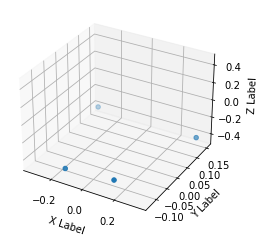

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.149126  -0.0544792 -0.0597823]. Coord: [0.153, -0.116, -0.398]. Step size: [-0.18800000000000003, -0.013000000000000012, -0.0030000000000000027].


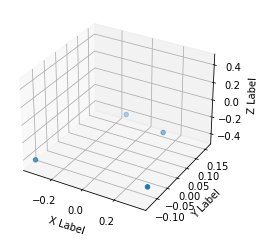

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [ 0.208058   -0.00399423  0.275776  ]. Coord: [0.344, -0.108, -0.394]. Step size: [0.19099999999999998, 0.008000000000000007, 0.0040000000000000036].


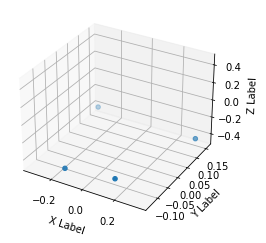

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.155007  -0.0728298 -0.110915 ]. Coord: [0.151, -0.117, -0.397]. Step size: [-0.19299999999999998, -0.009000000000000008, -0.0030000000000000027].


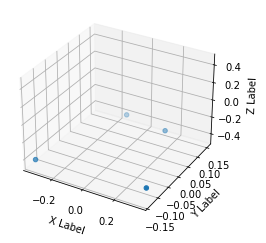

Diff: 270.0. Command: [0.518221 0.       0.      ]. State: [0.213922  0.0332596 0.254471 ]. Coord: [0.345, -0.117, -0.393]. Step size: [0.19399999999999998, 0.0, 0.0040000000000000036].


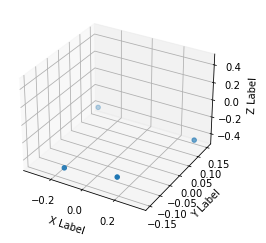

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.161923  -0.0892369 -0.100262 ]. Coord: [0.153, -0.121, -0.396]. Step size: [-0.19199999999999998, -0.00399999999999999, -0.0030000000000000027].


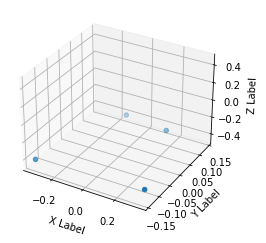

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.214931  0.0406621 0.215056 ]. Coord: [0.342, -0.13, -0.392]. Step size: [0.18900000000000003, -0.009000000000000008, 0.0040000000000000036].


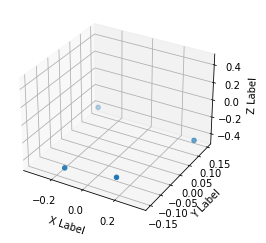

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.204372  -0.0428936 -0.154591 ]. Coord: [0.15, -0.126, -0.395]. Step size: [-0.19200000000000003, 0.0040000000000000036, -0.0030000000000000027].


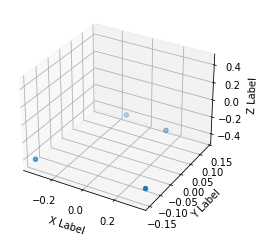

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.206231  0.0636392 0.147944 ]. Coord: [0.344, -0.132, -0.391]. Step size: [0.19399999999999998, -0.006000000000000005, 0.0040000000000000036].


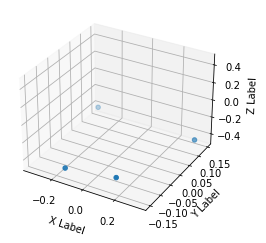

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.185571  -0.0481203 -0.127959 ]. Coord: [0.15, -0.126, -0.397]. Step size: [-0.19399999999999998, 0.006000000000000005, -0.006000000000000005].


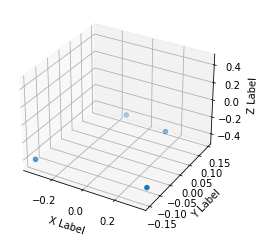

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.226878  0.0789528 0.218252 ]. Coord: [0.342, -0.125, -0.395]. Step size: [0.19200000000000003, 0.0010000000000000009, 0.0020000000000000018].


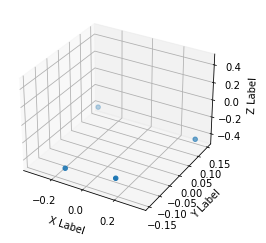

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.182682  -0.0785098 -0.136481 ]. Coord: [0.151, -0.124, -0.398]. Step size: [-0.19100000000000003, 0.0010000000000000009, -0.0030000000000000027].


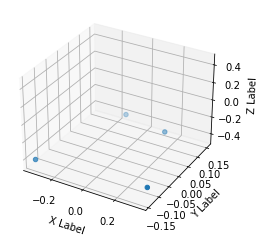

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.247267  0.0694628 0.18949  ]. Coord: [0.341, -0.117, -0.398]. Step size: [0.19000000000000003, 0.006999999999999992, 0.0].


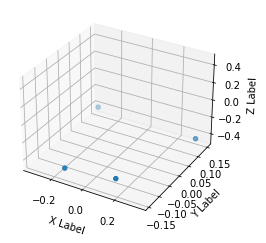

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.158532  -0.0818161 -0.0821529]. Coord: [0.153, -0.123, -0.399]. Step size: [-0.18800000000000003, -0.0059999999999999915, -0.0010000000000000009].


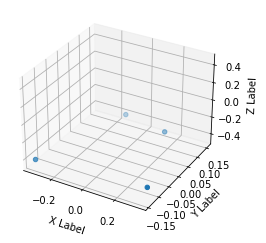

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.222975  0.0502275 0.204403 ]. Coord: [0.341, -0.117, -0.397]. Step size: [0.18800000000000003, 0.0059999999999999915, 0.0020000000000000018].


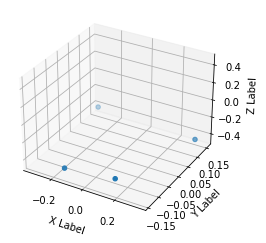

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.178641 -0.102459 -0.105589]. Coord: [0.15, -0.121, -0.399]. Step size: [-0.19100000000000003, -0.00399999999999999, -0.0020000000000000018].


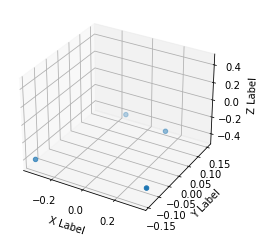

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.213731 0.085999 0.21186 ]. Coord: [0.341, -0.121, -0.396]. Step size: [0.19100000000000003, 0.0, 0.0030000000000000027].


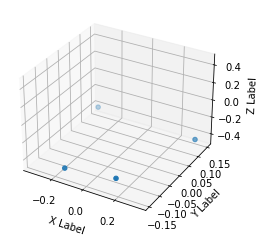

Diff: 267.0. Command: [0.518221 0.       0.      ]. State: [ 0.184423  -0.0760079 -0.141808 ]. Coord: [0.151, -0.124, -0.398]. Step size: [-0.19000000000000003, -0.0030000000000000027, -0.0020000000000000018].


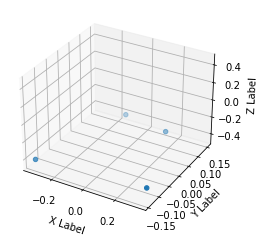

Diff: 270.0. Command: [0.518221 0.       0.      ]. State: [0.226583  0.0775994 0.215056 ]. Coord: [0.339, -0.12, -0.397]. Step size: [0.18800000000000003, 0.0040000000000000036, 0.0010000000000000009].


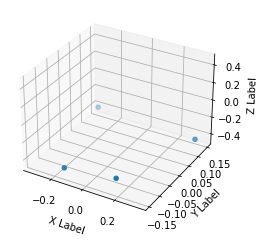

Diff: 263.0. Command: [0.518221 0.       0.      ]. State: [ 0.161961  -0.0481808 -0.0970666]. Coord: [0.153, -0.124, -0.397]. Step size: [-0.18600000000000003, -0.0040000000000000036, 0.0].


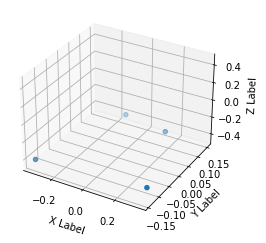

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.229259  0.0412546 0.233165 ]. Coord: [0.339, -0.119, -0.396]. Step size: [0.18600000000000003, 0.0050000000000000044, 0.0010000000000000009].


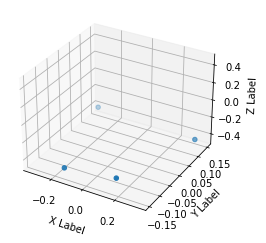

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.185648  -0.0572209 -0.13009  ]. Coord: [0.152, -0.124, -0.397]. Step size: [-0.18700000000000003, -0.0050000000000000044, -0.0010000000000000009].


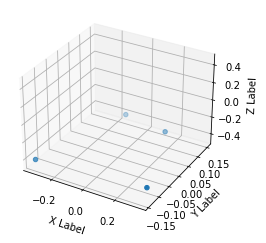

Diff: 271.0. Command: [0.518221 0.       0.      ]. State: [0.249032  0.0611194 0.207599 ]. Coord: [0.339, -0.119, -0.396]. Step size: [0.18700000000000003, 0.0050000000000000044, 0.0010000000000000009].


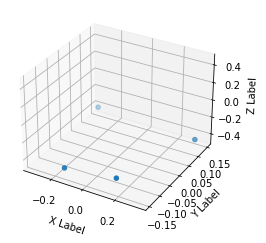

Diff: 265.0. Command: [0.518221 0.       0.      ]. State: [ 0.191469  -0.0792603 -0.13222  ]. Coord: [0.152, -0.124, -0.397]. Step size: [-0.18700000000000003, -0.0050000000000000044, -0.0010000000000000009].


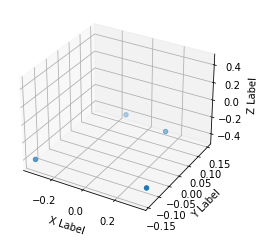

Diff: 269.0. Command: [0.518221 0.       0.      ]. State: [0.227218  0.0553838 0.22997  ]. Coord: [0.34, -0.121, -0.395]. Step size: [0.18800000000000003, 0.0030000000000000027, 0.0020000000000000018].


KeyboardInterrupt: 

In [43]:
visualize_static_foosteps(motion_05_fwd, footsteps_05_fwd)

In [ ]:
anim = visualize_animated_footsteps(motion_05_fwd, footsteps_05_fwd, "bo")
HTML(anim.to_html5_video())

### Backward motion

In [ ]:
anim = visualize_animated_footsteps(motion_05_bwd, footsteps_05_bwd, "bo")
HTML(anim.to_html5_video())

### Side motion (right)

In [ ]:
anim = visualize_animated_footsteps(motion_05_side_right, footsteps_05_side_right, "bo")
HTML(anim.to_html5_video())

### Side motion (left)

In [ ]:
anim = visualize_animated_footsteps(motion_05_side_left, footsteps_05_side_left, "bo")
HTML(anim.to_html5_video())

### Rotation (clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_05_clock, footsteps_05_clock, "bo")
HTML(anim.to_html5_video())

### Rotation (counter clockwise)

In [ ]:
anim = visualize_animated_footsteps(motion_05_count, footsteps_05_count, "bo")
HTML(anim.to_html5_video())

# Multivariate Linear Regression (FR foot prediction)

The input will use initially only:

- **HighCmd: fwd, side, rot speeds**
- **HighState: fwd, side, rot speeds, footPosition2Body (FR)**

and as output we seek to predict the following:

- **footPosition2Body (FR)**

In [44]:
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [45]:
def plot_target_and_predictions(title: str, predictions, target):
    fig, ax1 = plt.subplots(1,1, figsize=(15,10))
    fig.suptitle(title)
    
    # FR plot (height)
    ax1.plot(range(predictions.shape[0]), predictions, 'b-')
    ax1.set_ylabel('Predictions')
    ax1.set_xlabel('Time')
         
    # FR plot (force)
    ax2 = ax1.twinx()
    ax2.plot(range(predictions.shape[0]), target, 'g-')
    ax2.set_ylabel('Target', color='g')

    for tl in ax2.get_yticklabels():
        tl.set_color('g')
    
    fig.tight_layout()
    plt.show()

In [46]:
def create_timestamp_consistent_dataset(dataset, footsteps):
    # Footsteps sizes
    inputs = []
    labels = []
        
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx > 0:
            time_diff = dataset[footsteps[idx], 0] - dataset[footsteps[idx-1], 0]
            
            if time_diff < 300:
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                labels.append(dataset[footsteps[idx], 32:44])
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy

X_motion_05_fwd_3D, Y_motion_05_fwd_3D = create_timestamp_consistent_dataset(motion_05_fwd, footsteps_05_fwd)
X_motion_05_bwd_3D, Y_motion_05_bwd_3D = create_timestamp_consistent_dataset(motion_05_bwd, footsteps_05_bwd)
X_motion_05_clock_3D, Y_motion_05_clock_3D = create_timestamp_consistent_dataset(motion_05_clock, footsteps_05_clock)
X_motion_05_count_3D, Y_motion_05_count_3D = create_timestamp_consistent_dataset(motion_05_count, footsteps_05_count)
X_motion_05_side_left_3D, Y_motion_05_side_left_3D = create_timestamp_consistent_dataset(motion_05_side_left, footsteps_05_side_left)
X_motion_05_side_right_3D, Y_motion_05_side_right_3D = create_timestamp_consistent_dataset(motion_05_side_right, footsteps_05_side_right)

# Stack datasets
X_motion_05_3D = np.concatenate((X_motion_05_fwd_3D, X_motion_05_bwd_3D, X_motion_05_side_right_3D, X_motion_05_side_left_3D, X_motion_05_clock_3D, X_motion_05_count_3D))
Y_motion_05_3D = np.concatenate((Y_motion_05_fwd_3D, Y_motion_05_bwd_3D, Y_motion_05_side_right_3D, Y_motion_05_side_left_3D, Y_motion_05_clock_3D, Y_motion_05_count_3D))

In [50]:
%store X_motion_05_3D
%store Y_motion_05_3D

Stored 'X_motion_05_3D' (ndarray)
Stored 'Y_motion_05_3D' (ndarray)


In [47]:
def create_timestamp_consistent_dataset_with_step_size_labels(dataset, footsteps, threshold=0.04):
    # Footsteps sizes
    inputs = []
    labels = []
            
    # Compute step sizes
    for idx, footstep in enumerate(footsteps):
        if idx < (len(footsteps) - 1):
            time_diff = abs(dataset[footsteps[idx], 0] - dataset[footsteps[idx+1], 0])
            
            if time_diff < 300:
                # Input (command, state, x/y/z position for each foot)
                #inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + dataset[footsteps[idx-1], 32:44].tolist())
                
                # Find closest timestamp with gap of 100 (to know which foot is moving)
                absolute_val_array = np.abs(dataset[:, 0] - (dataset[footstep, 0] + 100))
                idx_height_check = absolute_val_array.argmin()
                
                fr_moving = np.abs(dataset[footstep, 34] - dataset[idx_height_check, 34]) > threshold
                fl_moving = np.abs(dataset[footstep, 37] - dataset[idx_height_check, 37]) > threshold
                rr_moving = np.abs(dataset[footstep, 40] - dataset[idx_height_check, 40]) > threshold
                rl_moving = np.abs(dataset[footstep, 43] - dataset[idx_height_check, 43]) > threshold

                assert fr_moving == rl_moving
                assert rr_moving == fl_moving
                assert fr_moving != fl_moving
                
                # Compute FR movement
                fr_movement_x = abs(abs(dataset[footstep, 32]) - abs(dataset[footsteps[idx+1], 32]))
                fr_movement_y = abs(abs(dataset[footstep, 33]) - abs(dataset[footsteps[idx+1], 33]))
                
                # Compute FL movement
                fl_movement_x = abs(abs(dataset[footstep, 35]) - abs(dataset[footsteps[idx+1], 35]))
                fl_movement_y = abs(abs(dataset[footstep, 36]) - abs(dataset[footsteps[idx+1], 36]))
                
                # Compute RR movement
                rr_movement_x = abs(abs(dataset[footstep, 38]) - abs(dataset[footsteps[idx+1], 38]))
                rr_movement_y = abs(abs(dataset[footstep, 39]) - abs(dataset[footsteps[idx+1], 39]))
                
                # Compute RL movement
                rl_movement_x = abs(abs(dataset[footstep, 41]) - abs(dataset[footsteps[idx+1], 41]))
                rl_movement_y = abs(abs(dataset[footstep, 42]) - abs(dataset[footsteps[idx+1], 42]))
                
                label = []
                                
                if fr_moving:
                    label.append([fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, 0, 0, 0, 0, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y])
                elif fl_moving:
                    label.append([0, 0, fr_movement_x + fl_movement_x, fr_movement_y + fl_movement_y, rr_movement_x + rl_movement_x, rr_movement_y + rl_movement_y, 0, 0])
                else:
                    print("\nERROR")
                    
                labels.append(label)
                inputs.append(dataset[footsteps[idx-1], 2:5].tolist() + dataset[footsteps[idx-1], 25:28].tolist() + [int(fr_moving), int(fl_moving), int(rr_moving), int(rl_moving)])
                
            else:
                continue
                    
    # Convert to numpy array
    inputs_numpy = np.array(inputs)
    labels_numpy = np.array(labels)
    
    return inputs_numpy, labels_numpy.reshape(labels_numpy.shape[0], labels_numpy.shape[2])

X_motion_05_fwd_step, Y_motion_05_fwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_fwd, footsteps_05_fwd)
X_motion_05_bwd_step, Y_motion_05_bwd_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_bwd, footsteps_05_bwd)
X_motion_05_clock_step, Y_motion_05_clock_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_clock, footsteps_05_clock)
X_motion_05_count_step, Y_motion_05_count_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_count, footsteps_05_count)
X_motion_05_side_left_step, Y_motion_05_side_left_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_side_left, footsteps_05_side_left)
X_motion_05_side_right_step, Y_motion_05_side_right_step = create_timestamp_consistent_dataset_with_step_size_labels(motion_05_side_right, footsteps_05_side_right)

# Stack datasets
X_motion_05_step = np.concatenate((X_motion_05_fwd_step, X_motion_05_bwd_step, X_motion_05_side_right_step, X_motion_05_side_left_step, X_motion_05_clock_step, X_motion_05_count_step))
Y_motion_05_step = np.concatenate((Y_motion_05_fwd_step, Y_motion_05_bwd_step, Y_motion_05_side_right_step, Y_motion_05_side_left_step, Y_motion_05_clock_step, Y_motion_05_count_step))

In [48]:
%store X_motion_05_step
%store Y_motion_05_step

Stored 'X_motion_05_step' (ndarray)
Stored 'Y_motion_05_step' (ndarray)


In [49]:
def labels_stats(dataset, title):
    print(f'Statistics for {title} motion\n')
    
    # Find all positive movements in x and y for FR
    fr_steps_x = np.where(dataset[:, 0] > 0)[0]
    fr_steps_y = np.where(dataset[:, 1] > 0)[0]
    
    # Find all positive movements in x and y for FR
    fl_steps_x = np.where(dataset[:, 2] > 0)[0]
    fl_steps_y = np.where(dataset[:, 3] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rr_steps_x = np.where(dataset[:, 4] > 0)[0]
    rr_steps_y = np.where(dataset[:, 5] > 0)[0]
    
    # Find all positive movements in x and y for FR
    rl_steps_x = np.where(dataset[:, 6] > 0)[0]
    rl_steps_y = np.where(dataset[:, 7] > 0)[0]
    
    # Compute stats for FR foot
    print(f'FR mean x step: {np.mean(dataset[fr_steps_x, 0])}. FR std x step: {np.std(dataset[fr_steps_x, 0])}. FR mean y step: {np.mean(dataset[fr_steps_y, 1])}. FR std y step: {np.mean(dataset[fr_steps_y, 1])}')
 
    # Compute stats for FL foot
    print(f'FL mean x step: {np.mean(dataset[fl_steps_x, 2])}. FL std x step: {np.std(dataset[fl_steps_x, 2])}. FL mean y step: {np.mean(dataset[fl_steps_y, 3])}. FL std y step: {np.mean(dataset[fl_steps_y, 3])}')
    
    # Compute stats for RR foot
    print(f'RR mean x step: {np.mean(dataset[rr_steps_x, 4])}. RR std x step: {np.std(dataset[rr_steps_x, 4])}. RR mean y step: {np.mean(dataset[rr_steps_y, 5])}. RR std y step: {np.mean(dataset[rr_steps_y, 5])}')
    
    # Compute stats for RL foot
    print(f'RL mean x step: {np.mean(dataset[rl_steps_x, 6])}. RL std x step: {np.std(dataset[rl_steps_x, 6])}. RL mean y step: {np.mean(dataset[rl_steps_y, 7])}. RL std y step: {np.mean(dataset[rl_steps_y, 7])}\n')
    
labels_stats(Y_motion_05_fwd_step, "forward")
labels_stats(Y_motion_05_bwd_step, "backward")
labels_stats(Y_motion_05_clock_step, "clockwise")
labels_stats(Y_motion_05_count_step, "counter clockwise")
labels_stats(Y_motion_05_side_left_step, "left step")
labels_stats(Y_motion_05_side_right_step, "right step")

Statistics for forward motion

FR mean x step: 0.3680555555555556. FR std x step: 0.060203564145343336. FR mean y step: 0.033901408450704225. FR std y step: 0.033901408450704225
FL mean x step: 0.3568219178082192. FL std x step: 0.08415614034617942. FL mean y step: 0.02838356164383562. FL std y step: 0.02838356164383562
RR mean x step: 0.3611095890410959. RR std x step: 0.08106560198912059. RR mean y step: 0.03434246575342465. RR std y step: 0.03434246575342465
RL mean x step: 0.37247222222222226. RL std x step: 0.05975551397668072. RL mean y step: 0.03886111111111111. RL std y step: 0.03886111111111111

Statistics for backward motion

FR mean x step: 0.15048324324324325. FR std x step: 0.025153330179182937. FR mean y step: 0.049449486486486484. FR std y step: 0.049449486486486484
FL mean x step: 0.14941266666666667. FL std x step: 0.025830408791448375. FL mean y step: 0.05014852777777778. FL std y step: 0.05014852777777778
RR mean x step: 0.15501686111111113. RR std x step: 0.02738878